### 1. Data preparation

## 1.1 Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import clear_output
import math

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
from sklearn.preprocessing import StandardScaler
from tqdm.notebook import tqdm

## 1.2 Prepare dictionary

In [96]:
data = pd.read_csv("runs/test1/fixed_data.csv")

In [133]:
broken_pairs = []
network_dict = {}

num_networks = 0
#or i in range(1):
for i in range(int((data['pair_id']).max())+1):
    try:
        downstream = data[(data['pair_id']== i) & (data['du'] == 'd')]
        upstream = data[(data['pair_id']== i) & (data['du'] == 'u')]
        #print(downstream)
        #print(upstream)
        if downstream.empty or downstream.isnull().values.any():
            print(i, " DS is empty")
            continue
        if upstream.empty or upstream.isnull().values.any():
            print(i, " US is empty")
            continue
        '''area_ratio = upstream.iloc[0]["Shape_Area"] / downstream.iloc[0]["Shape_Area"]
        if area_ratio > 1:
            print(i, " area ratio too large")
            continue
        if abs(downstream.iloc[-1]['ID'] - upstream.iloc[-1]['ID']) > 100:
            print(i, " DS and US too far apart")
            continue'''
        network = downstream.merge(upstream, on="time")
        network.drop(["x_x", "y_x", "pair_id_x", "x_y", "y_y", "pair_id_y"], axis=1, inplace=True)
        network_dict[num_networks] = network
        num_networks += 1
    except:
        broken_pairs.append(i)
        raise Exception
        break


107  DS is empty
155  DS is empty
296  DS is empty
319  DS is empty
332  DS is empty
345  DS is empty
349  DS is empty
371  US is empty
374  DS is empty
403  DS is empty
405  DS is empty
412  US is empty
422  DS is empty
424  DS is empty
455  DS is empty
456  DS is empty
465  DS is empty
486  DS is empty
508  DS is empty
535  DS is empty
536  DS is empty
537  US is empty
557  US is empty
579  US is empty
582  DS is empty
613  US is empty
637  DS is empty
674  US is empty
690  US is empty
704  US is empty
761  DS is empty
802  DS is empty
808  DS is empty
812  DS is empty
821  US is empty
910  DS is empty
946  DS is empty
957  DS is empty


In [134]:
for colname in network_dict[0].columns:
    print(colname)

Unnamed: 0.3_x
Unnamed: 0.2_x
Unnamed: 0.1_x
time
DLWRF_surface_x
PRES_surface_x
SPFH_2maboveground_x
precip_rate_x
DSWRF_surface_x
TMP_2maboveground_x
UGRD_10maboveground_x
VGRD_10maboveground_x
APCP_surface_x
streamflow_x
elevation_mean_x
slope_mean_x
impervious_mean_x
aspect_c_mean_x
twi_dist_4_x
X_x
Y_x
gw_Coeff_x
gw_Zmax_x
gw_Expon_x
bexp_soil_layers_stag=1_x
bexp_soil_layers_stag=2_x
bexp_soil_layers_stag=3_x
bexp_soil_layers_stag=4_x
ISLTYP_x
IVGTYP_x
dksat_soil_layers_stag=1_x
dksat_soil_layers_stag=2_x
dksat_soil_layers_stag=3_x
dksat_soil_layers_stag=4_x
psisat_soil_layers_stag=1_x
psisat_soil_layers_stag=2_x
psisat_soil_layers_stag=3_x
psisat_soil_layers_stag=4_x
cwpvt_x
mfsno_x
mp_x
quartz_soil_layers_stag=1_x
quartz_soil_layers_stag=2_x
quartz_soil_layers_stag=3_x
quartz_soil_layers_stag=4_x
refkdt_x
slope_x
smcmax_soil_layers_stag=1_x
smcmax_soil_layers_stag=2_x
smcmax_soil_layers_stag=3_x
smcmax_soil_layers_stag=4_x
smcwlt_soil_layers_stag=1_x
smcwlt_soil_layers_stag=2_x

## 1.3 Define modeling setup

In [135]:
lstm_inputs = ['precip_rate_x', 'APCP_surface_x', 'TMP_2maboveground_x', 
    'DSWRF_surface_x', 'DLWRF_surface_x', 'PRES_surface_x', 
    'UGRD_10maboveground_x', 'VGRD_10maboveground_x', 'SPFH_2maboveground_x', 
    'elevation_mean_x', 'slope_mean_x', 'Shape_Leng_x', 'Shape_Area_x',
    'impervious_mean_x', 'dksat_soil_layers_stag=1_x', 'streamflow_x',
    'precip_rate_y', 'APCP_surface_y', 'TMP_2maboveground_y',
    'DSWRF_surface_y', 'DLWRF_surface_y', 'PRES_surface_y',
    'UGRD_10maboveground_y', 'VGRD_10maboveground_y', 'SPFH_2maboveground_y',
    'elevation_mean_y', 'slope_mean_y', 'Shape_Leng_y', 'Shape_Area_y',
    'impervious_mean_y', 'dksat_soil_layers_stag=1_y']

n_input = len(lstm_inputs)

lstm_outputs = ['streamflow_y']
n_output = len(lstm_outputs)

In [136]:
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    print("Using CUDA device:", torch.cuda.get_device_name(0))
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using Apple M3/M2/M1 (Metal) device")
else:
    device = 'cpu'
    print("Using CPU")
hidden_state_size = ( n_input + n_output ) * 3
num_layers = 1
num_epochs = 8
batch_size = 256
seq_length = 5
learning_rate = np.linspace(start=0.1, stop=0.00001, num=num_epochs)

Using CUDA device: NVIDIA GeForce RTX 3060


In [137]:
n_networks = len(network_dict)
print(n_networks)
n_timesteps = len(network_dict[0])

n_networks_split = {"train": math.floor(n_networks*0.7),
    "val": math.floor(n_networks*0.2),
    "test": math.floor(n_networks*0.1)}

time_splits = {"train": math.floor(n_timesteps*0.7),
    "val": math.floor(n_timesteps*0.2),
    "test": math.floor(n_timesteps*0.1)}

961


In [138]:
def split_parameters():
    # create lists of network indices for each set based on the given network splits
    networks_for_training = list(range(0, n_networks_split['train'] + 1))
    networks_for_val = list(range(n_networks_split['train'] + 1, 
                                 n_networks_split['train'] + n_networks_split['val'] + 1))
    networks_for_test = list(range(n_networks - n_networks_split['test'], n_networks))

    # determine the time range for each set based on the given time splits
    train_start = seq_length
    train_end   = time_splits["train"]
    val_start   = train_end + seq_length
    val_end     = val_start + time_splits["val"]
    test_start  = val_end + seq_length
    test_end    = test_start + time_splits["test"]
    
    # organize the split parameters into separate lists for each set
    train_split_parameters = [networks_for_training, train_start, train_end]
    val_split_parameters = [networks_for_val, val_start, val_end]
    test_split_parameters = [networks_for_test, test_start, test_end]
    
    return [train_split_parameters, val_split_parameters, test_split_parameters]

In [139]:
[[networks_for_training, train_start, train_end],
[networks_for_val, val_start, val_end],
[networks_for_test, test_start, test_end]]= split_parameters()

In [140]:
def viz_networks(ibuc):
    fig, ax = plt.subplots()
    print('Network:', ibuc)
    print("Streamflow (downstream) mean:", np.round(network_dict[ibuc].streamflow_x.mean(),2))
    print("Streamflow (upstream) mean:", np.round(network_dict[ibuc].streamflow_y.mean(),2))

    network_dict[ibuc].loc[:2000,['streamflow_x']].plot(ax=ax, legend=False)
    network_dict[ibuc].loc[:2000,['streamflow_y']].plot(ax=ax, legend=False)
    ax.set_title('Streamflow')
    ax.set_xlabel('Time (h)')
    ax.set_ylabel('Streamflow')

    ax.legend(["Downstream flow", "Upstream flow"])
    plt.show()
    plt.close()

In [141]:
print(networks_for_val)

[673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 856, 857, 858, 859, 860, 861, 862, 863, 864]


Network: 673
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


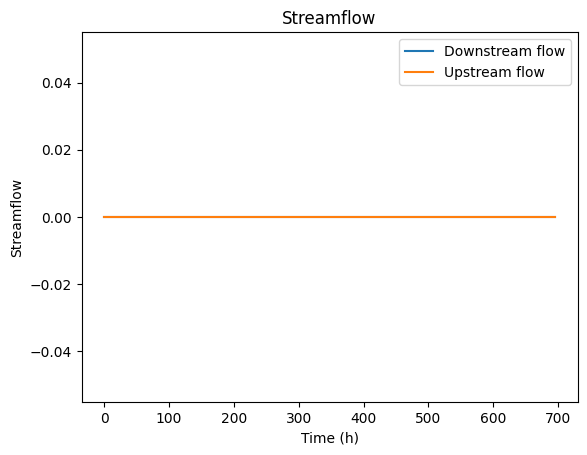

Network: 674
Streamflow (downstream) mean: 0.16
Streamflow (upstream) mean: 0.02


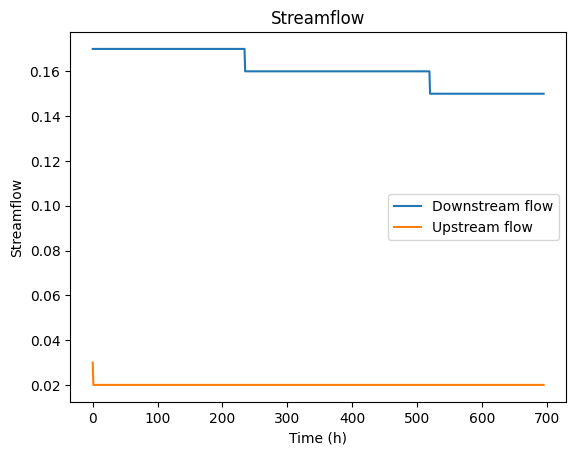

Network: 675
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


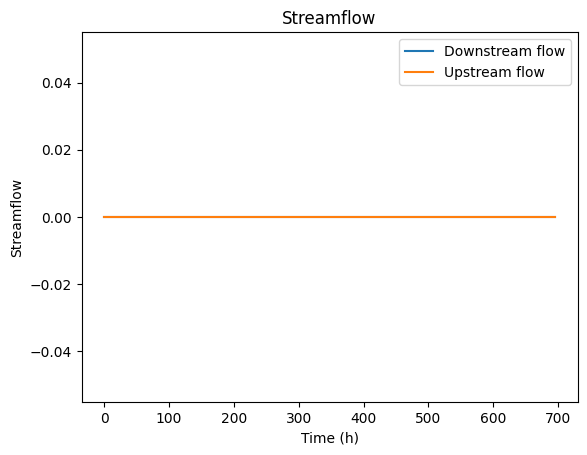

Network: 676
Streamflow (downstream) mean: 0.14
Streamflow (upstream) mean: 0.78


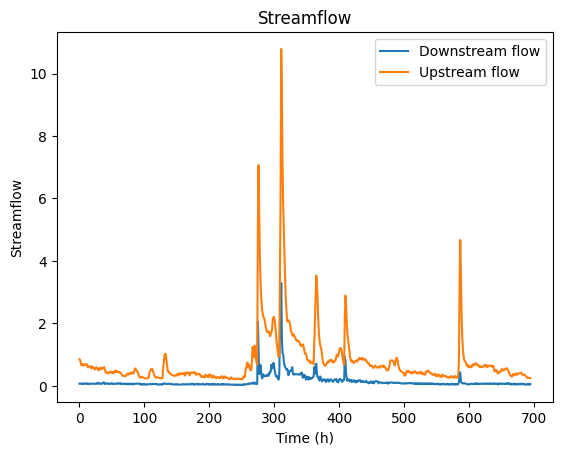

Network: 677
Streamflow (downstream) mean: 0.07
Streamflow (upstream) mean: 0.0


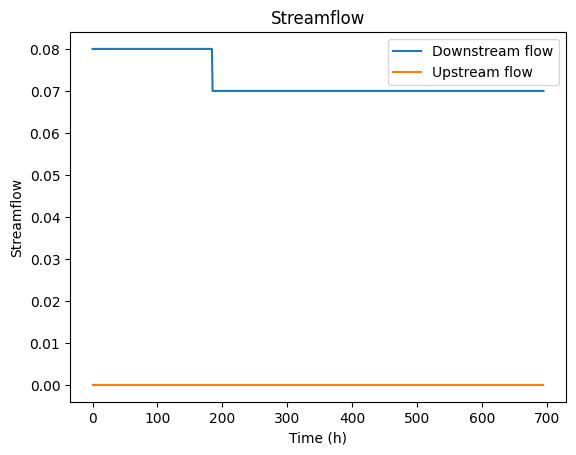

Network: 678
Streamflow (downstream) mean: 0.09
Streamflow (upstream) mean: 8.85


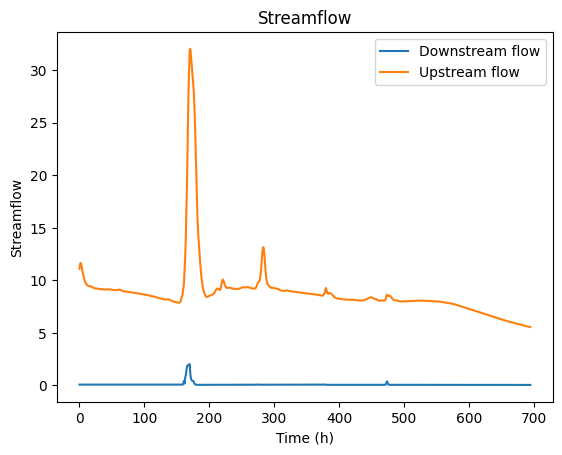

Network: 679
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.27


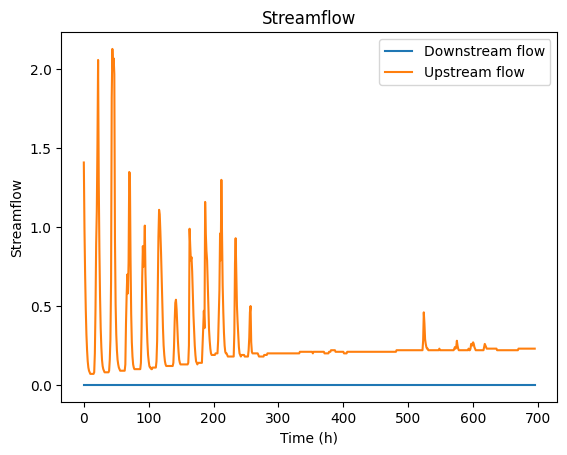

Network: 680
Streamflow (downstream) mean: 0.6
Streamflow (upstream) mean: 0.06


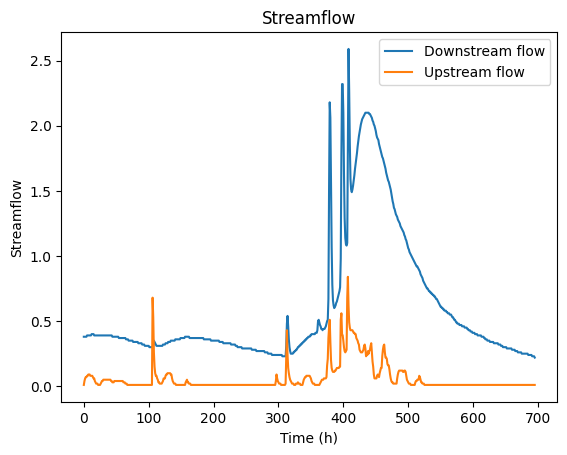

Network: 681
Streamflow (downstream) mean: 0.24
Streamflow (upstream) mean: 6.9


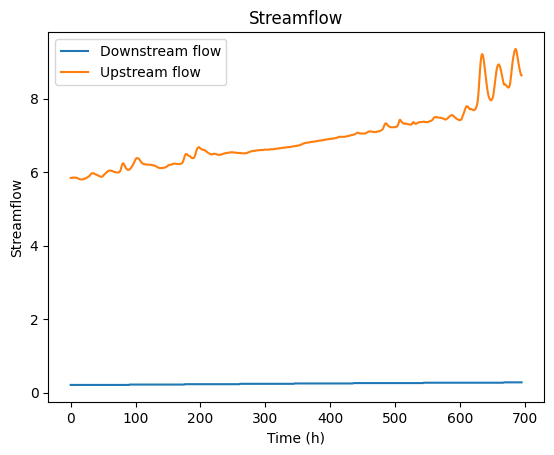

Network: 682
Streamflow (downstream) mean: 0.09
Streamflow (upstream) mean: 0.03


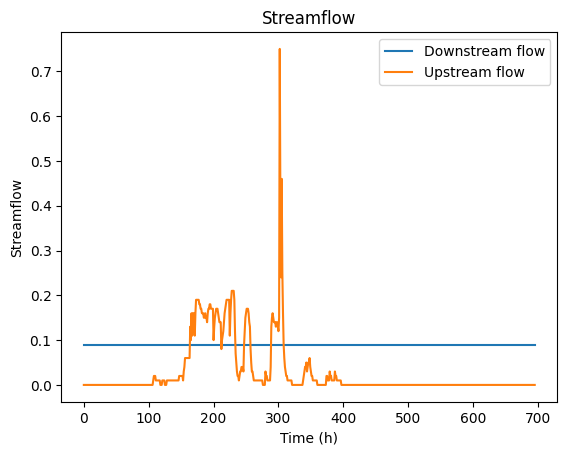

Network: 683
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


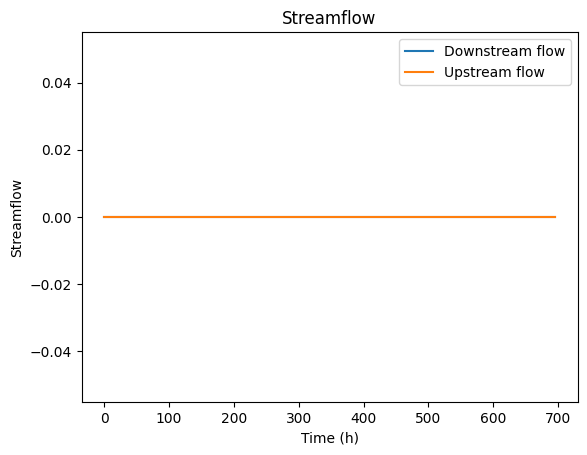

Network: 684
Streamflow (downstream) mean: 0.08
Streamflow (upstream) mean: 0.02


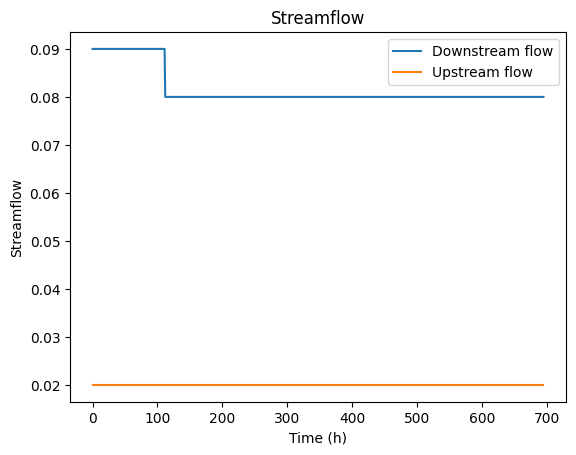

Network: 685
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.08


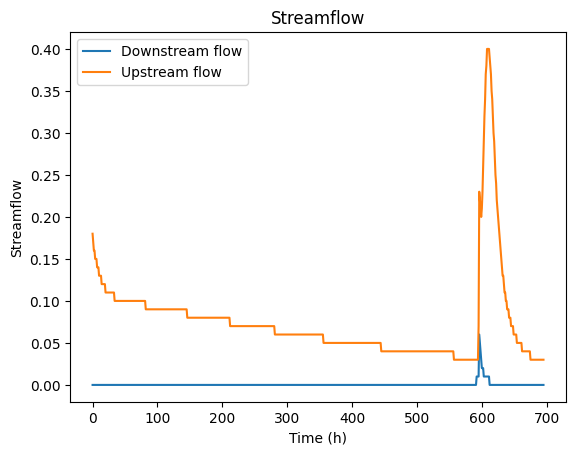

Network: 686
Streamflow (downstream) mean: 0.1
Streamflow (upstream) mean: 0.02


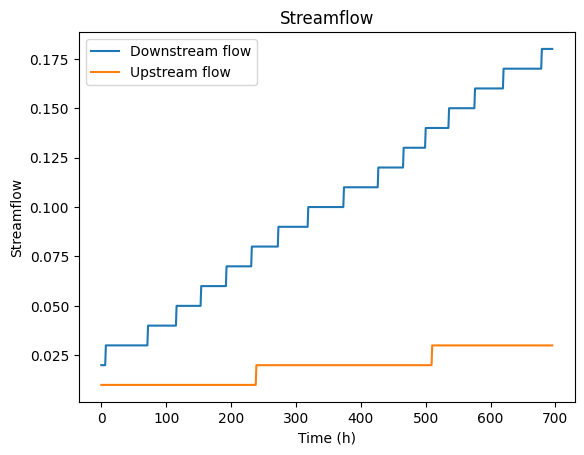

Network: 687
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.0


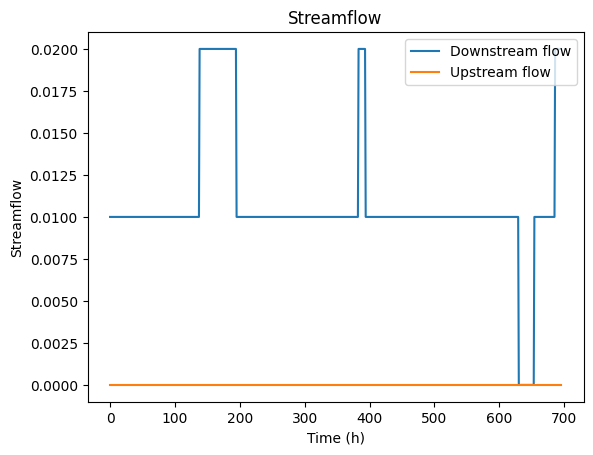

Network: 688
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.02


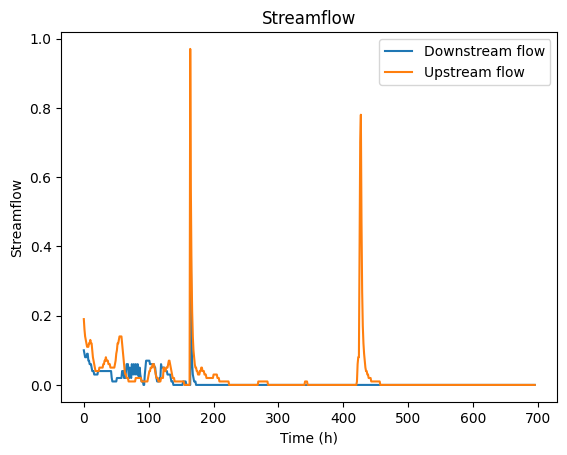

Network: 689
Streamflow (downstream) mean: 2.14
Streamflow (upstream) mean: 0.7


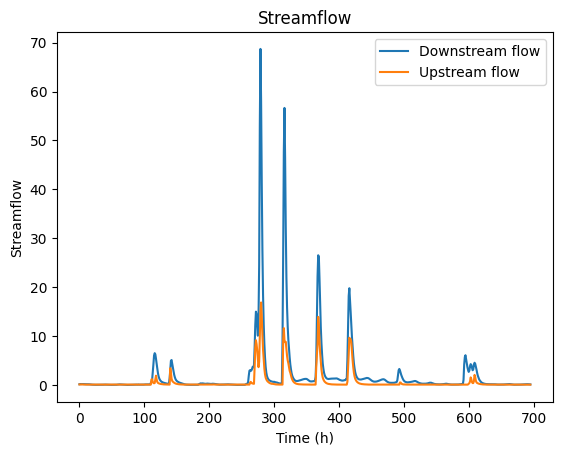

Network: 690
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.08


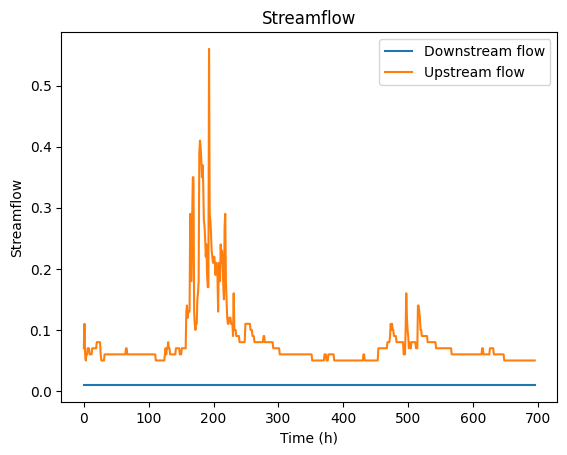

Network: 691
Streamflow (downstream) mean: 0.13
Streamflow (upstream) mean: 0.01


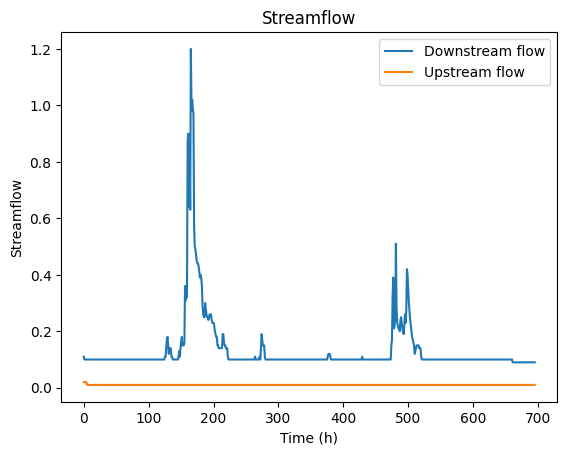

Network: 692
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.01


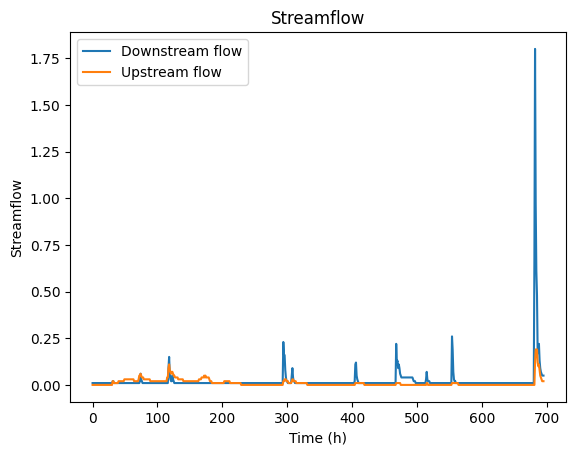

Network: 693
Streamflow (downstream) mean: 0.07
Streamflow (upstream) mean: 0.08


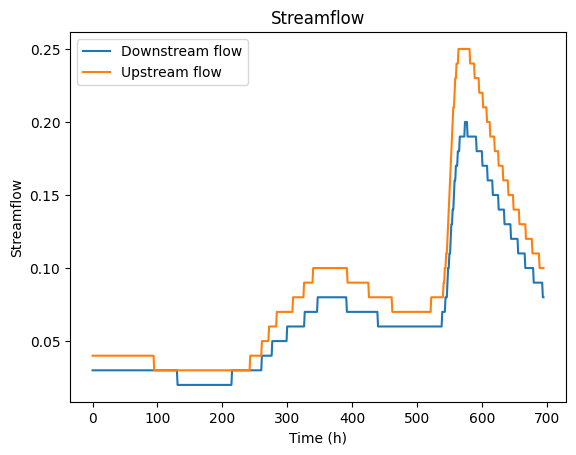

Network: 694
Streamflow (downstream) mean: 0.73
Streamflow (upstream) mean: 0.28


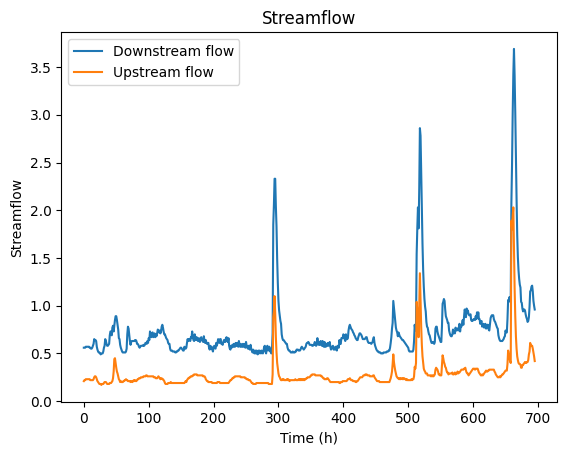

Network: 695
Streamflow (downstream) mean: 0.06
Streamflow (upstream) mean: 0.0


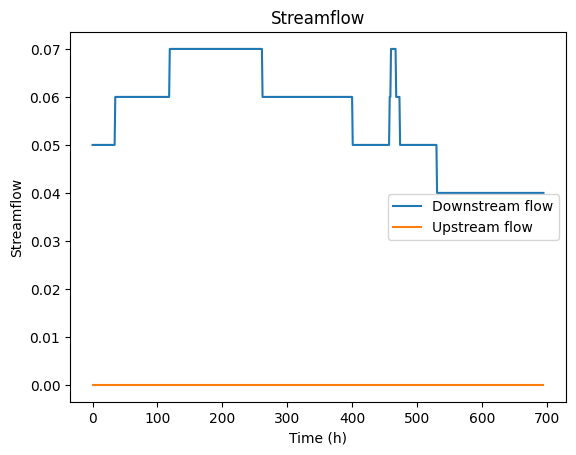

Network: 696
Streamflow (downstream) mean: 0.43
Streamflow (upstream) mean: 0.0


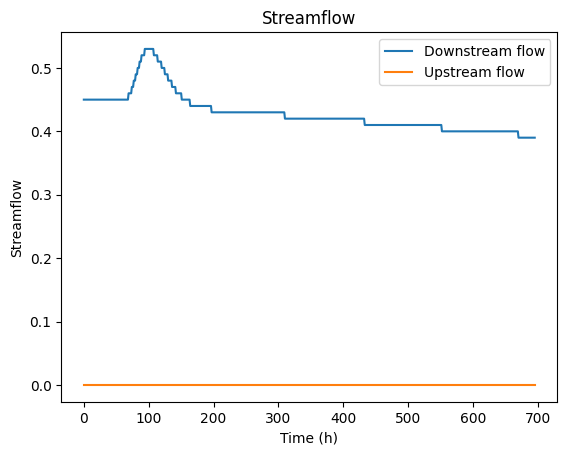

Network: 697
Streamflow (downstream) mean: 0.05
Streamflow (upstream) mean: 0.04


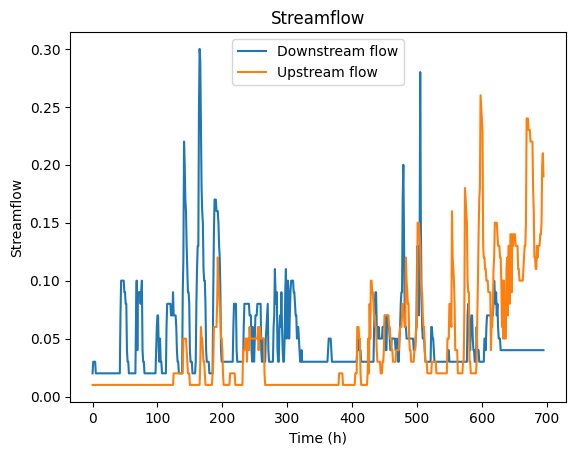

Network: 698
Streamflow (downstream) mean: 0.79
Streamflow (upstream) mean: 0.01


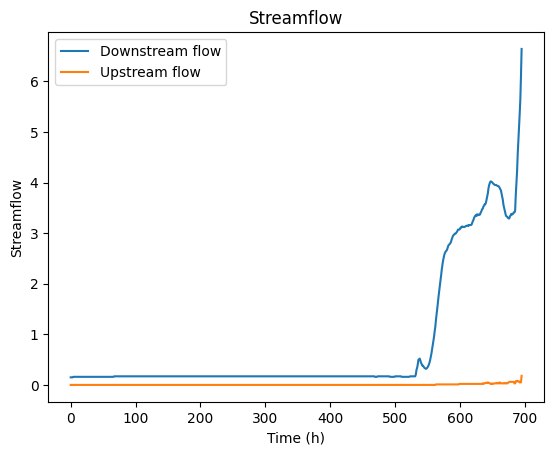

Network: 699
Streamflow (downstream) mean: 1.01
Streamflow (upstream) mean: 0.16


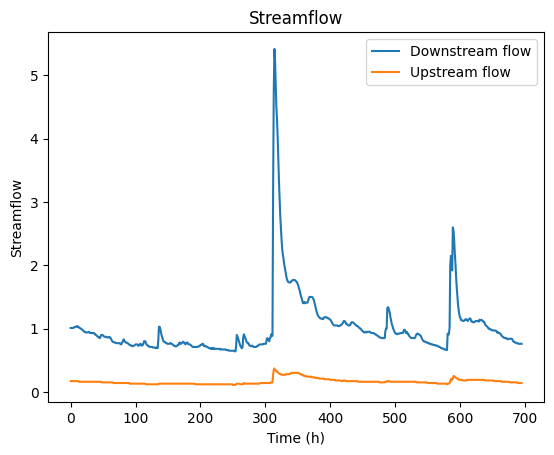

Network: 700
Streamflow (downstream) mean: 0.04
Streamflow (upstream) mean: 0.0


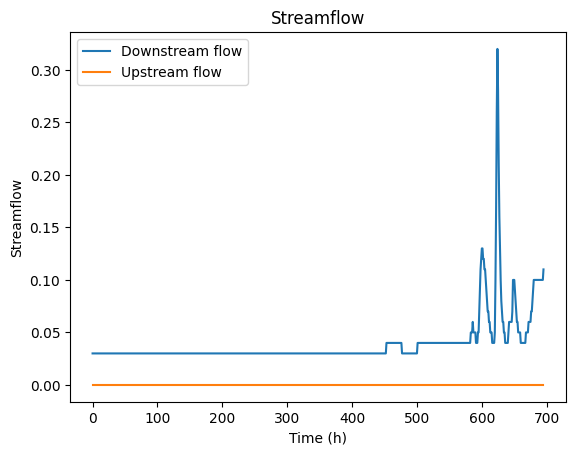

Network: 701
Streamflow (downstream) mean: 0.05
Streamflow (upstream) mean: 0.09


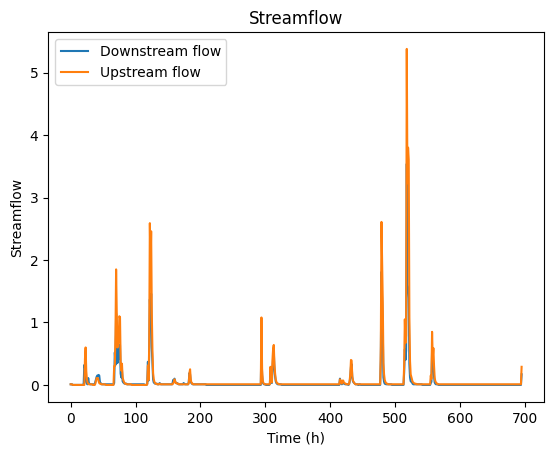

Network: 702
Streamflow (downstream) mean: 0.06
Streamflow (upstream) mean: 0.01


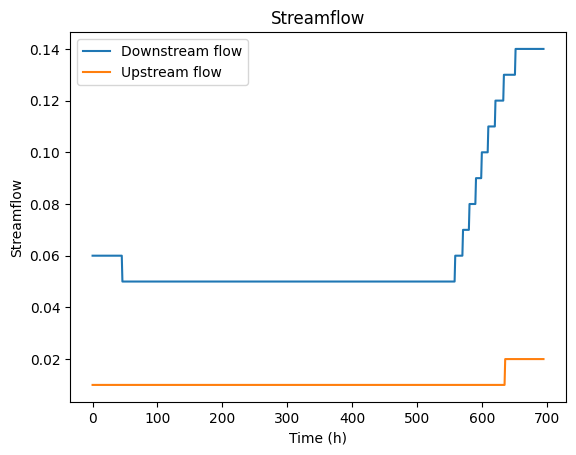

Network: 703
Streamflow (downstream) mean: 44.76
Streamflow (upstream) mean: 0.0


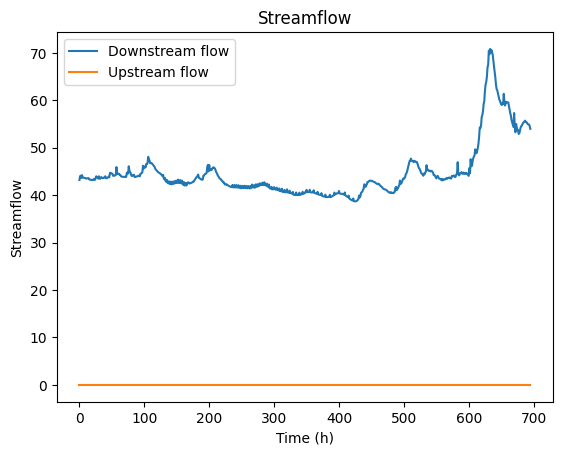

Network: 704
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


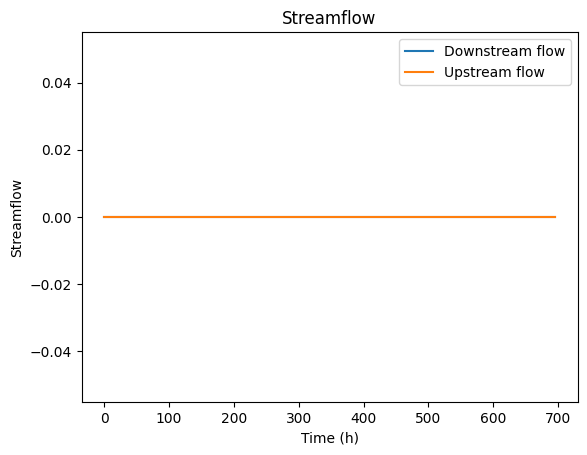

Network: 705
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.04


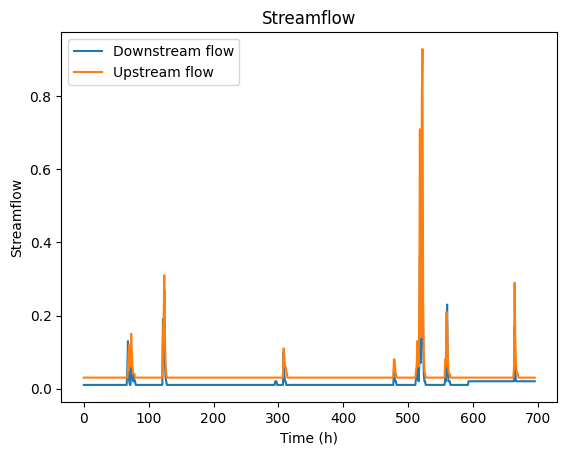

Network: 706
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.05


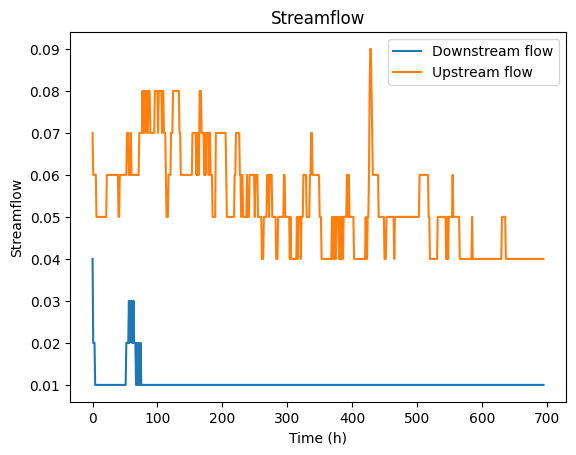

Network: 707
Streamflow (downstream) mean: 2.3
Streamflow (upstream) mean: 0.0


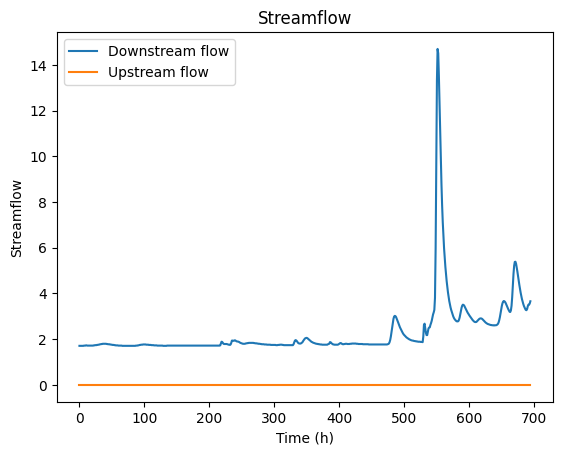

Network: 708
Streamflow (downstream) mean: 0.07
Streamflow (upstream) mean: 0.0


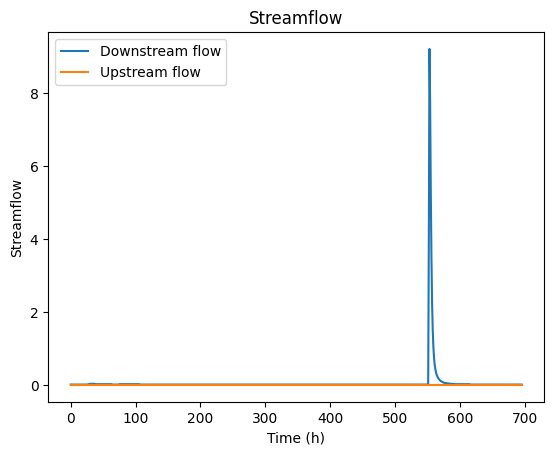

Network: 709
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.07


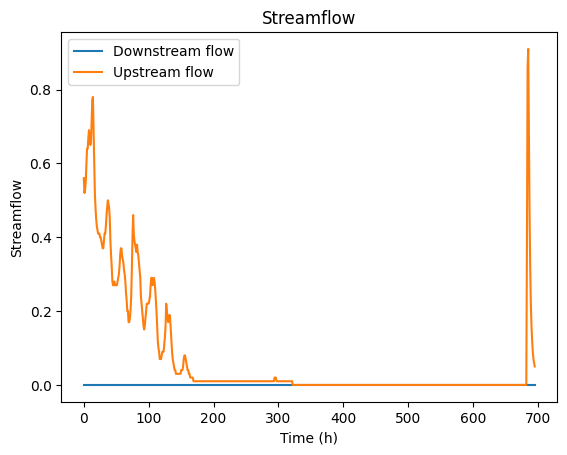

Network: 710
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


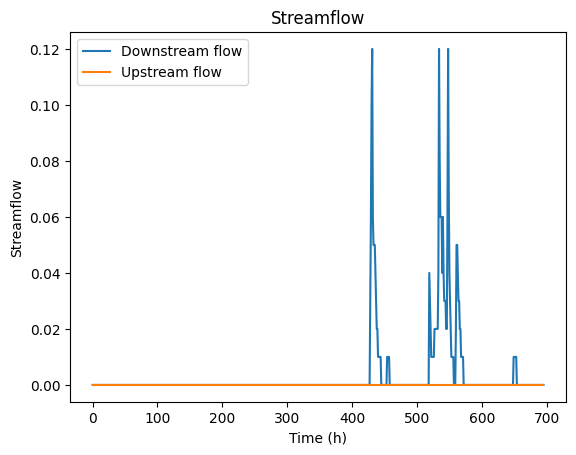

Network: 711
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.01


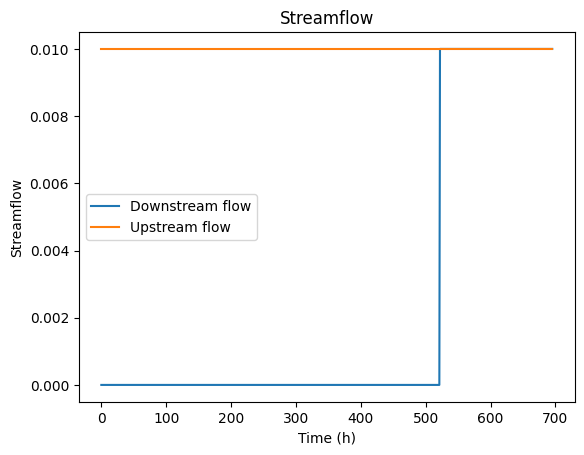

Network: 712
Streamflow (downstream) mean: 0.24
Streamflow (upstream) mean: 0.1


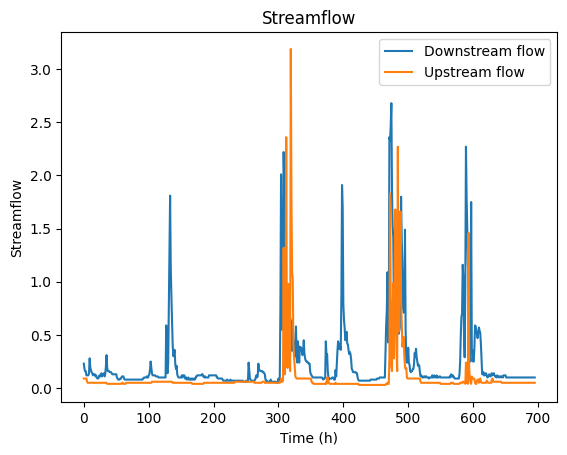

Network: 713
Streamflow (downstream) mean: 0.1
Streamflow (upstream) mean: 0.07


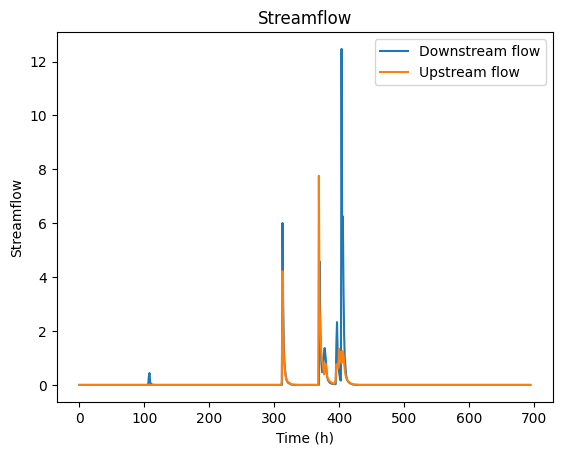

Network: 714
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


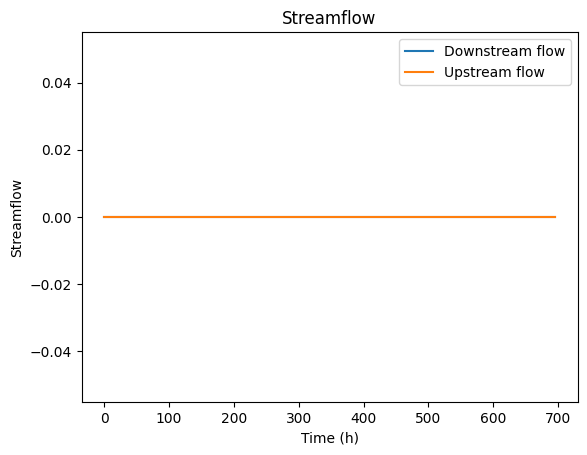

Network: 715
Streamflow (downstream) mean: 6.8
Streamflow (upstream) mean: 0.19


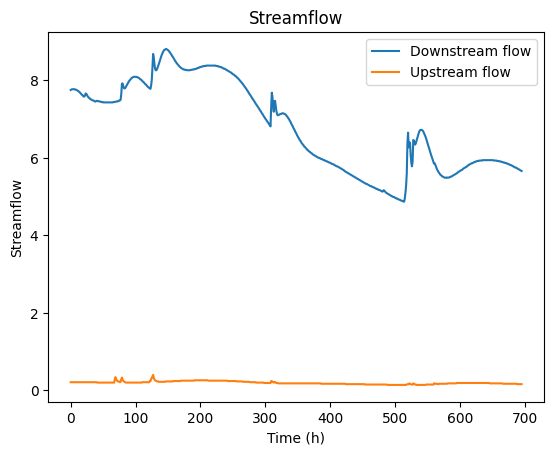

Network: 716
Streamflow (downstream) mean: 0.03
Streamflow (upstream) mean: 0.03


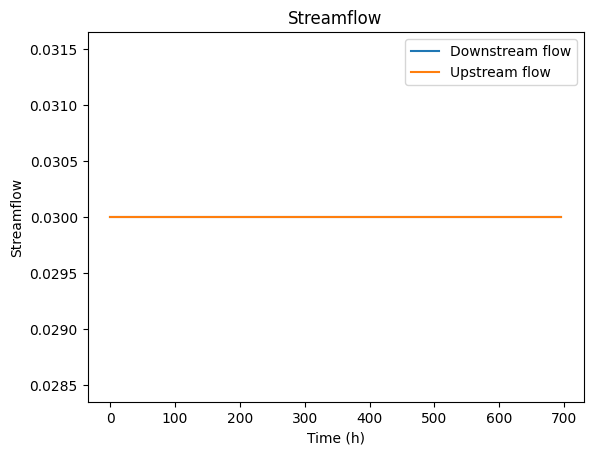

Network: 717
Streamflow (downstream) mean: 0.27
Streamflow (upstream) mean: 0.04


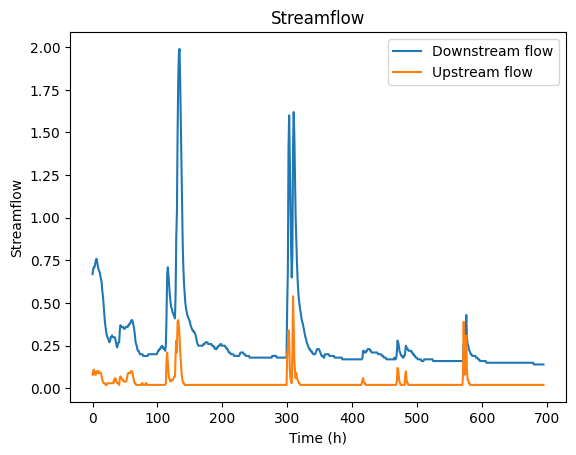

Network: 718
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


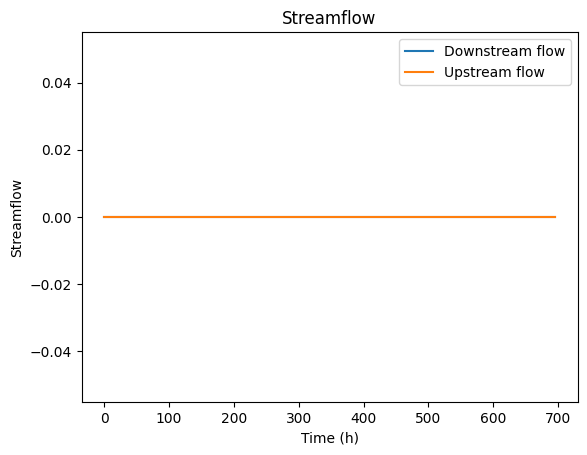

Network: 719
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.0


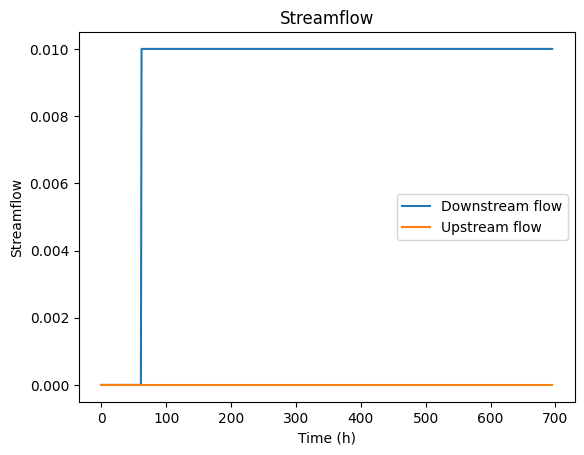

Network: 720
Streamflow (downstream) mean: 0.6
Streamflow (upstream) mean: 0.06


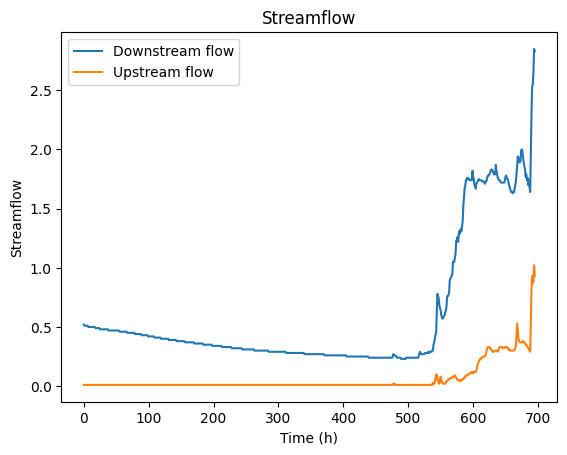

Network: 721
Streamflow (downstream) mean: 0.03
Streamflow (upstream) mean: 0.2


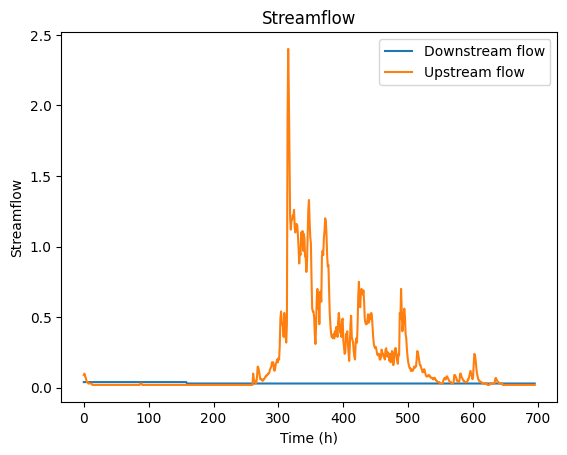

Network: 722
Streamflow (downstream) mean: 0.81
Streamflow (upstream) mean: 0.35


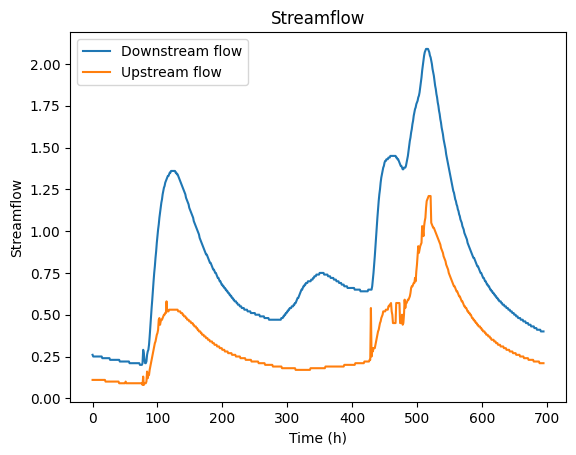

Network: 723
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


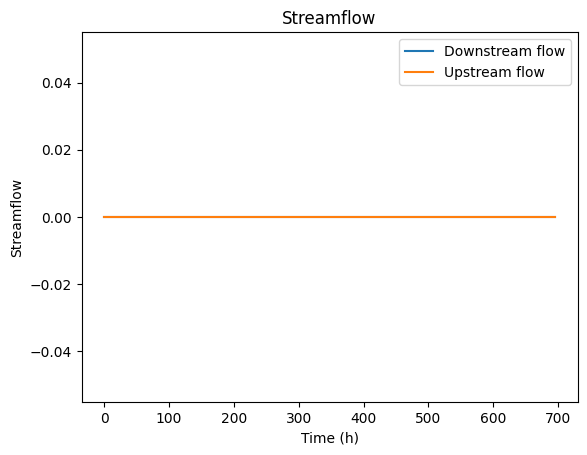

Network: 724
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


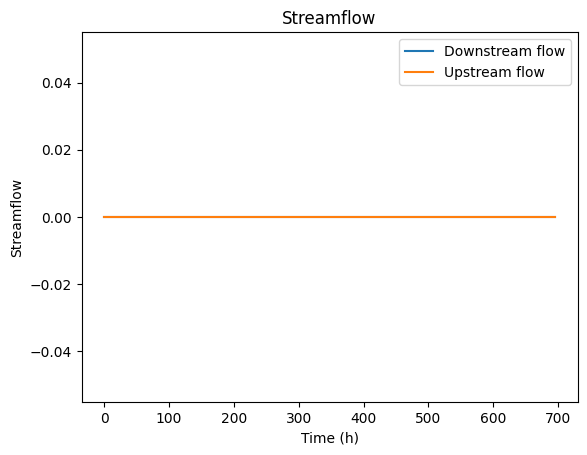

Network: 725
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


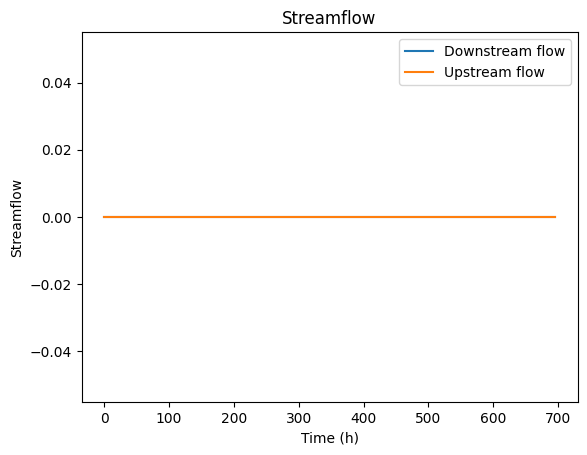

Network: 726
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


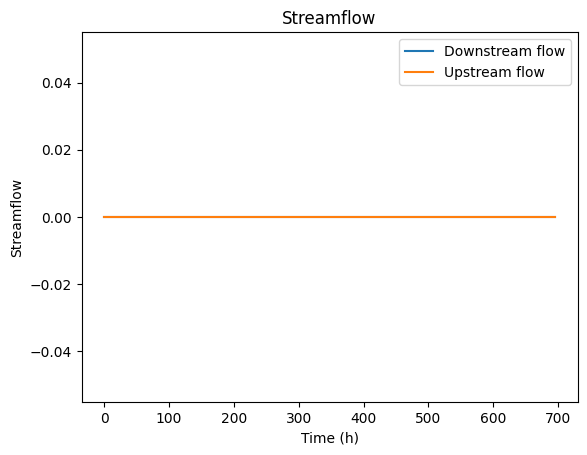

Network: 727
Streamflow (downstream) mean: 0.65
Streamflow (upstream) mean: 0.25


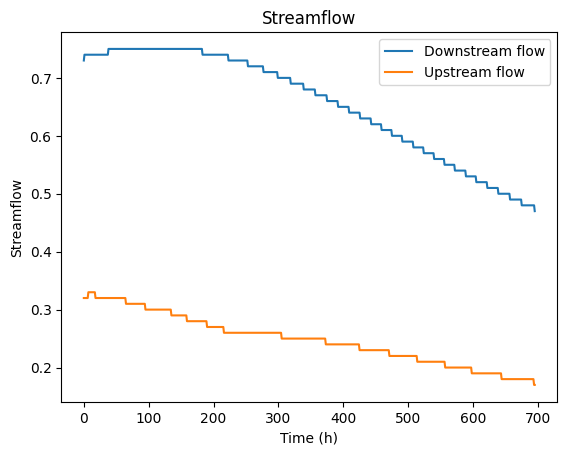

Network: 728
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.03


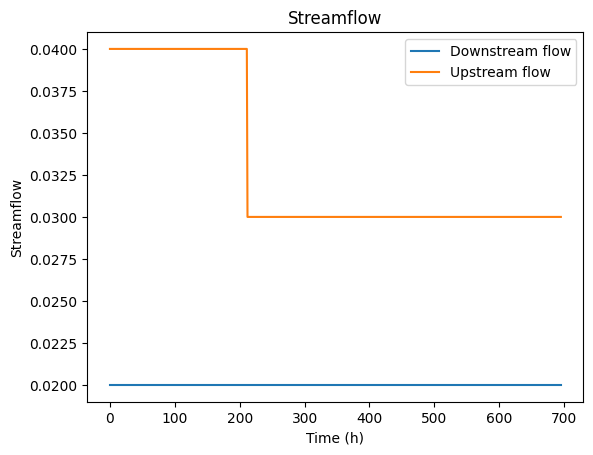

Network: 729
Streamflow (downstream) mean: 0.68
Streamflow (upstream) mean: 0.0


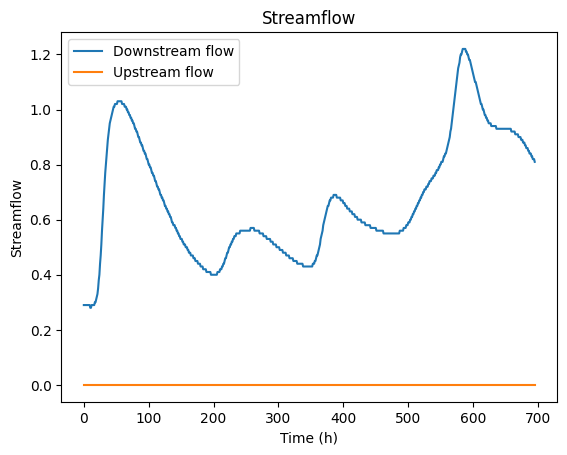

Network: 730
Streamflow (downstream) mean: 0.05
Streamflow (upstream) mean: 0.0


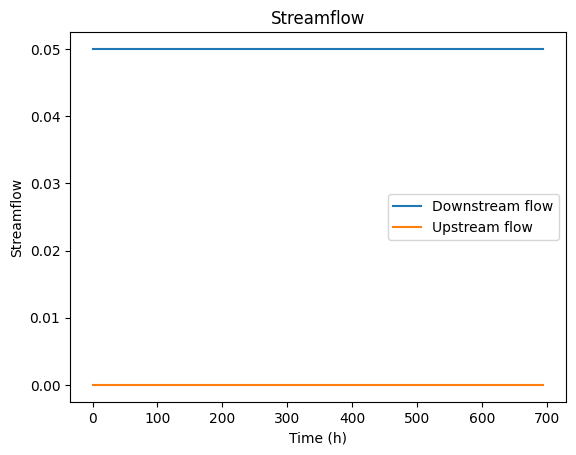

Network: 731
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.49


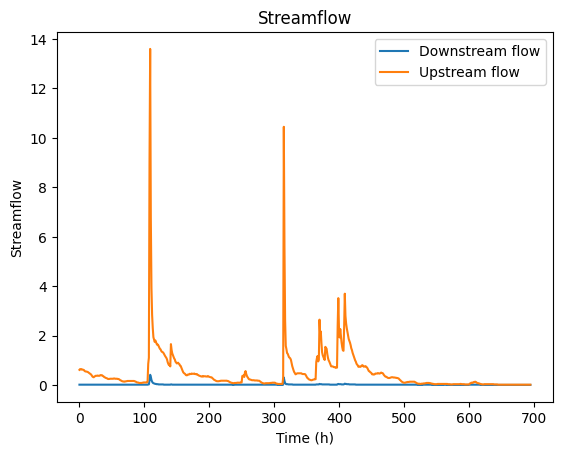

Network: 732
Streamflow (downstream) mean: 0.2
Streamflow (upstream) mean: 0.0


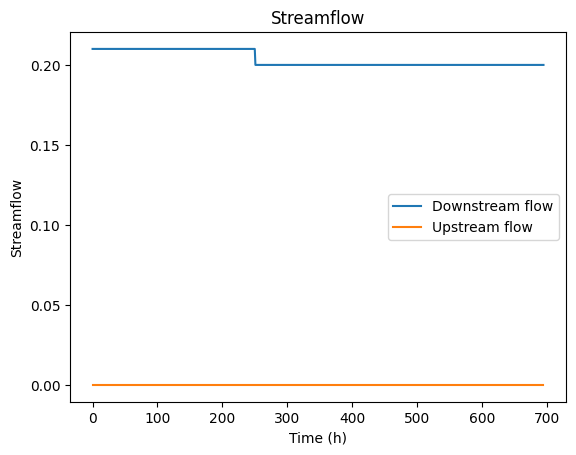

Network: 733
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


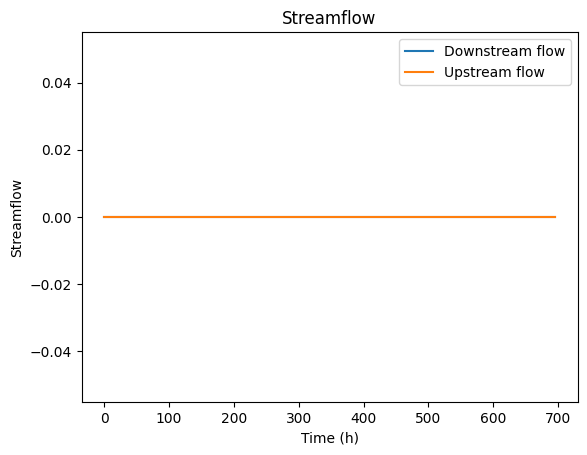

Network: 734
Streamflow (downstream) mean: 13.98
Streamflow (upstream) mean: 8.37


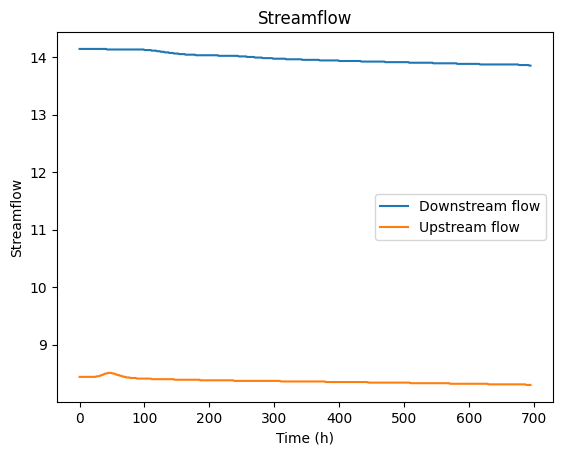

Network: 735
Streamflow (downstream) mean: 9.79
Streamflow (upstream) mean: 1.31


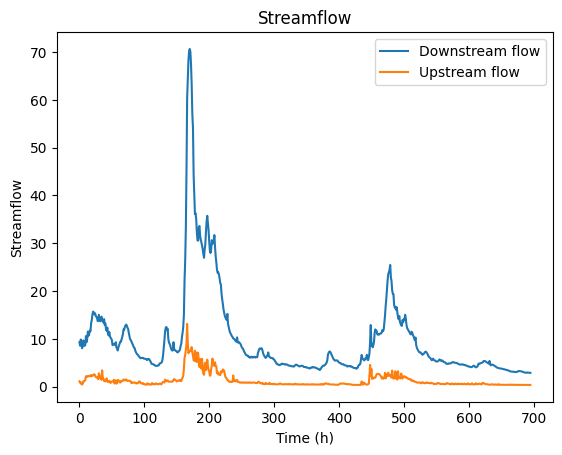

Network: 736
Streamflow (downstream) mean: 0.47
Streamflow (upstream) mean: 0.27


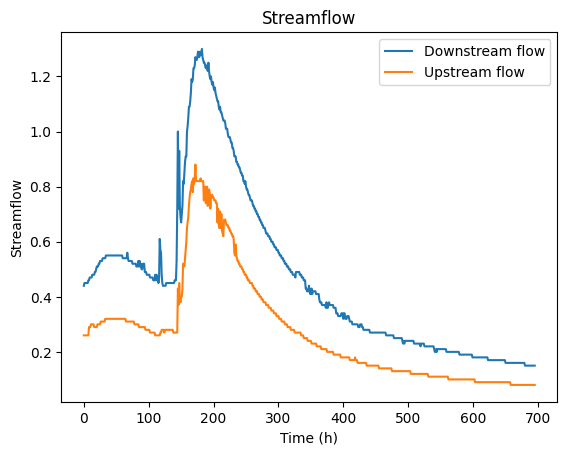

Network: 737
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


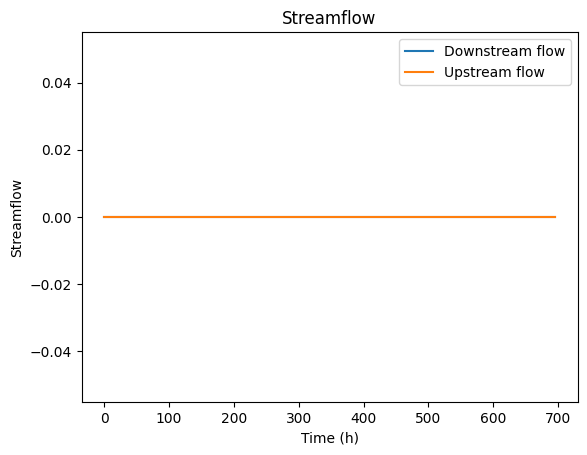

Network: 738
Streamflow (downstream) mean: 33.21
Streamflow (upstream) mean: 0.7


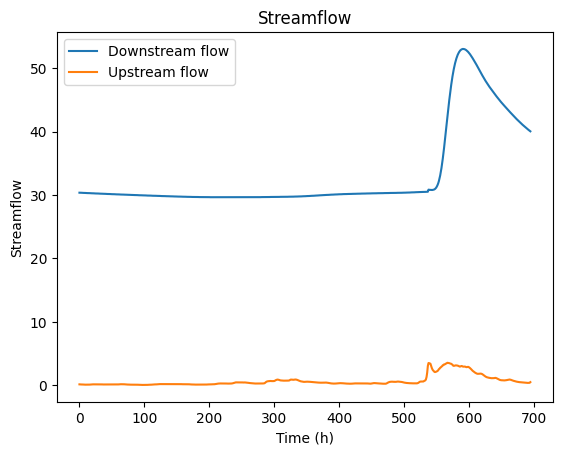

Network: 739
Streamflow (downstream) mean: 964.92
Streamflow (upstream) mean: 0.03


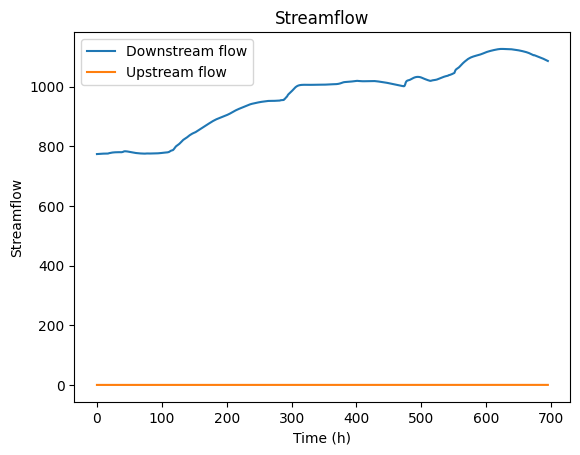

Network: 740
Streamflow (downstream) mean: 0.14
Streamflow (upstream) mean: 0.12


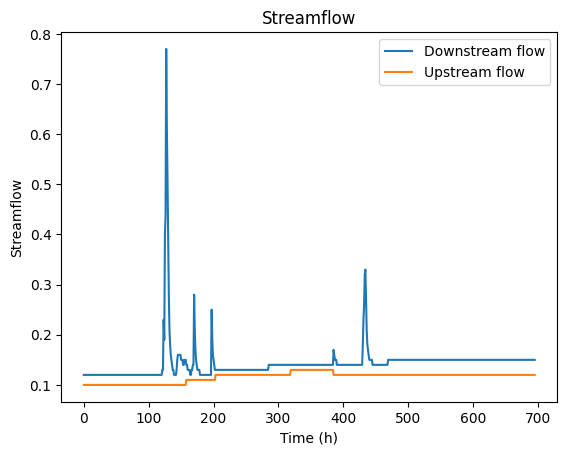

Network: 741
Streamflow (downstream) mean: 402.9
Streamflow (upstream) mean: 0.15


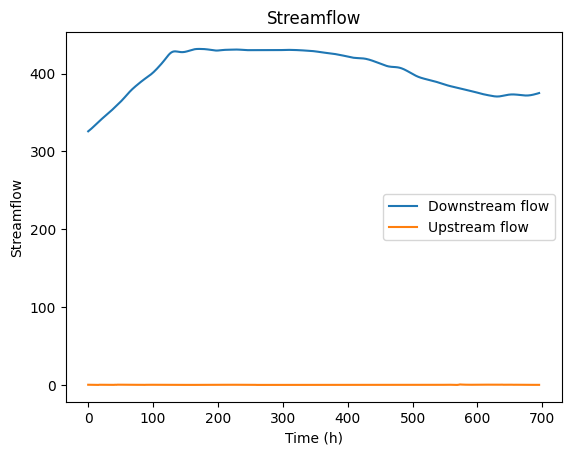

Network: 742
Streamflow (downstream) mean: 0.92
Streamflow (upstream) mean: 0.19


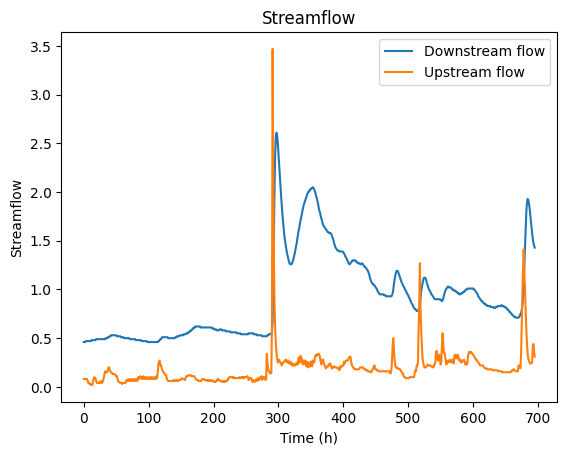

Network: 743
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.06


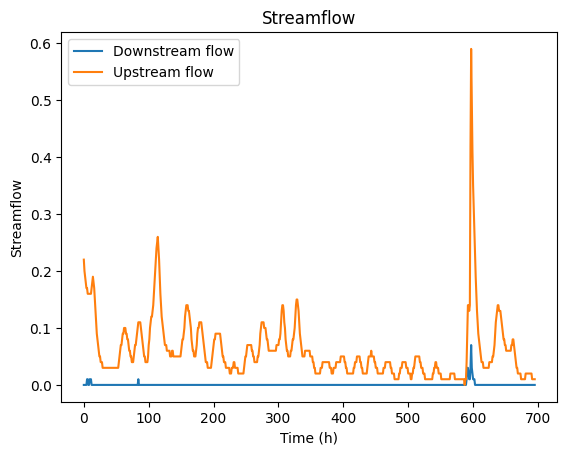

Network: 744
Streamflow (downstream) mean: 3.7
Streamflow (upstream) mean: 0.51


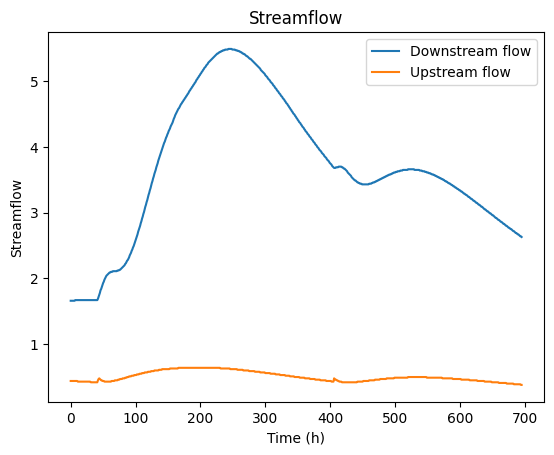

Network: 745
Streamflow (downstream) mean: 2.0
Streamflow (upstream) mean: 0.0


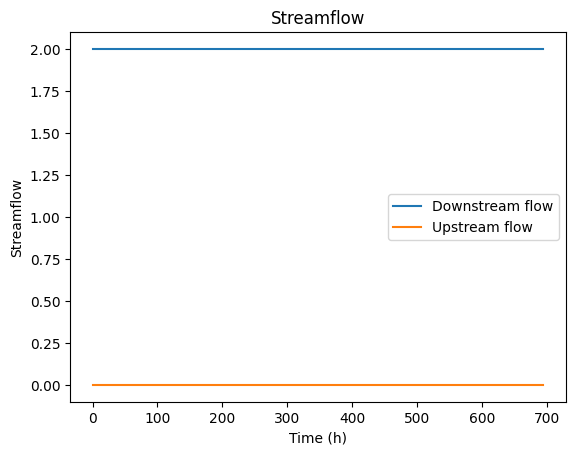

Network: 746
Streamflow (downstream) mean: 11.34
Streamflow (upstream) mean: 1.0


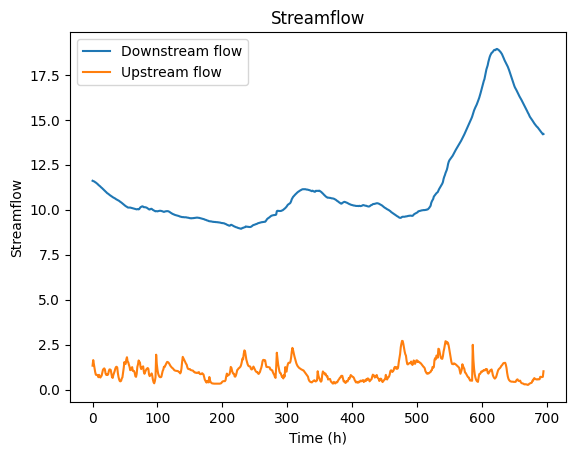

Network: 747
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


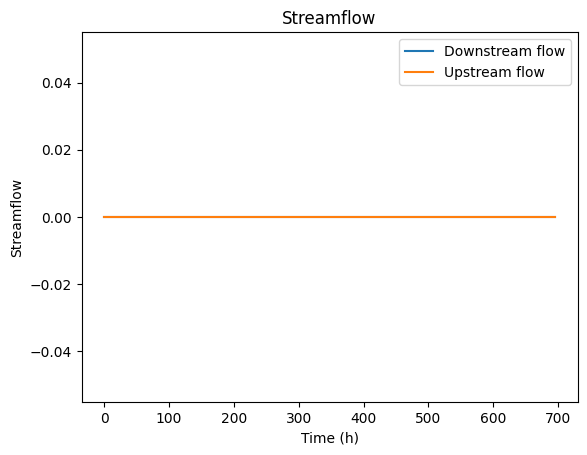

Network: 748
Streamflow (downstream) mean: 1.79
Streamflow (upstream) mean: 0.09


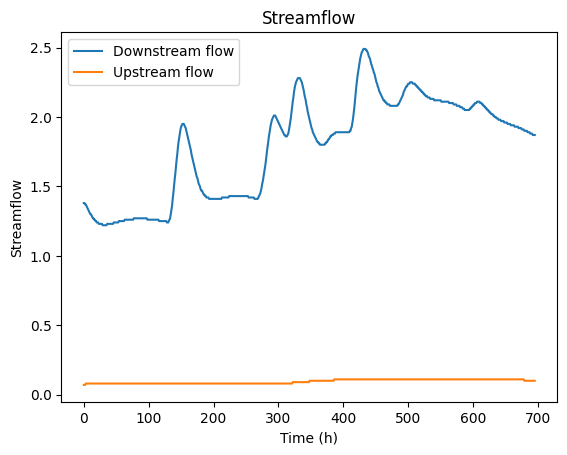

Network: 749
Streamflow (downstream) mean: 3.6
Streamflow (upstream) mean: 0.2


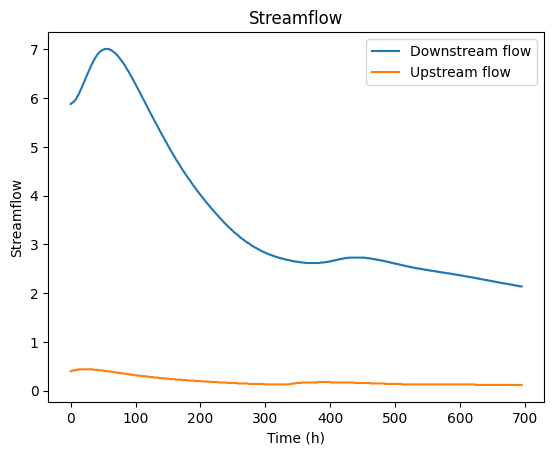

Network: 750
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.01


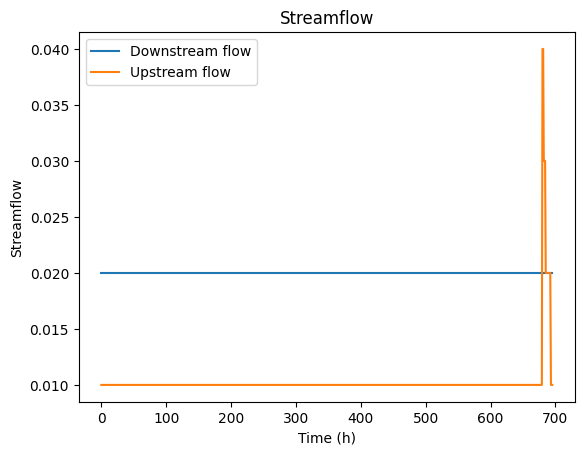

Network: 751
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


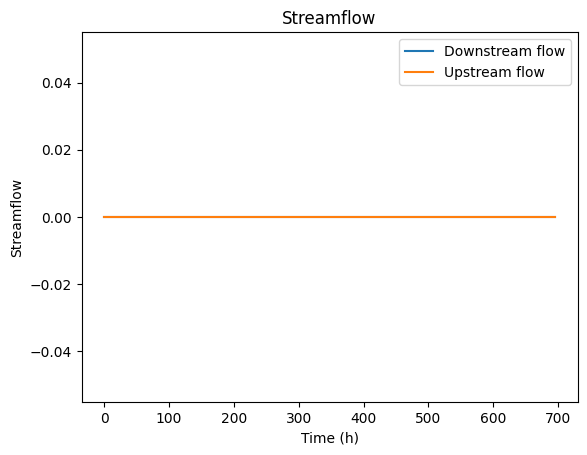

Network: 752
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


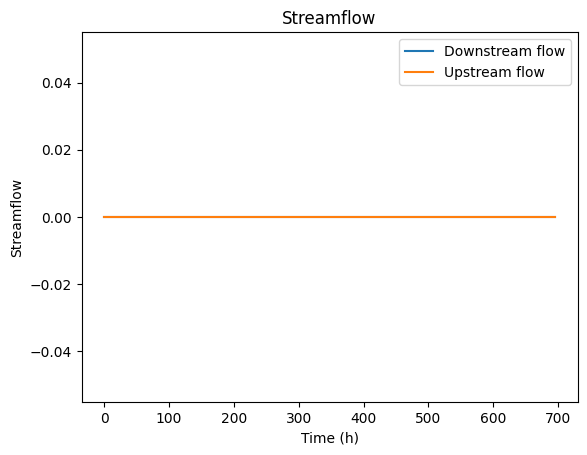

Network: 753
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


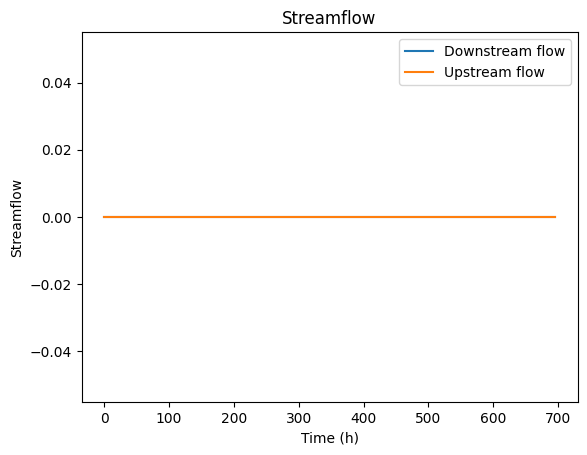

Network: 754
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


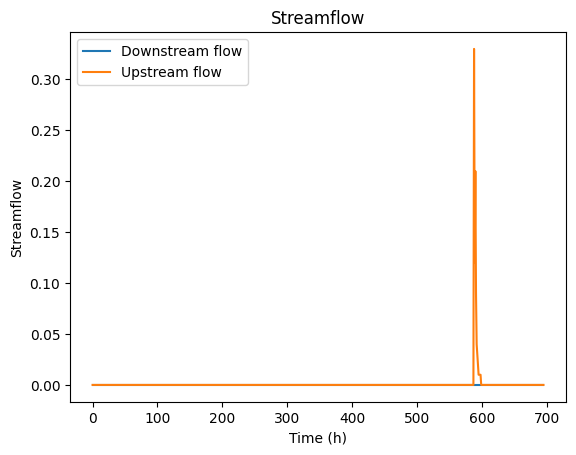

Network: 755
Streamflow (downstream) mean: 0.51
Streamflow (upstream) mean: 0.01


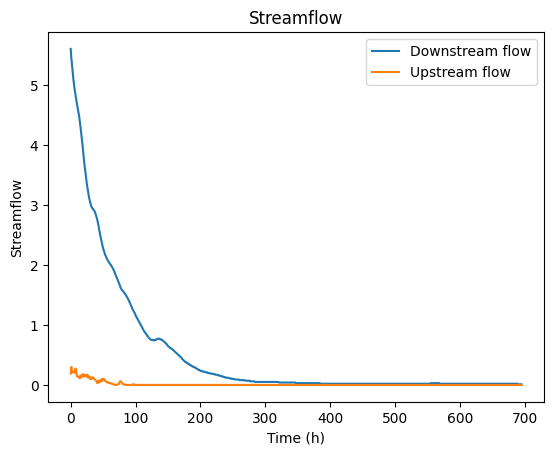

Network: 756
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.03


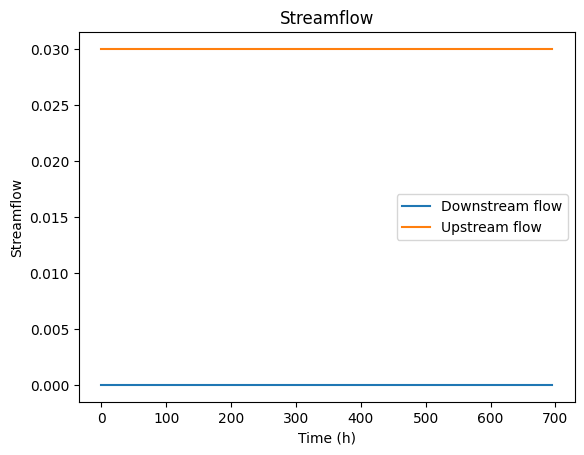

Network: 757
Streamflow (downstream) mean: 0.11
Streamflow (upstream) mean: 22.22


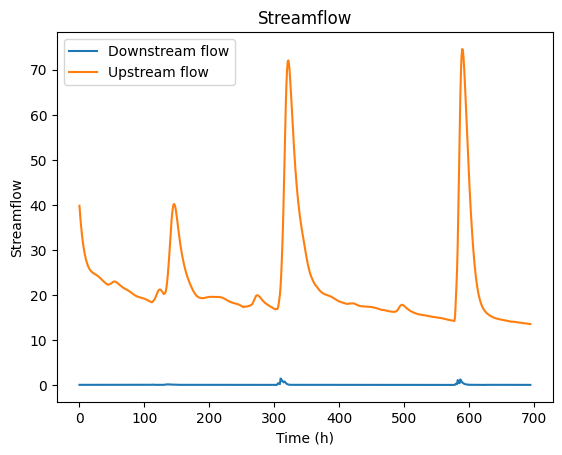

Network: 758
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


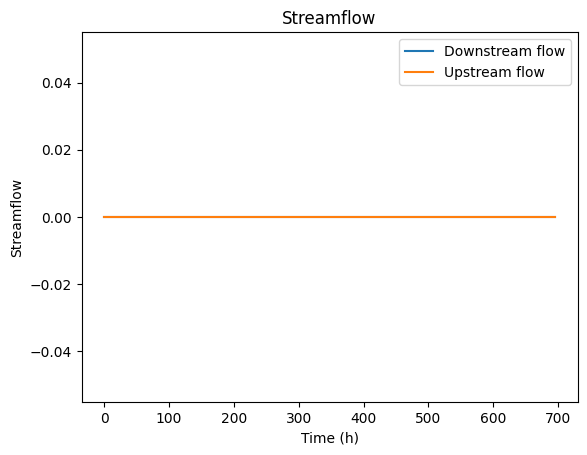

Network: 759
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


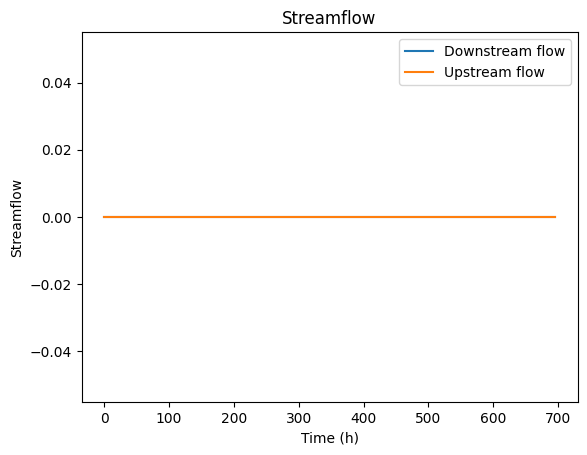

Network: 760
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.0


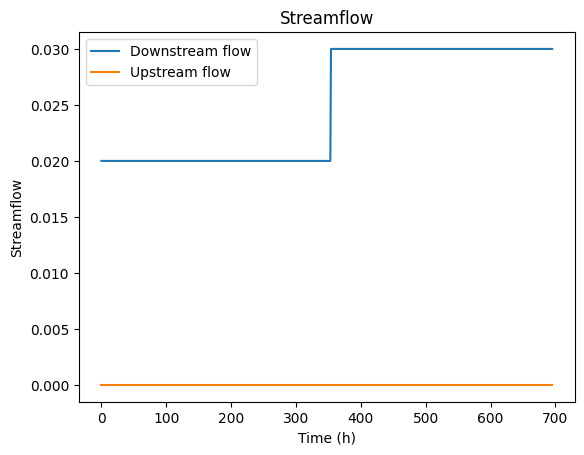

Network: 761
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.02


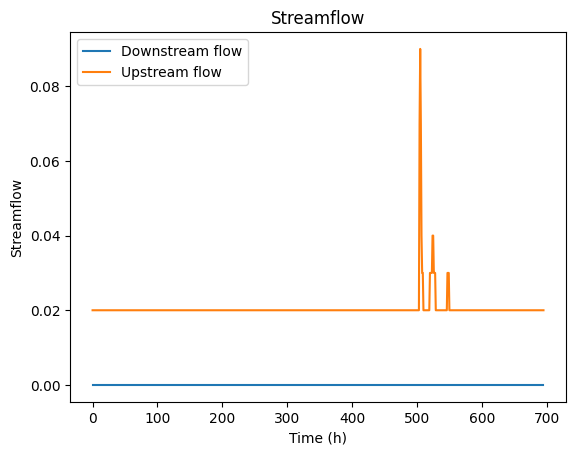

Network: 762
Streamflow (downstream) mean: 0.04
Streamflow (upstream) mean: 0.0


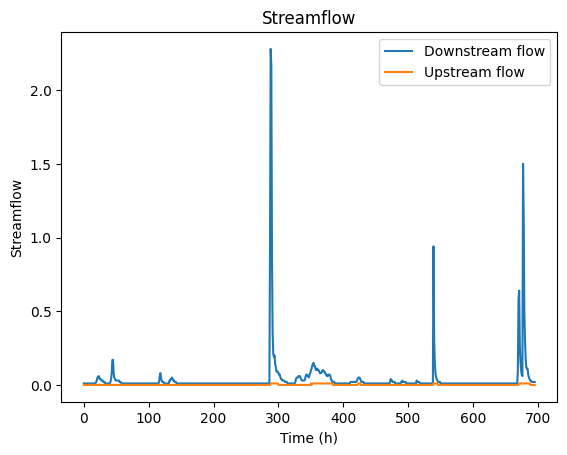

Network: 763
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


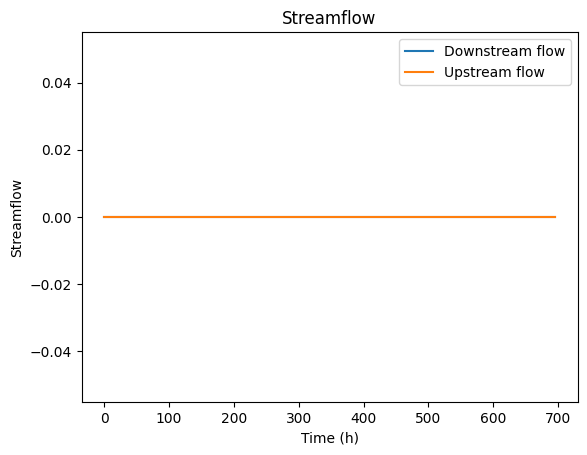

Network: 764
Streamflow (downstream) mean: 22.42
Streamflow (upstream) mean: 0.19


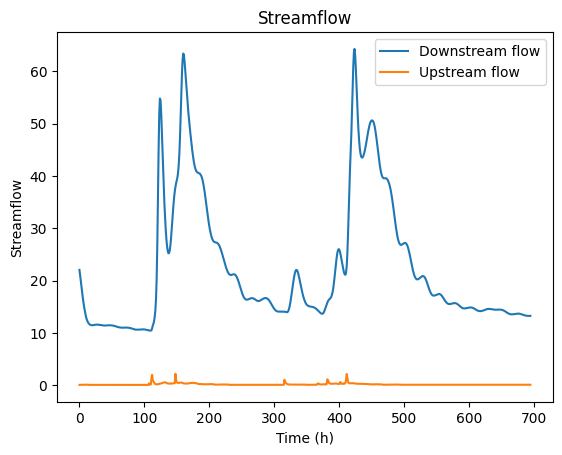

Network: 765
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.03


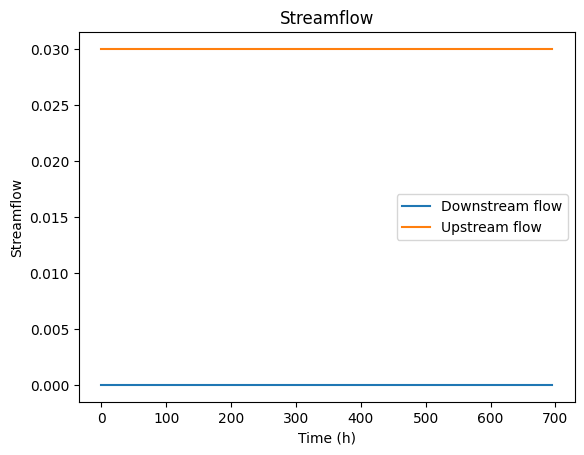

Network: 766
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


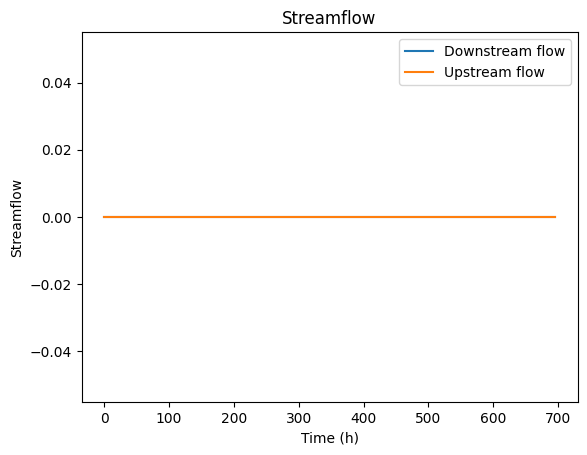

Network: 767
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.02


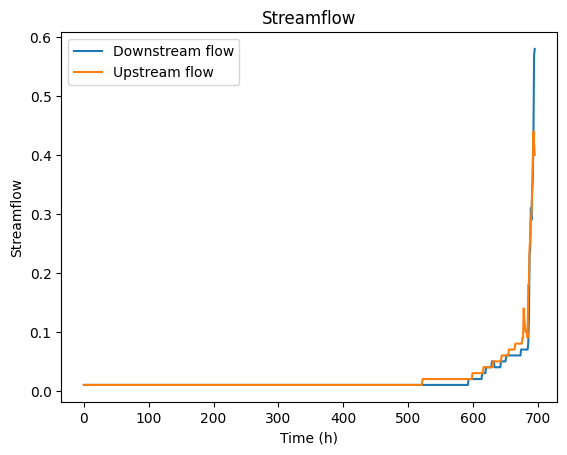

Network: 768
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


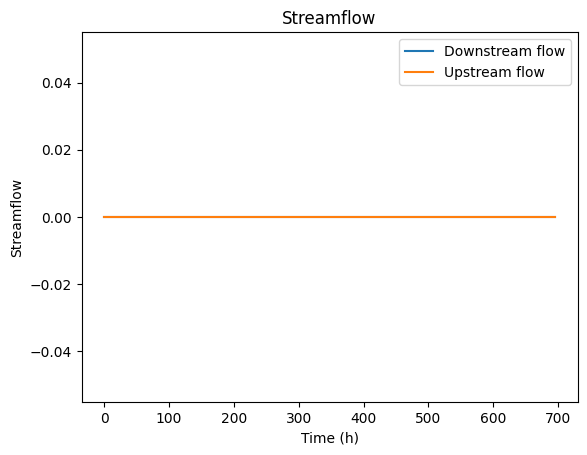

Network: 769
Streamflow (downstream) mean: 0.12
Streamflow (upstream) mean: 0.02


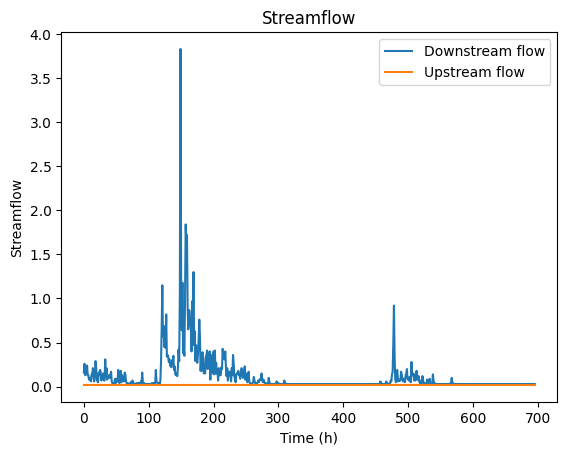

Network: 770
Streamflow (downstream) mean: 0.29
Streamflow (upstream) mean: 0.0


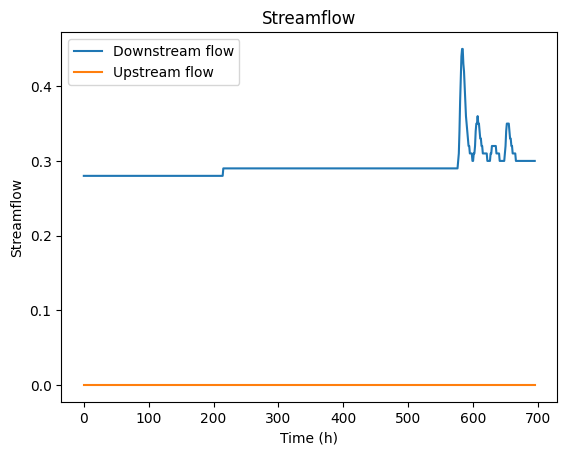

Network: 771
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


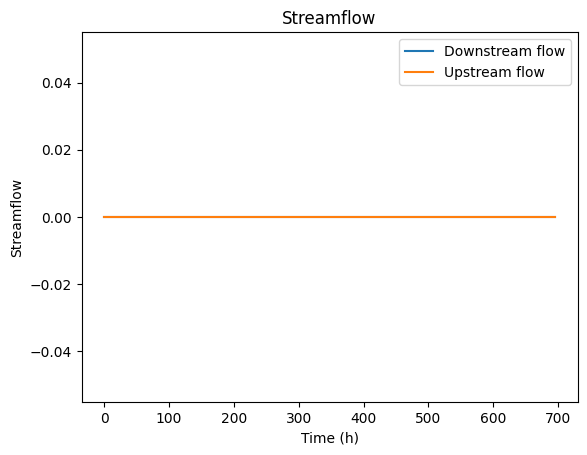

Network: 772
Streamflow (downstream) mean: 0.36
Streamflow (upstream) mean: 0.03


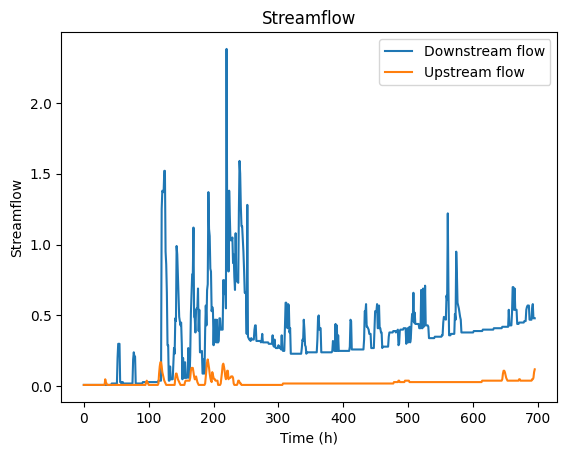

Network: 773
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.03


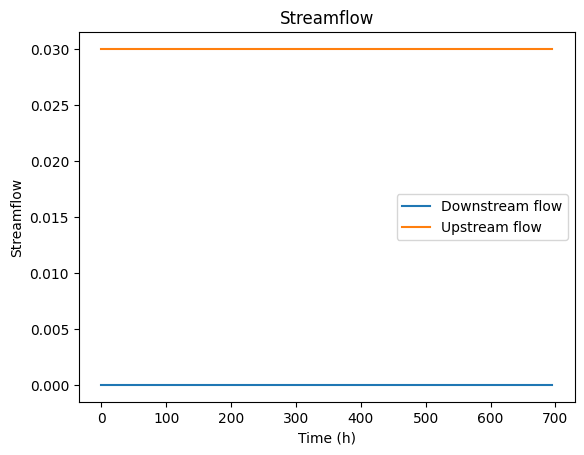

Network: 774
Streamflow (downstream) mean: 1.14
Streamflow (upstream) mean: 0.69


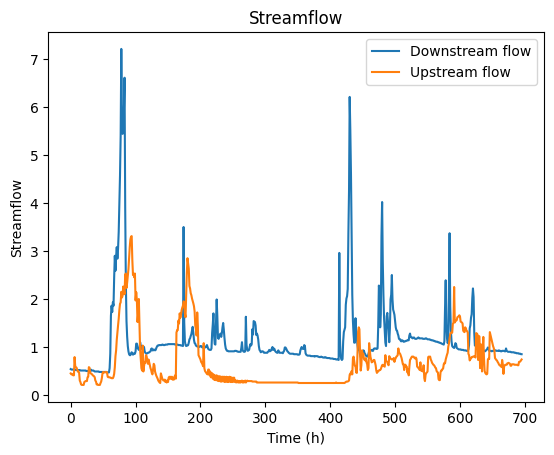

Network: 775
Streamflow (downstream) mean: 1.82
Streamflow (upstream) mean: 0.22


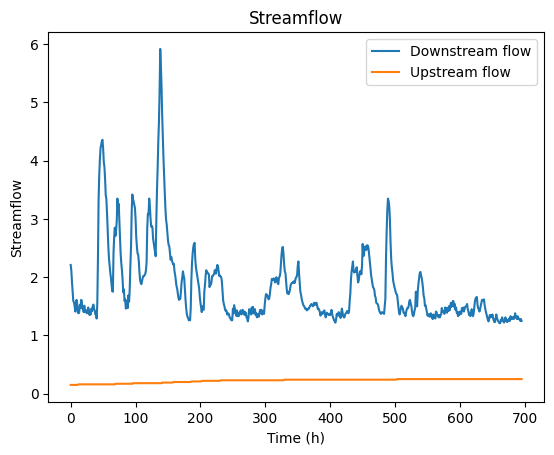

Network: 776
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.02


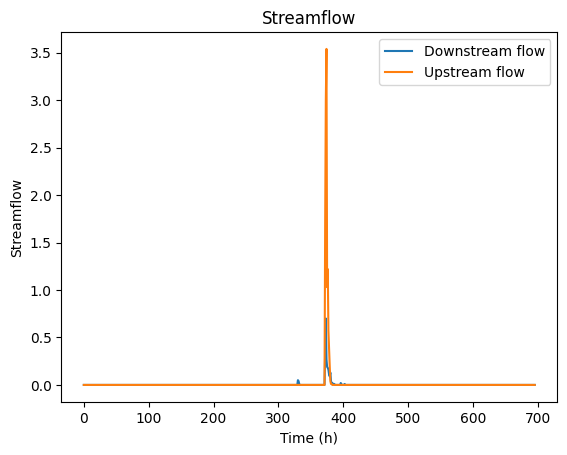

Network: 777
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


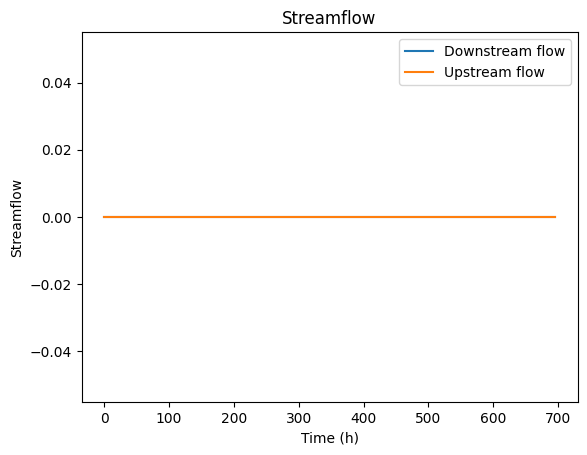

Network: 778
Streamflow (downstream) mean: 0.87
Streamflow (upstream) mean: 0.3


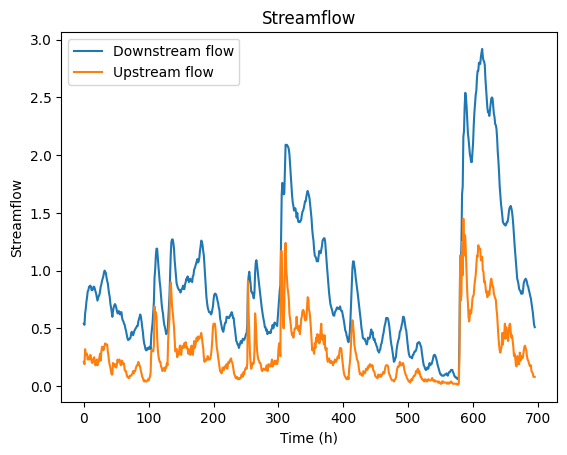

Network: 779
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.01


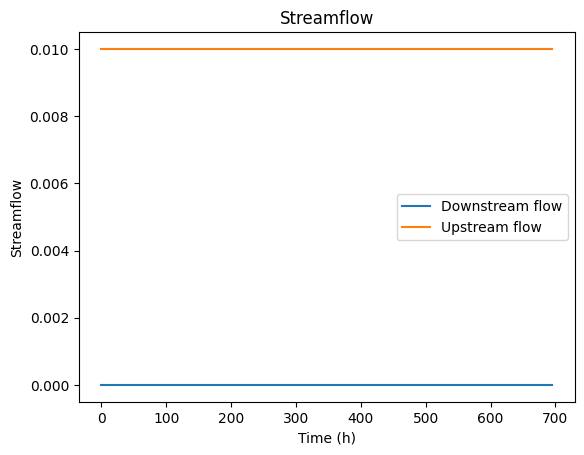

Network: 780
Streamflow (downstream) mean: 0.03
Streamflow (upstream) mean: 0.03


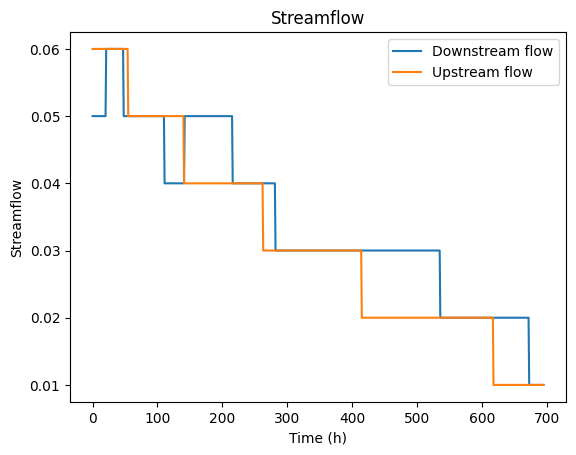

Network: 781
Streamflow (downstream) mean: 0.67
Streamflow (upstream) mean: 0.22


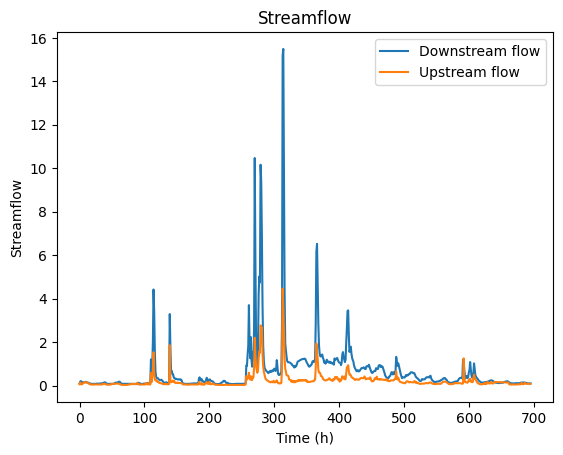

Network: 782
Streamflow (downstream) mean: 7.0
Streamflow (upstream) mean: 0.05


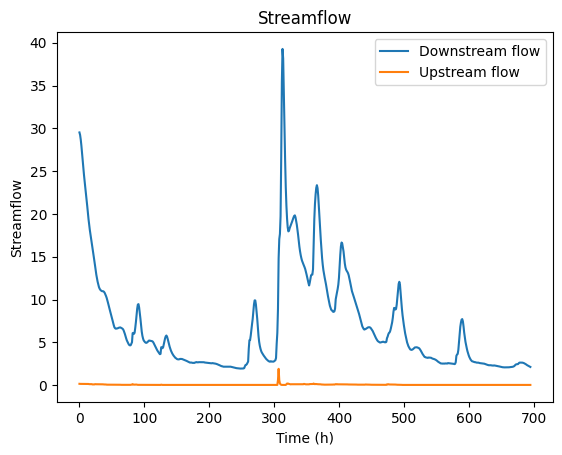

Network: 783
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


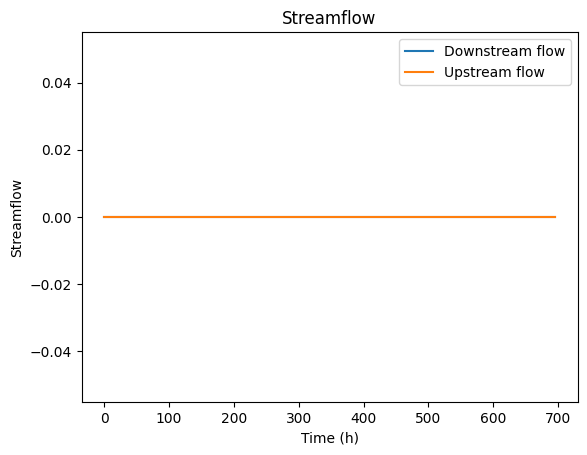

Network: 784
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


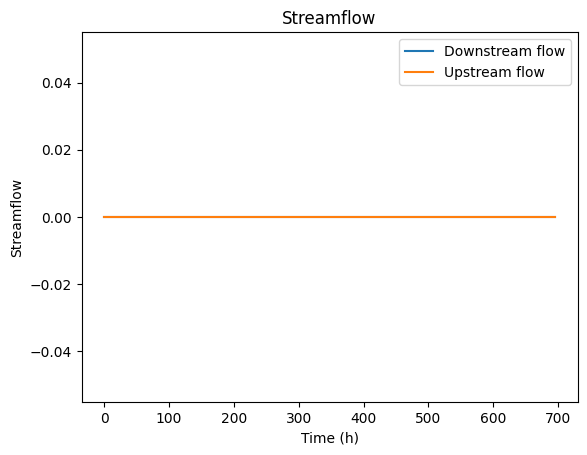

Network: 785
Streamflow (downstream) mean: 0.12
Streamflow (upstream) mean: 0.07


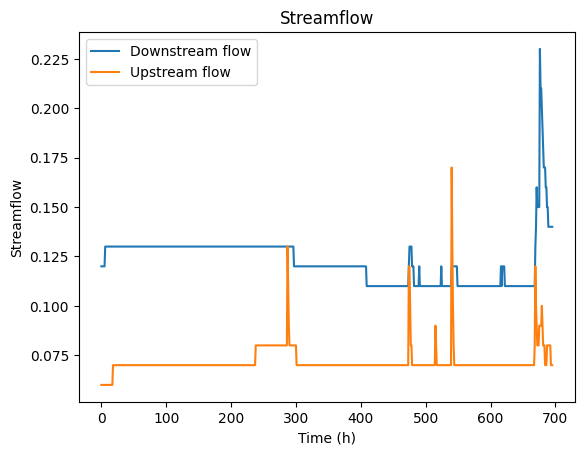

Network: 786
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.01


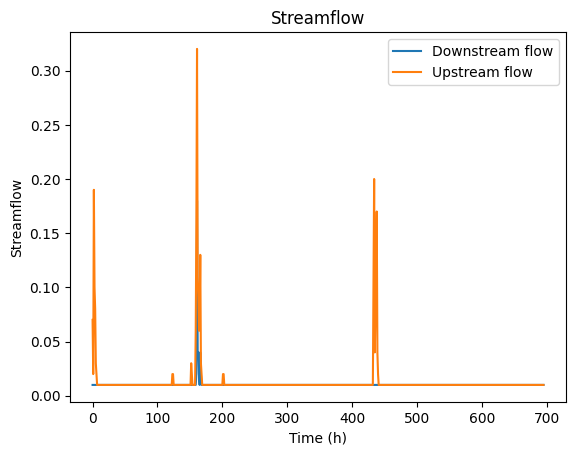

Network: 787
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


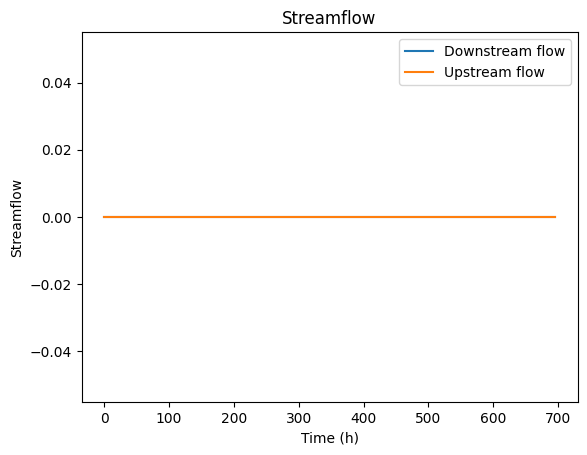

Network: 788
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.06


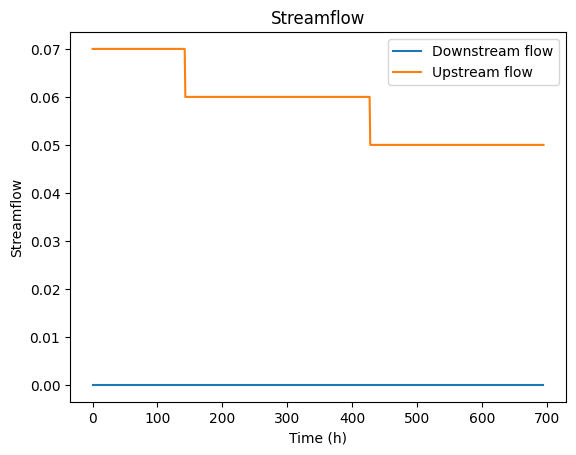

Network: 789
Streamflow (downstream) mean: 0.2
Streamflow (upstream) mean: 0.17


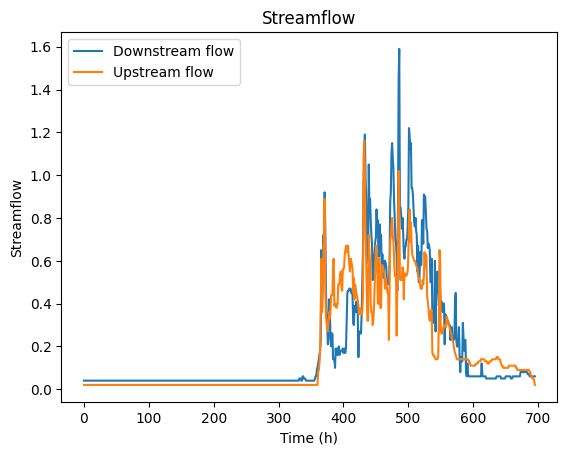

Network: 790
Streamflow (downstream) mean: 0.14
Streamflow (upstream) mean: 0.05


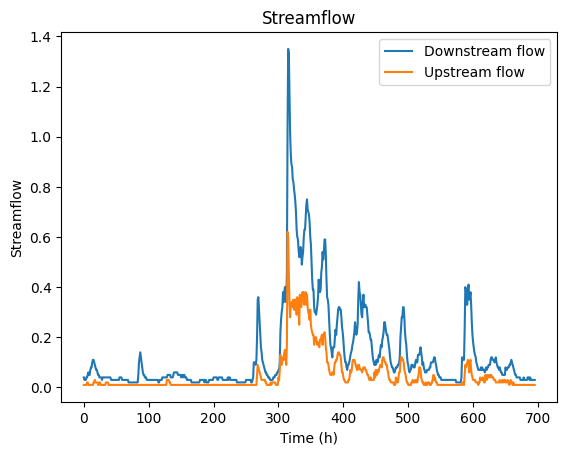

Network: 791
Streamflow (downstream) mean: 2.0
Streamflow (upstream) mean: 0.76


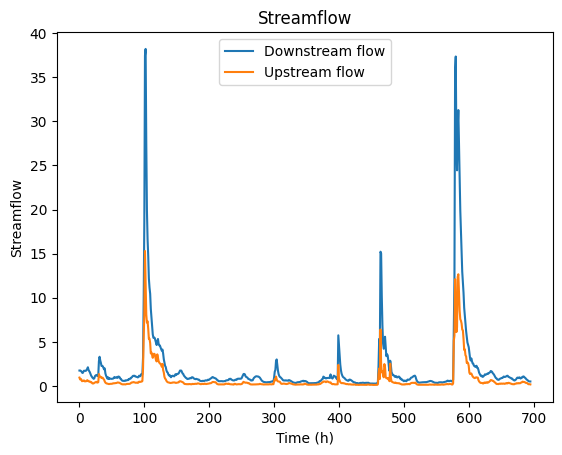

Network: 792
Streamflow (downstream) mean: 0.35
Streamflow (upstream) mean: 0.0


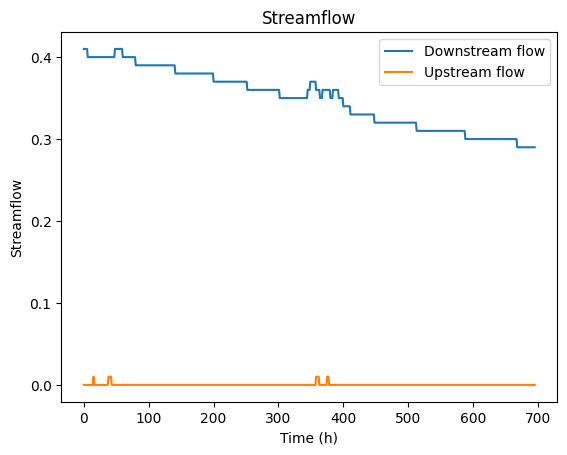

Network: 793
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


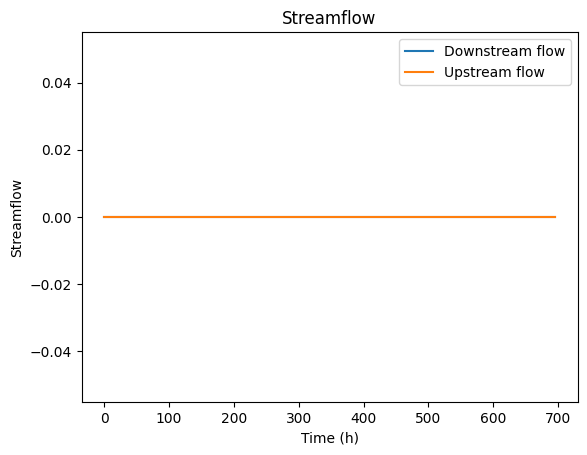

Network: 794
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


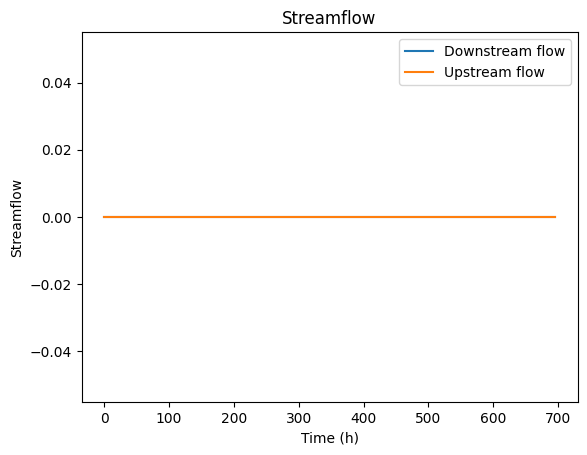

Network: 795
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


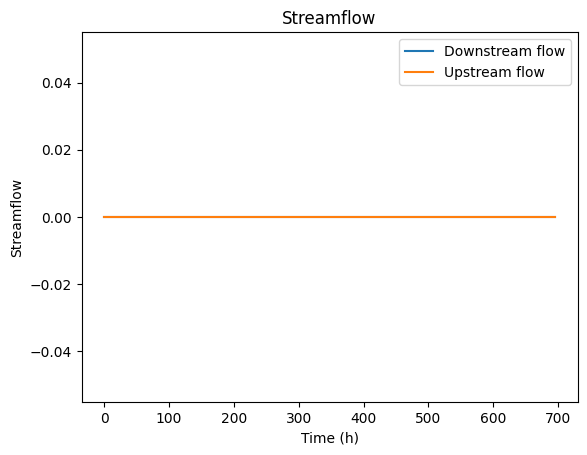

Network: 796
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.01


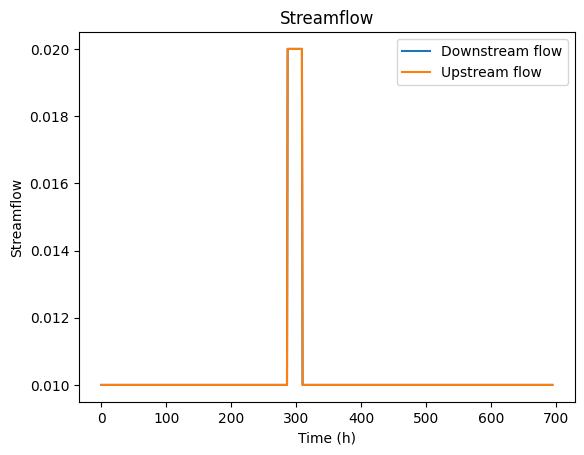

Network: 797
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


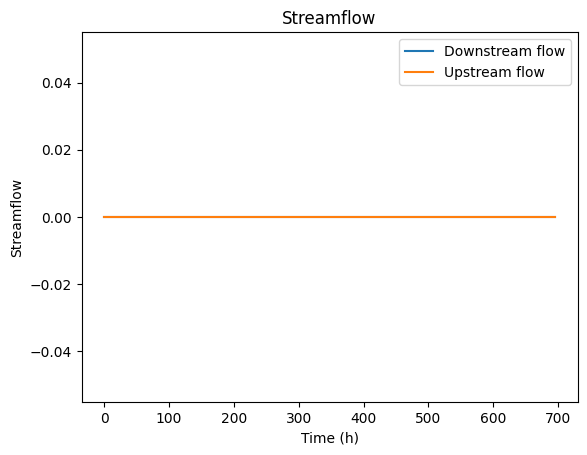

Network: 798
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


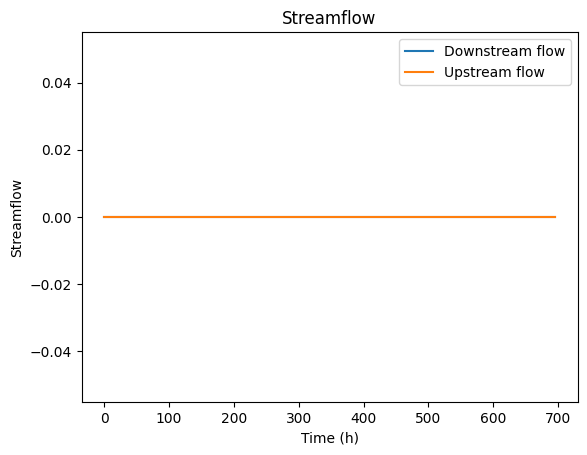

Network: 799
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


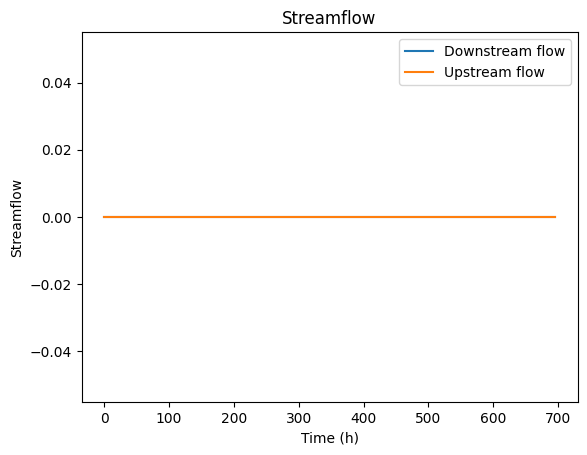

Network: 800
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.02


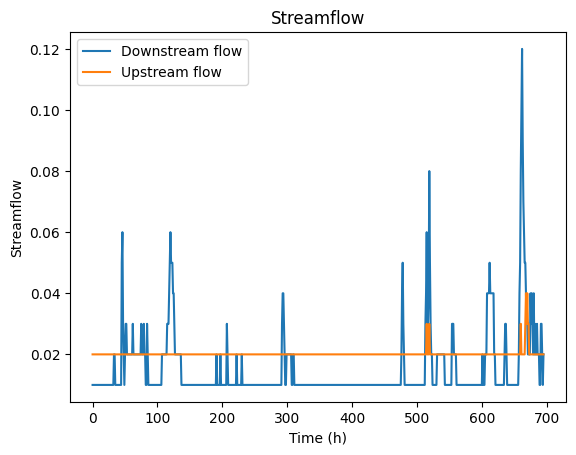

Network: 801
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.0


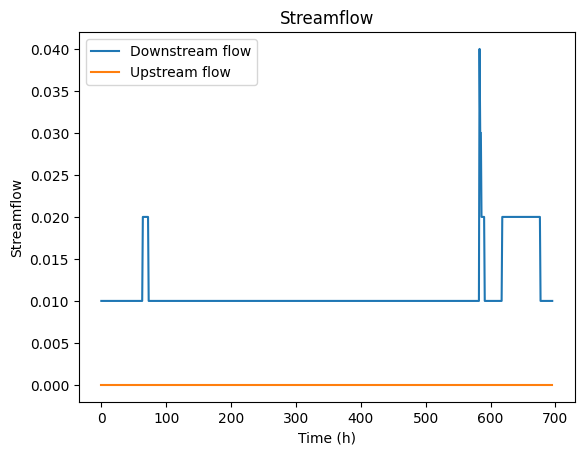

Network: 802
Streamflow (downstream) mean: 0.28
Streamflow (upstream) mean: 0.01


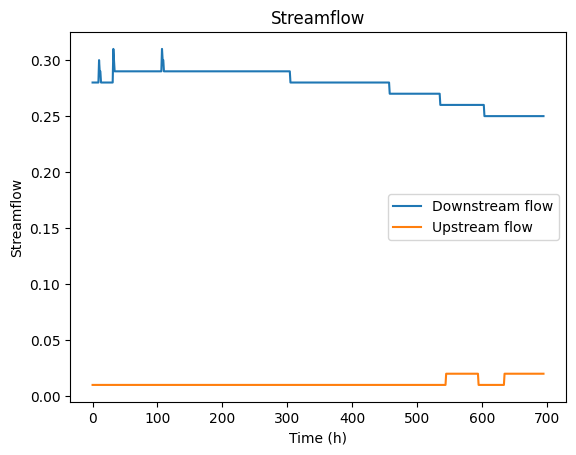

Network: 803
Streamflow (downstream) mean: 1825.23
Streamflow (upstream) mean: 0.01


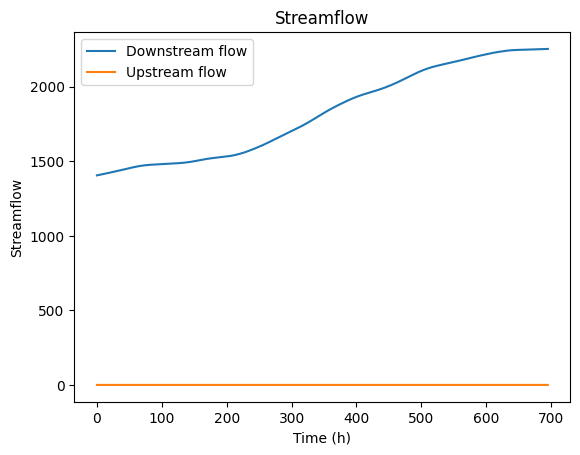

Network: 804
Streamflow (downstream) mean: 0.07
Streamflow (upstream) mean: 0.07


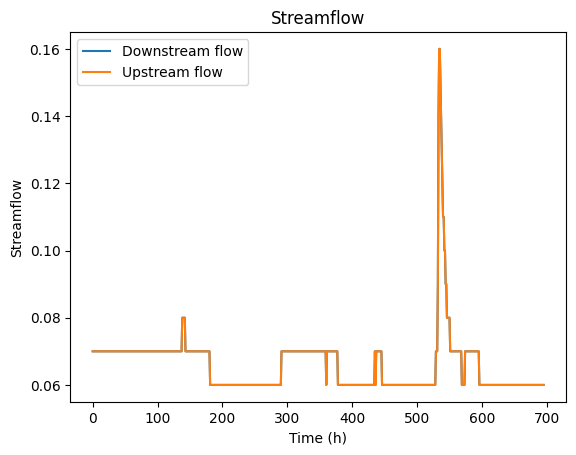

Network: 805
Streamflow (downstream) mean: 0.55
Streamflow (upstream) mean: 0.45


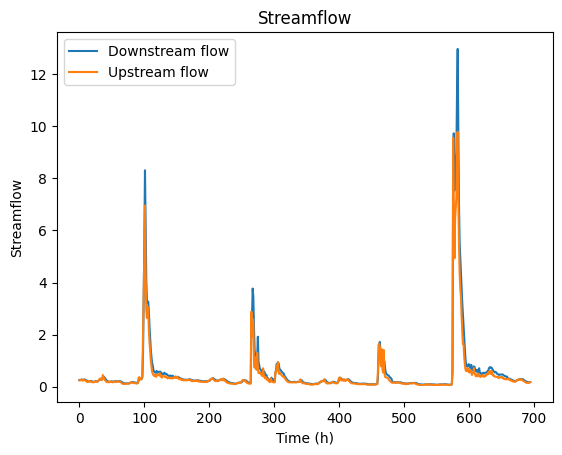

Network: 806
Streamflow (downstream) mean: 0.11
Streamflow (upstream) mean: 0.08


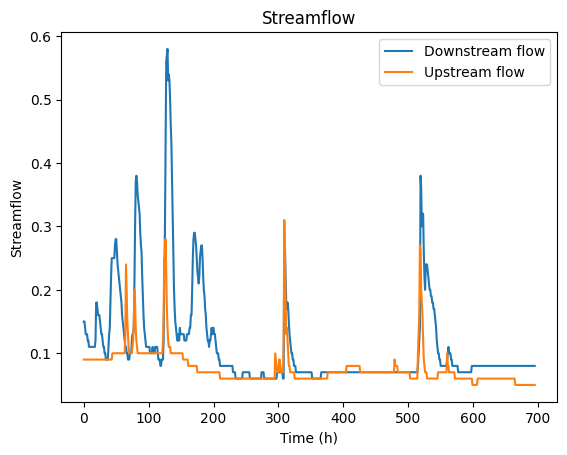

Network: 807
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


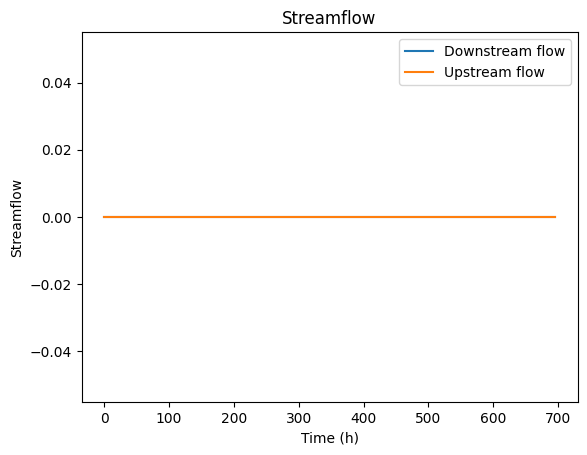

Network: 808
Streamflow (downstream) mean: 26.79
Streamflow (upstream) mean: 0.09


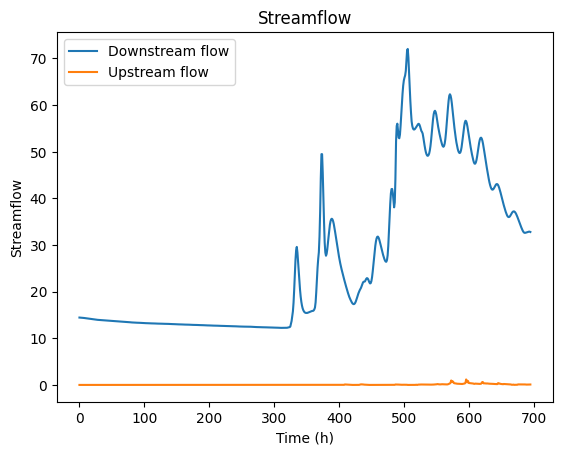

Network: 809
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


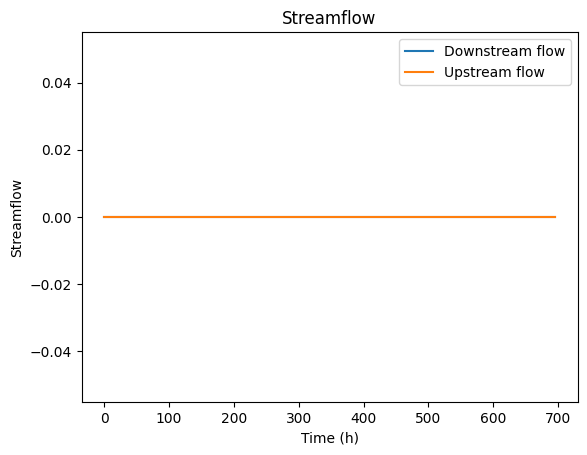

Network: 810
Streamflow (downstream) mean: 0.05
Streamflow (upstream) mean: 0.03


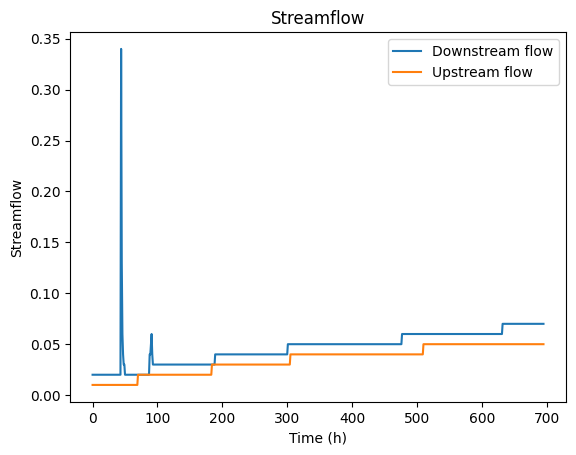

Network: 811
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.02


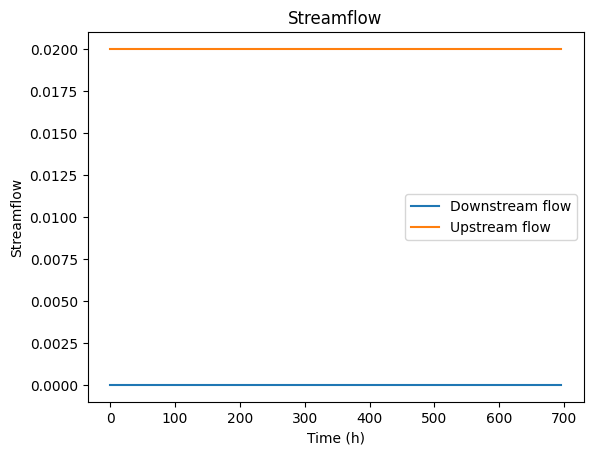

Network: 812
Streamflow (downstream) mean: 2.5
Streamflow (upstream) mean: 0.03


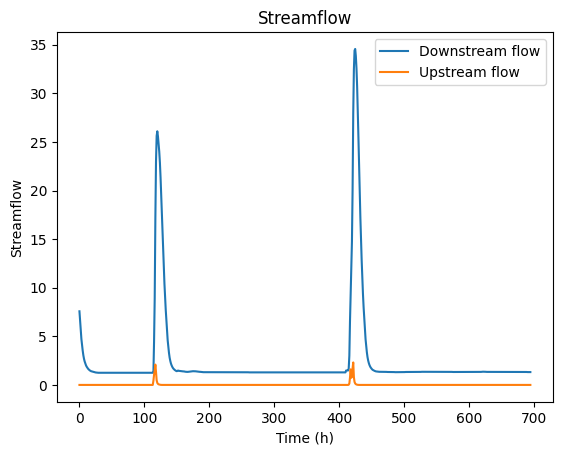

Network: 813
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


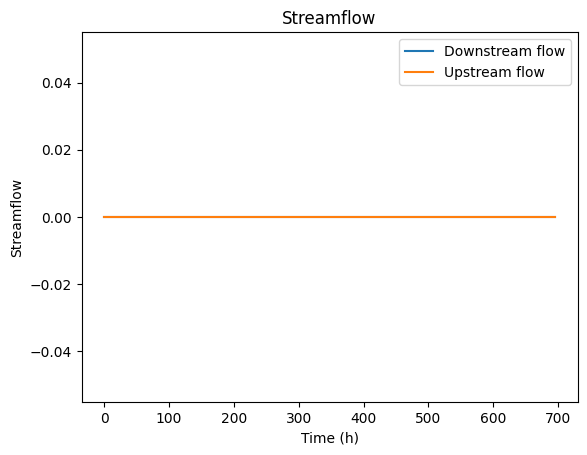

Network: 814
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


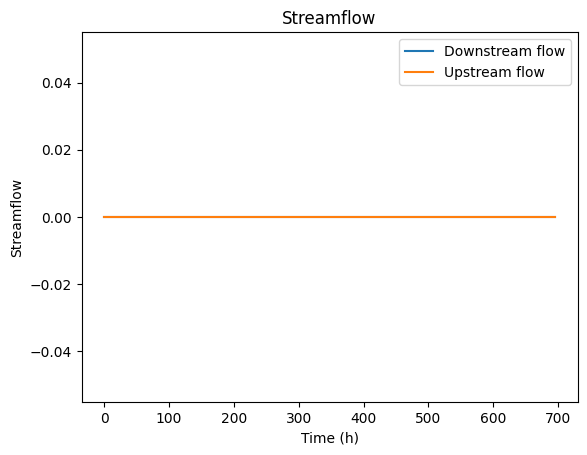

Network: 815
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


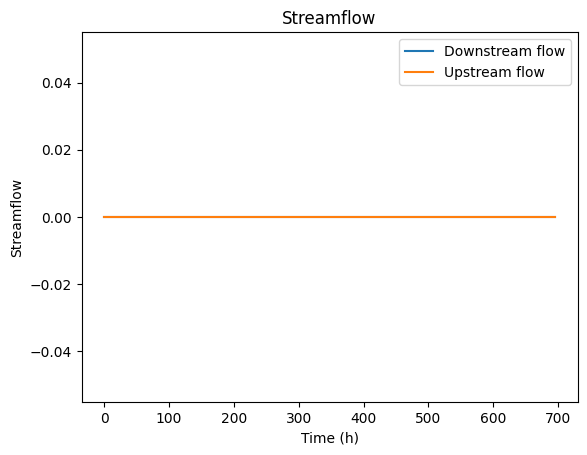

Network: 816
Streamflow (downstream) mean: 0.03
Streamflow (upstream) mean: 0.01


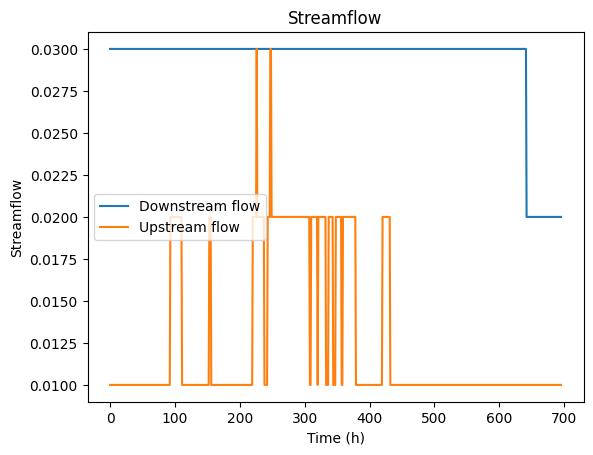

Network: 817
Streamflow (downstream) mean: 0.47
Streamflow (upstream) mean: 0.05


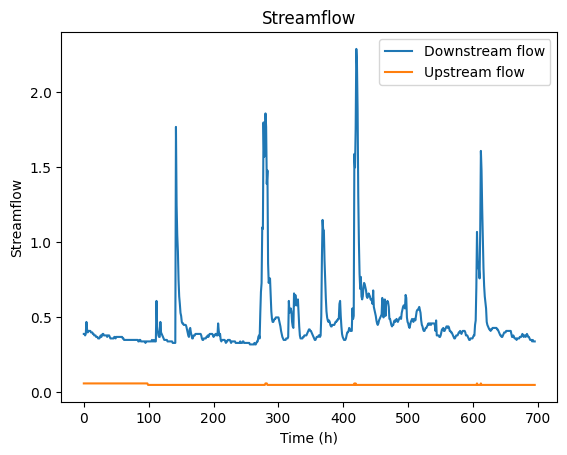

Network: 818
Streamflow (downstream) mean: 0.08
Streamflow (upstream) mean: 0.0


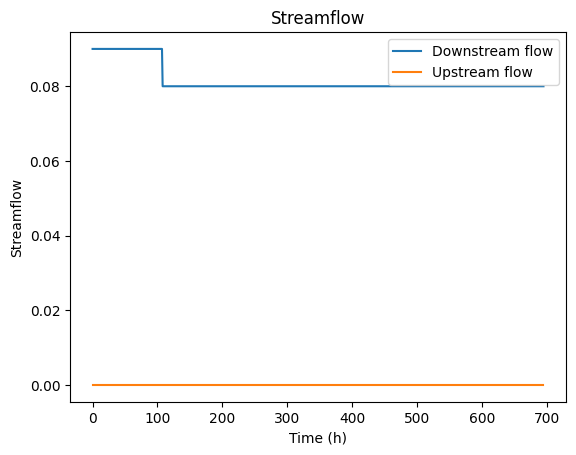

Network: 819
Streamflow (downstream) mean: 0.02
Streamflow (upstream) mean: 0.03


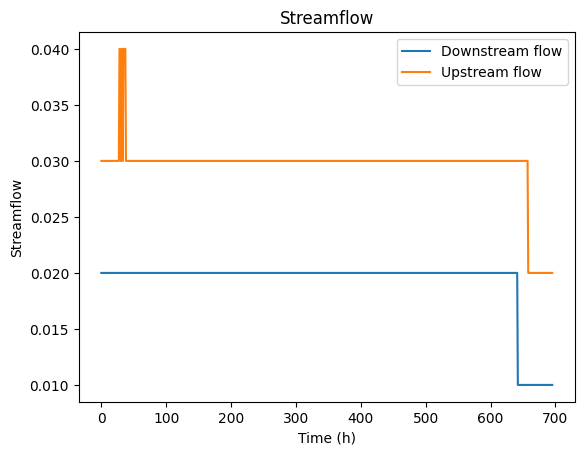

Network: 820
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


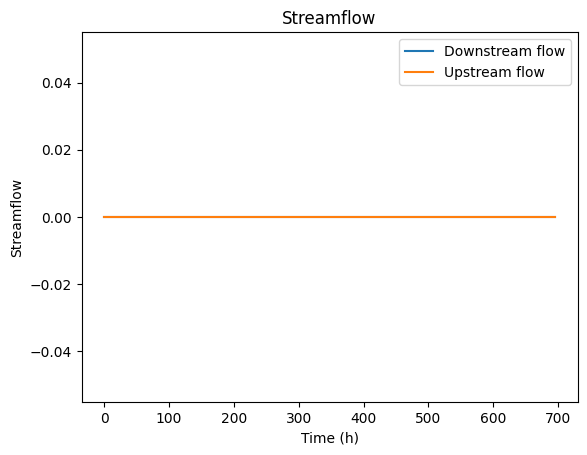

Network: 821
Streamflow (downstream) mean: 0.47
Streamflow (upstream) mean: 0.32


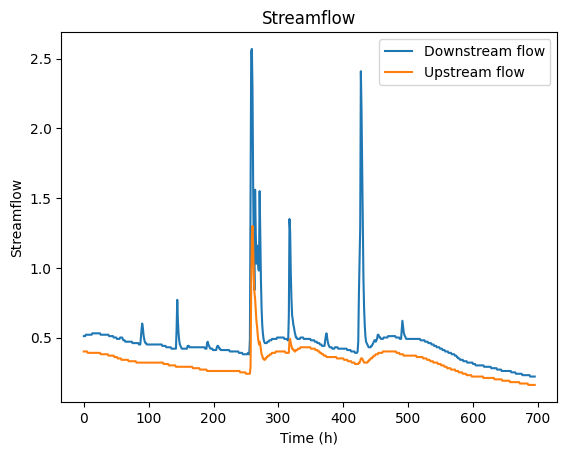

Network: 822
Streamflow (downstream) mean: 0.12
Streamflow (upstream) mean: 0.17


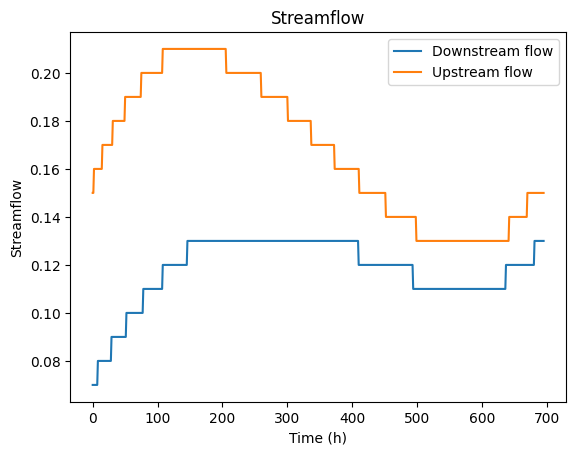

Network: 823
Streamflow (downstream) mean: 0.44
Streamflow (upstream) mean: 0.21


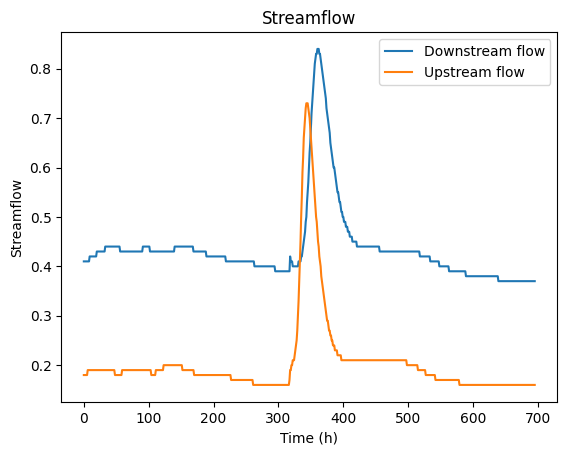

Network: 824
Streamflow (downstream) mean: 0.03
Streamflow (upstream) mean: 0.0


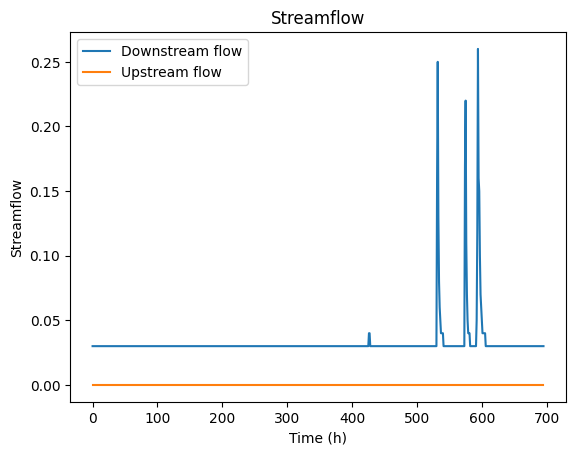

Network: 825
Streamflow (downstream) mean: 0.04
Streamflow (upstream) mean: 0.0


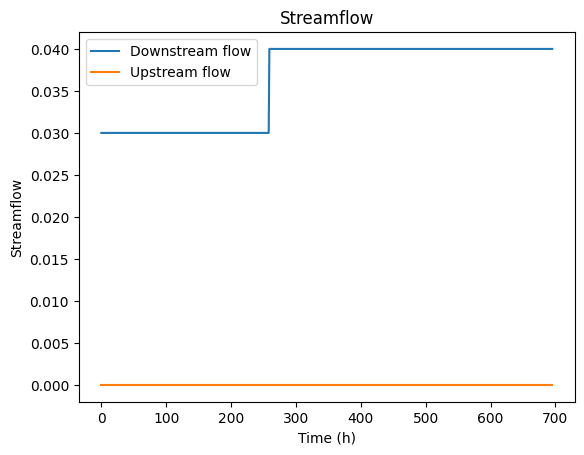

Network: 826
Streamflow (downstream) mean: 0.07
Streamflow (upstream) mean: 0.02


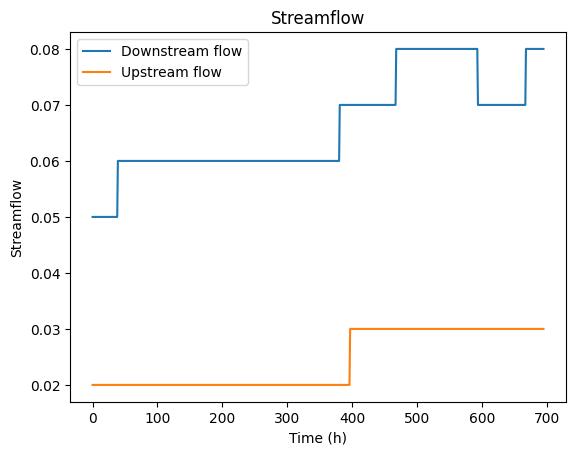

Network: 827
Streamflow (downstream) mean: 5.44
Streamflow (upstream) mean: 0.34


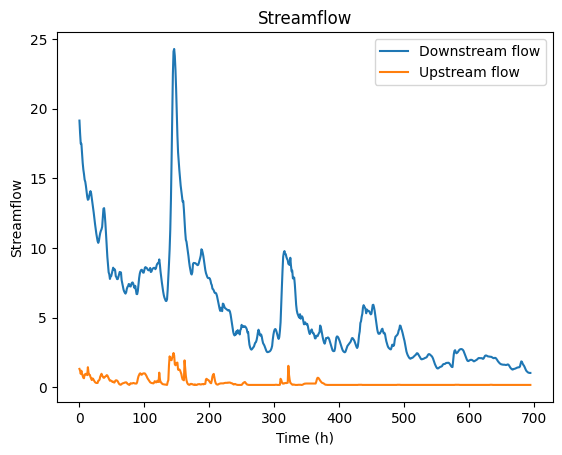

Network: 828
Streamflow (downstream) mean: 5.32
Streamflow (upstream) mean: 0.17


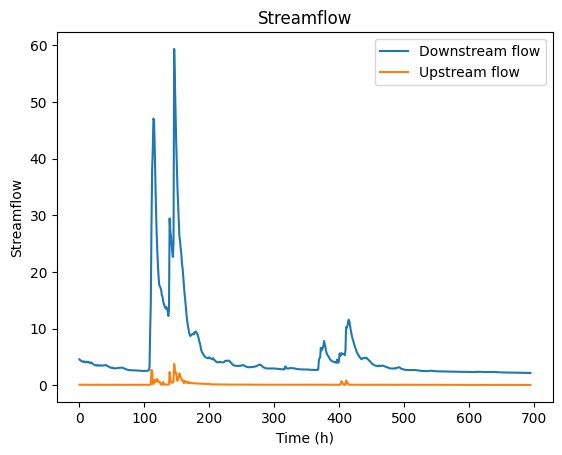

Network: 829
Streamflow (downstream) mean: 4.25
Streamflow (upstream) mean: 0.15


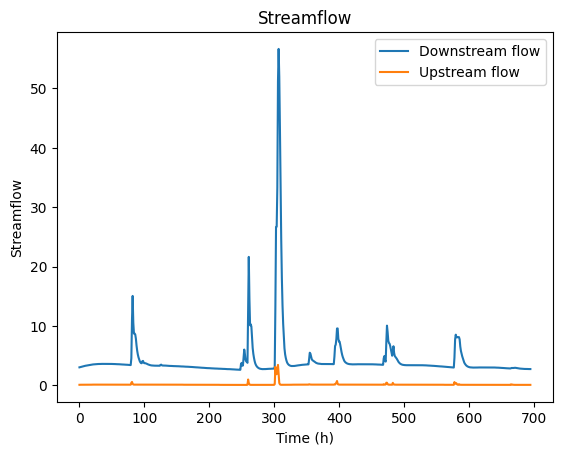

Network: 830
Streamflow (downstream) mean: 0.17
Streamflow (upstream) mean: 191.96


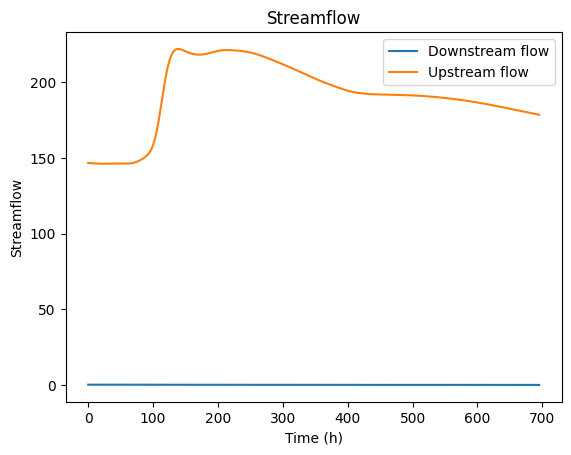

Network: 831
Streamflow (downstream) mean: 3.0
Streamflow (upstream) mean: 0.5


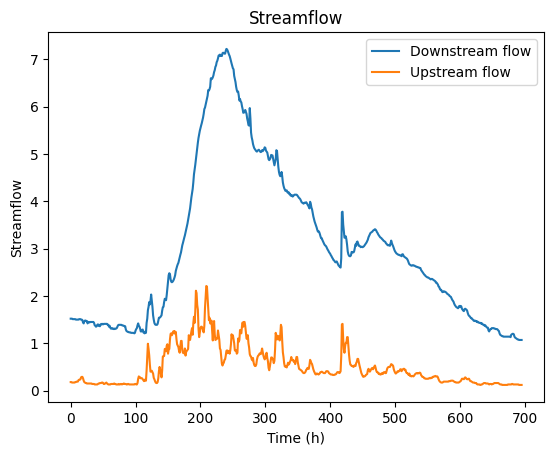

Network: 832
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


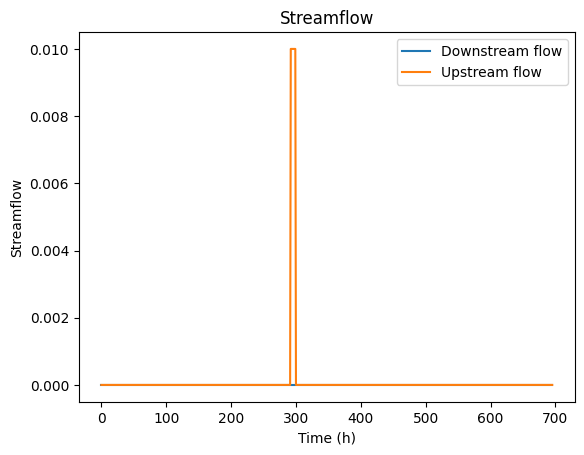

Network: 833
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.06


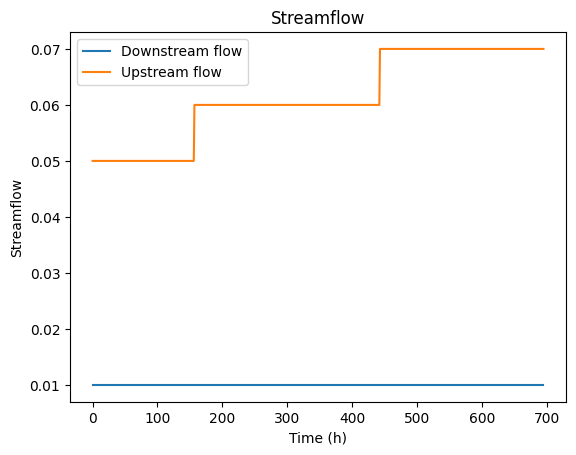

Network: 834
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.19


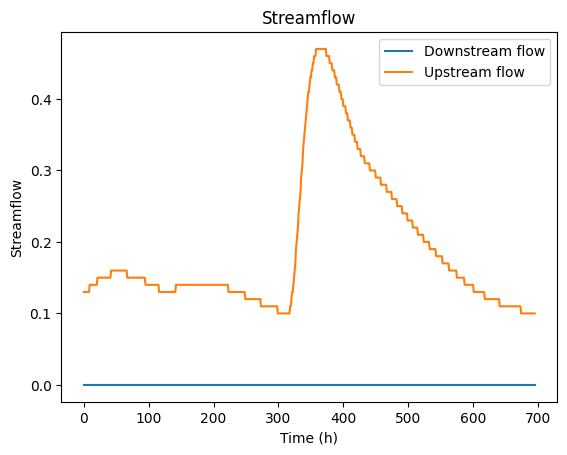

Network: 835
Streamflow (downstream) mean: 0.1
Streamflow (upstream) mean: 0.25


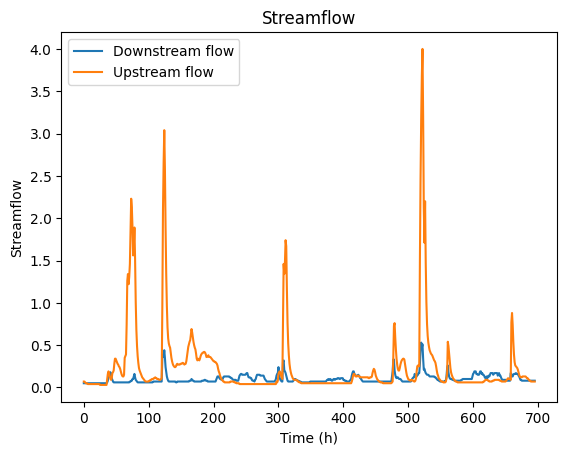

Network: 836
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 1.32


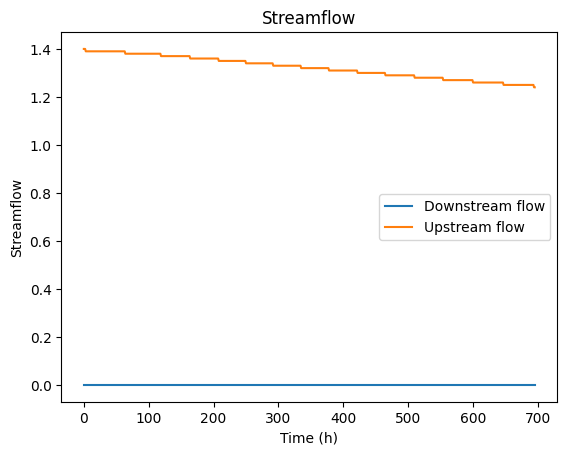

Network: 837
Streamflow (downstream) mean: 0.03
Streamflow (upstream) mean: 0.05


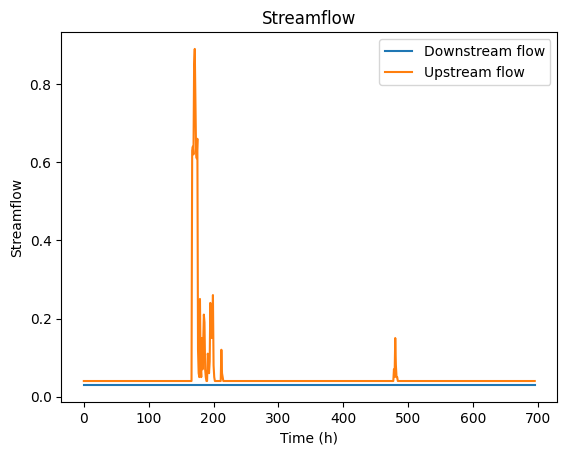

Network: 838
Streamflow (downstream) mean: 0.04
Streamflow (upstream) mean: 0.0


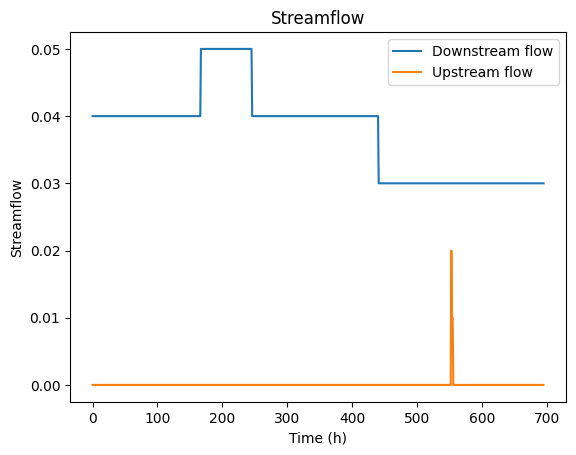

Network: 839
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


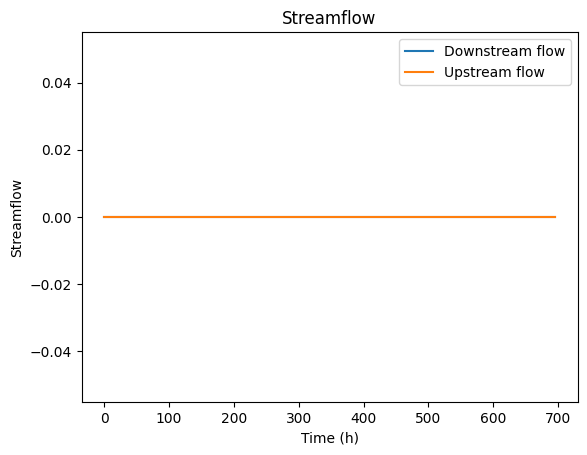

Network: 840
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.29


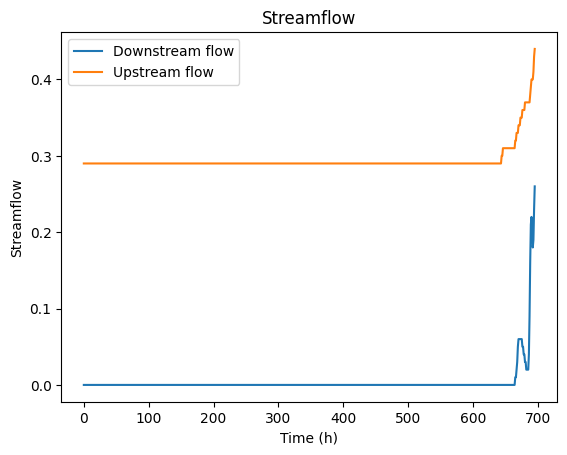

Network: 841
Streamflow (downstream) mean: 0.69
Streamflow (upstream) mean: 0.46


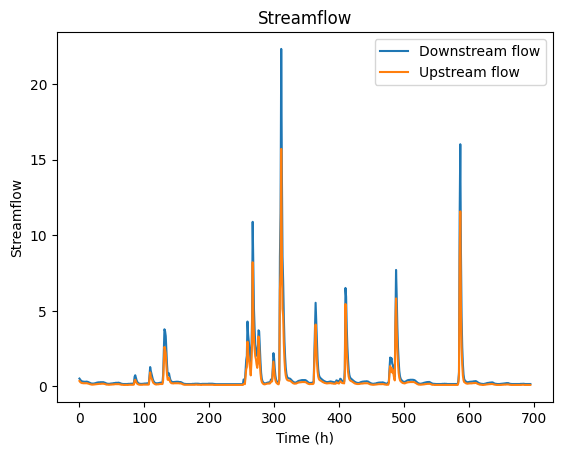

Network: 842
Streamflow (downstream) mean: 0.03
Streamflow (upstream) mean: 0.0


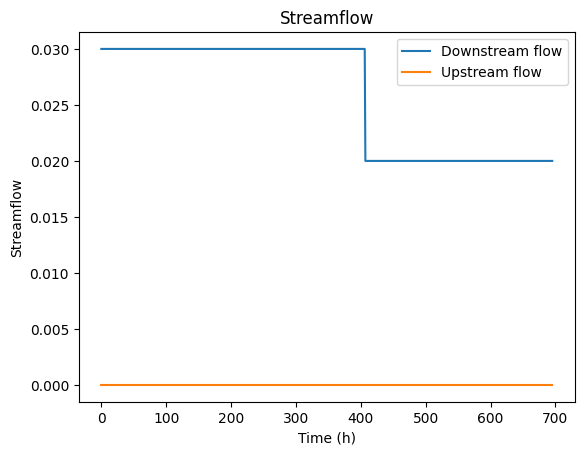

Network: 843
Streamflow (downstream) mean: 0.27
Streamflow (upstream) mean: 0.07


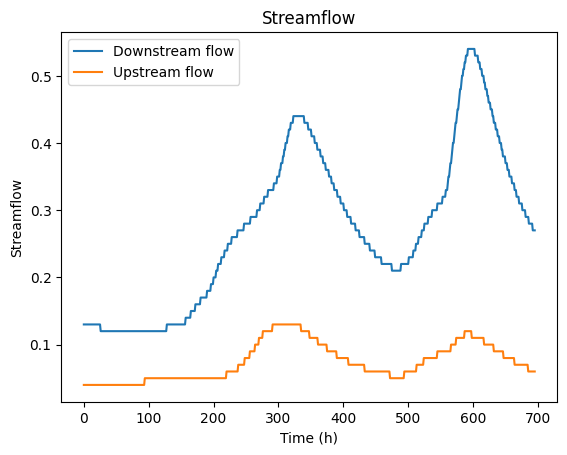

Network: 844
Streamflow (downstream) mean: 0.75
Streamflow (upstream) mean: 0.01


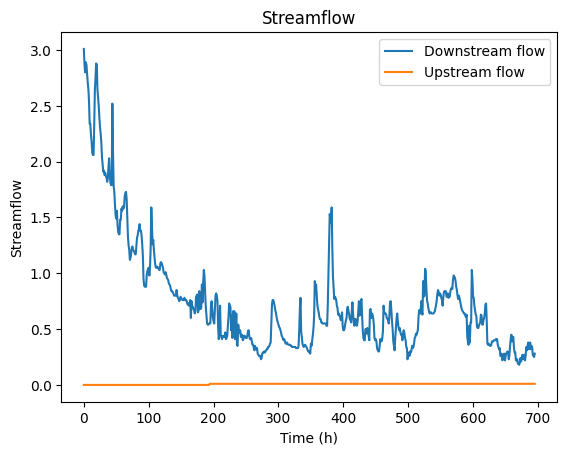

Network: 845
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.02


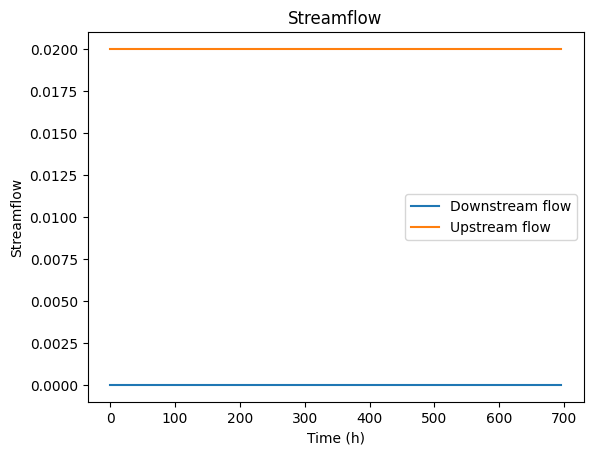

Network: 846
Streamflow (downstream) mean: 0.73
Streamflow (upstream) mean: 0.31


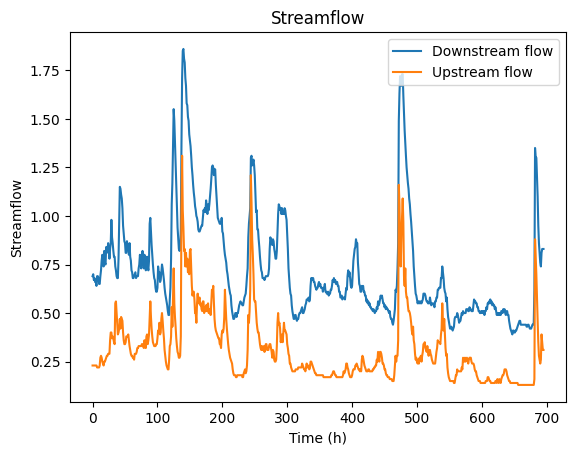

Network: 847
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


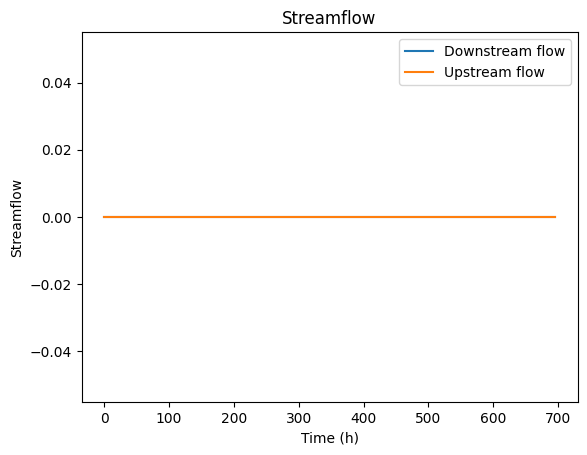

Network: 848
Streamflow (downstream) mean: 3.97
Streamflow (upstream) mean: 1.11


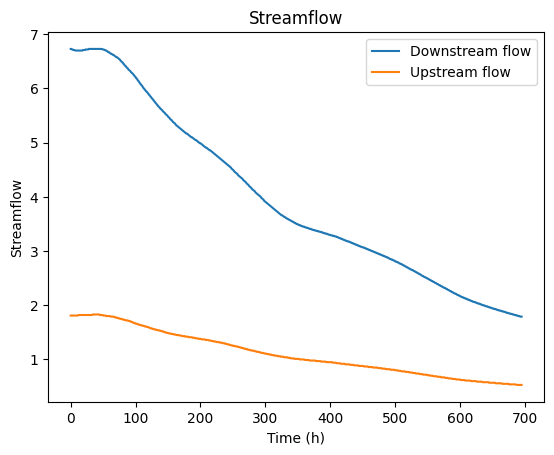

Network: 849
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.02


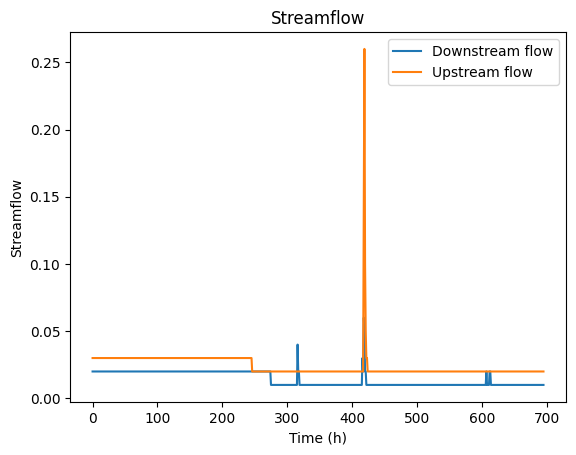

Network: 850
Streamflow (downstream) mean: 14.89
Streamflow (upstream) mean: 0.0


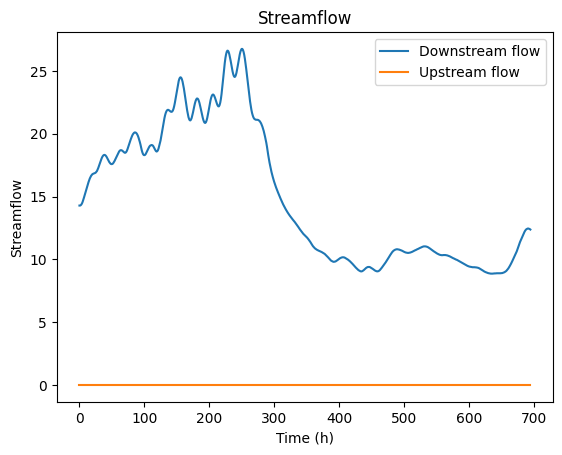

Network: 851
Streamflow (downstream) mean: 0.1
Streamflow (upstream) mean: 0.06


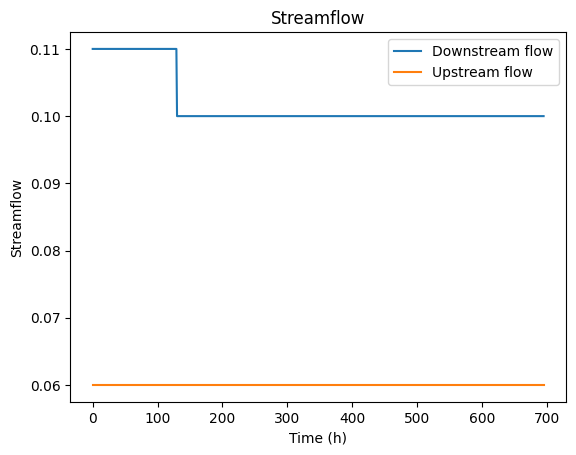

Network: 852
Streamflow (downstream) mean: 0.05
Streamflow (upstream) mean: 0.0


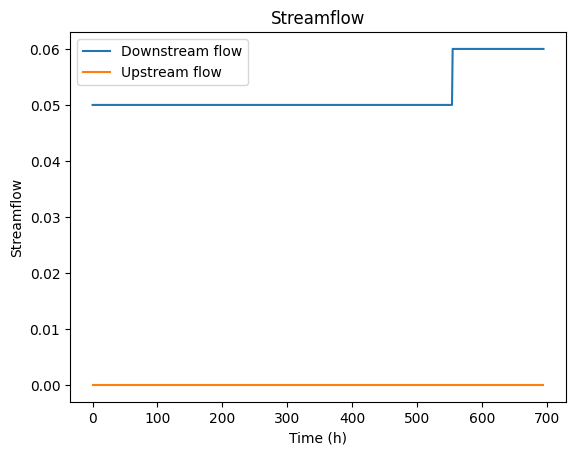

Network: 853
Streamflow (downstream) mean: 0.11
Streamflow (upstream) mean: 0.01


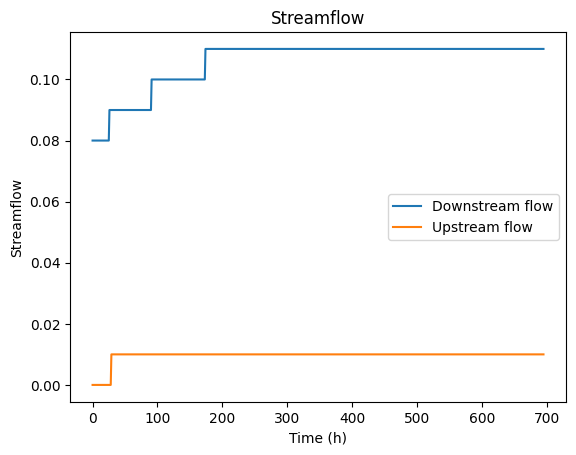

Network: 854
Streamflow (downstream) mean: 3.52
Streamflow (upstream) mean: 0.42


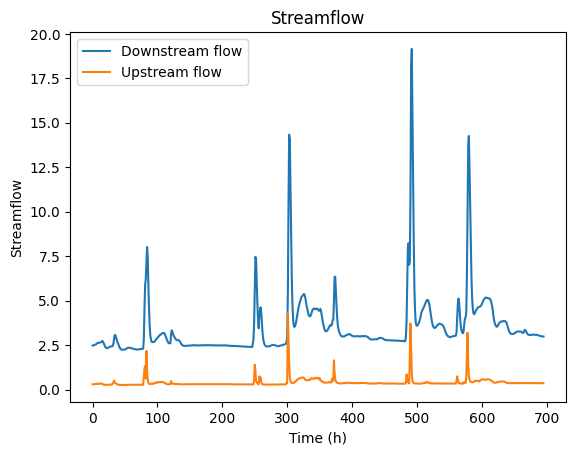

Network: 855
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


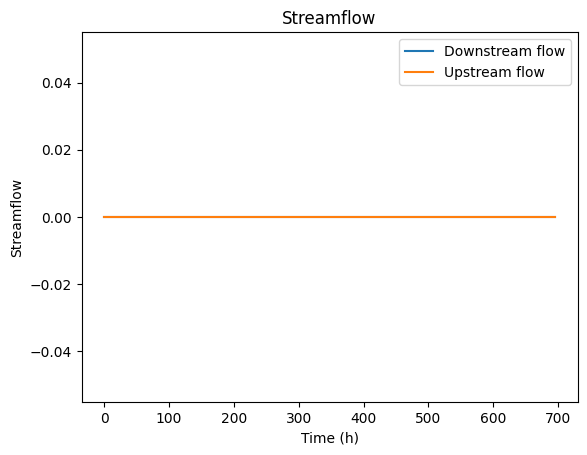

Network: 856
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


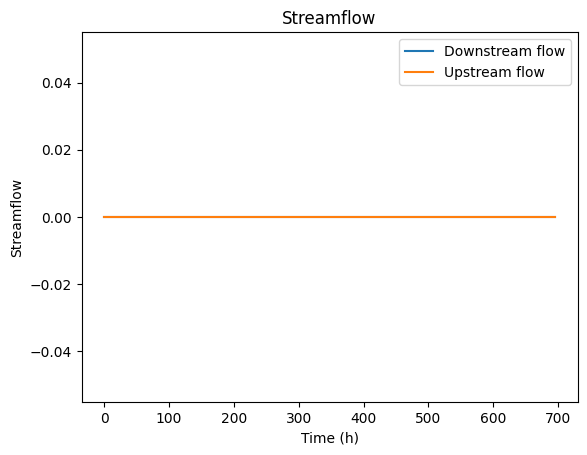

Network: 857
Streamflow (downstream) mean: 0.01
Streamflow (upstream) mean: 0.0


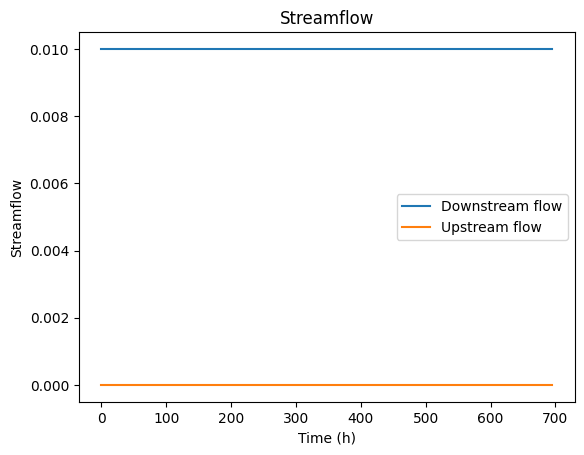

Network: 858
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


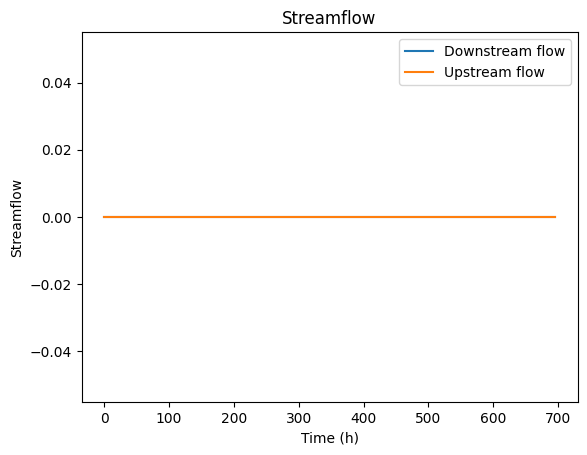

Network: 859
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.08


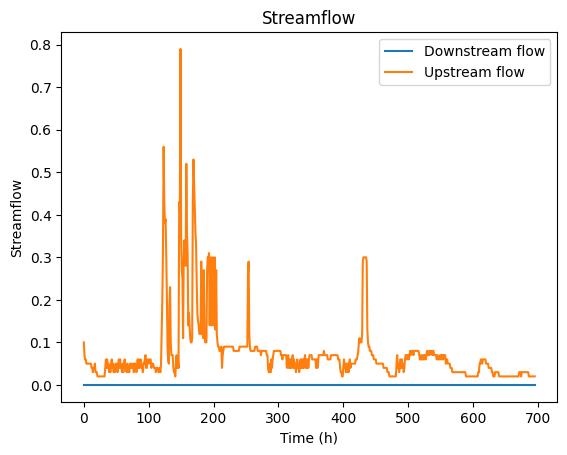

Network: 860
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


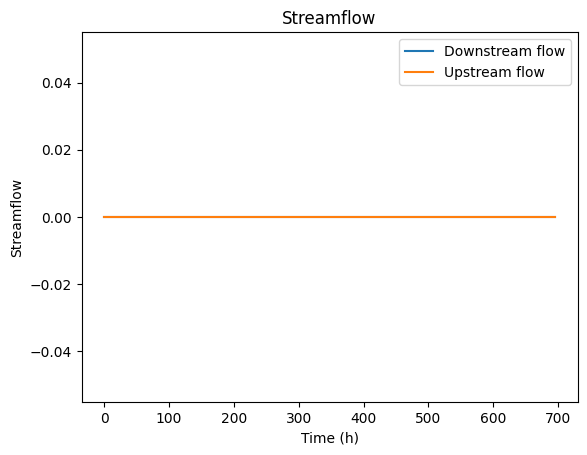

Network: 861
Streamflow (downstream) mean: 0.2
Streamflow (upstream) mean: 0.22


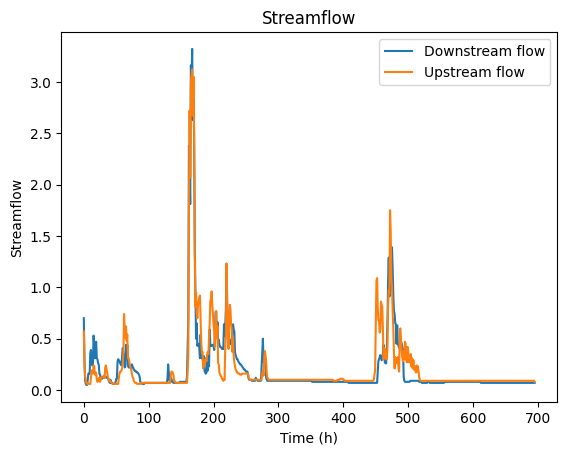

Network: 862
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


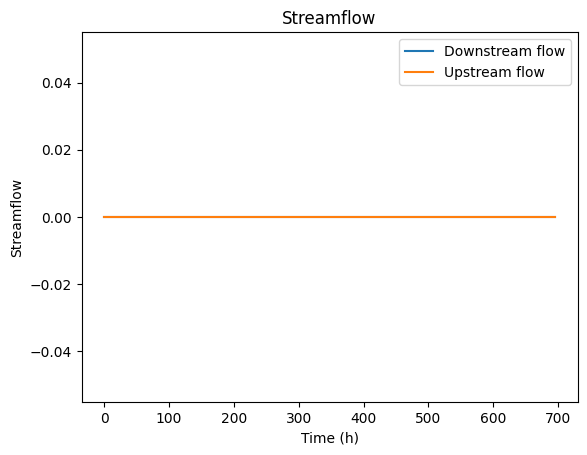

Network: 863
Streamflow (downstream) mean: 0.0
Streamflow (upstream) mean: 0.0


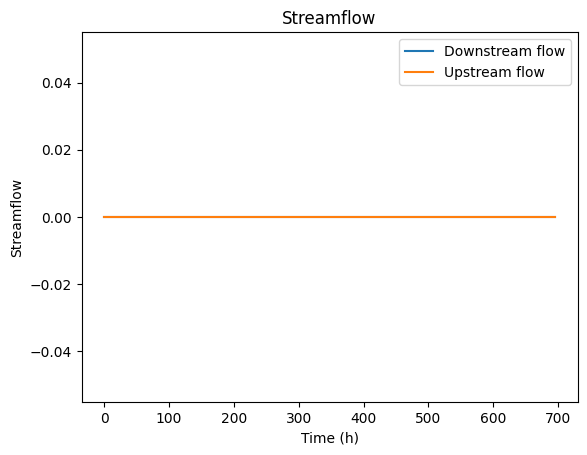

Network: 864
Streamflow (downstream) mean: 0.08
Streamflow (upstream) mean: 0.04


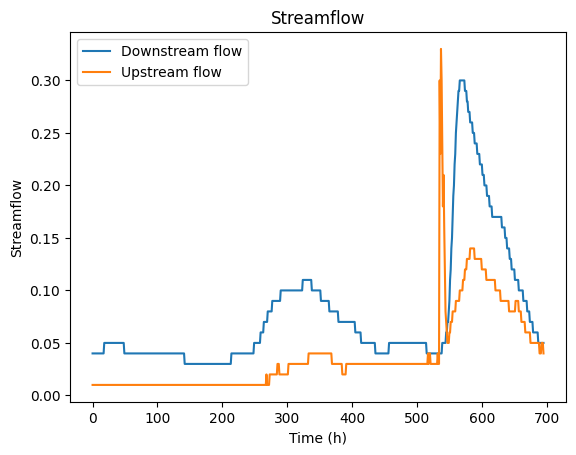

In [142]:
displayed = 0

for ibuc in networks_for_val:
    viz_networks(ibuc)
    displayed += 1



### 2. LSTM

In [143]:
class LSTM1(nn.Module):
    def __init__(self, num_classes, input_size, hidden_size, num_layers, batch_size, seq_length):
        super(LSTM1, self).__init__()
        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.seq_length = seq_length 
        self.batch_size = batch_size

        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size, batch_first=True)
        self.relu = nn.ReLU()
        self.tanh = nn.Tanh()
        self.fc_1 =  nn.Linear(hidden_size, num_classes) #fully connected 1
   
    def forward(self, x, init_states=None):

        if init_states is None:
            h_t = Variable(torch.zeros(1, x.size(0), self.hidden_size, device=device)) # hidden state
            c_t = Variable(torch.zeros(1, x.size(0), self.hidden_size, device=device)) # internal state
            init_states = (h_t, c_t)
           
        out, _ = self.lstm(x, init_states)
        out = self.relu(out)
        prediction = self.fc_1(out) # Dense, fully connected layer
        
        return prediction

In [144]:
def check_validation_period(lstm, np_val_seq_X, ibuc, n_plot=1000):

    def __make_prediction():
        lstm_output_val = lstm(torch.Tensor(np_val_seq_X[ibuc]).to(device=device))
        val_predictions = {var: [] for var in lstm_outputs}

        for i in range(lstm_output_val.shape[0]):
            for j, var in enumerate(lstm_outputs):
                val_predictions[var].append((lstm_output_val[i, -1, j].cpu().detach().numpy() * \
                                             np.std(df.loc[train_start:train_end, var])) + \
                                            np.mean(df.loc[train_start:train_end, var]))
        return val_predictions
    
    def __compute_nse(val_predictions):
        nse_values = {}
        for var in lstm_outputs:
            actual_values = df.loc[val_start:val_end, var]
            mean_actual = np.mean(actual_values)
            pred_variance = 0
            obs_variance = 0

            for i, pred in enumerate(val_predictions[var]):
                t = i + seq_length - 1
                pred_variance += np.power((pred - actual_values.values[t]), 2)
                obs_variance += np.power((mean_actual - actual_values.values[t]), 2)

            nse_values[var] = np.round(1 - (pred_variance / obs_variance), 4)

        return nse_values

    df = network_dict[ibuc]
    val_predictions = __make_prediction()
    nse_values = __compute_nse(val_predictions)

    for var in lstm_outputs:
        print(f"{var} NSE: {nse_values[var]}")
    
    fig, axes = plt.subplots(1, len(lstm_outputs), figsize=(20, 3))
    if len(lstm_outputs) == 1:
        axes = [axes]
        
    for ax, var in zip(axes, lstm_outputs):
        obs_start = val_start + seq_length
        obs_end = obs_start + n_plot
        ax.plot(df.loc[obs_start:obs_end, var].values, label=f"{var} actual")
        ax.plot(val_predictions[var][:n_plot], label=f"LSTM {var} predicted")
        ax.legend()
    
    plt.show()
    plt.close()

In [145]:
torch.manual_seed(1)
lstm = LSTM1(num_classes=n_output,  
             input_size=n_input,    
             hidden_size=hidden_state_size, 
             num_layers=num_layers, 
             batch_size=batch_size, 
             seq_length=seq_length).to(device=device)

In [146]:
def fit_scaler():
    frames = [network_dict[ibuc].loc[train_start:train_end, lstm_inputs] for ibuc in networks_for_training]
    df_in = pd.concat(frames)    
    scaler_in = StandardScaler()
    _ = scaler_in.fit_transform(df_in)

    frames = [network_dict[ibuc].loc[train_start:train_end, lstm_outputs] for ibuc in networks_for_training]
    df_out = pd.concat(frames)    
    scaler_out = StandardScaler()
    _ = scaler_out.fit_transform(df_out)
    return scaler_in, scaler_out

In [147]:
scaler_in, scaler_out = fit_scaler()

In [148]:
def make_data_loader(start, end, network_list):
    loader = {}
    np_seq_X = {}
    np_seq_y = {}
    for ibuc in network_list:
        df = network_dict[ibuc]
        scaler_in_i = scaler_in.transform(df.loc[start:end, lstm_inputs])
        scaler_out_i = scaler_out.transform(df.loc[start:end, lstm_outputs])
        
        n_samples = scaler_in_i.shape[0] - seq_length
        
        np_seq_X[ibuc] = np.zeros((n_samples, seq_length, n_input))
        np_seq_y[ibuc] = np.zeros((n_samples, seq_length, n_output)) 

        for i in range(n_samples):
            t = i + seq_length
            np_seq_X[ibuc][i, :, :] = scaler_in_i[i:t, :]
            np_seq_y[ibuc][i, :] = scaler_out_i[i:t, :]

        ds = torch.utils.data.TensorDataset(torch.Tensor(np_seq_X[ibuc]), 
                                            torch.Tensor(np_seq_y[ibuc]))
        loader[ibuc] = torch.utils.data.DataLoader(ds, batch_size=batch_size, shuffle=True)
    return loader, np_seq_X, np_seq_y

In [149]:
train_loader, np_train_seq_X, np_train_seq_y = make_data_loader(train_start, train_end, networks_for_training)
val_loader, np_val_seq_X, np_val_seq_y = make_data_loader(val_start, val_end, networks_for_val)
test_loader, np_test_seq_X, np_test_seq_y = make_data_loader(test_start, test_end, networks_for_test)

In [150]:
def train_model(lstm, train_loader, networks_for_training):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(lstm.parameters(), lr=learning_rate[0])
    epoch_bar = tqdm(range(num_epochs),desc="Training", position=0, total=num_epochs)
    
    # Create a dictionary to store the results
    results = {}
    for epoch in epoch_bar:

        for ibuc in networks_for_training:

            batch_bar = tqdm(enumerate(train_loader[ibuc]),
                             desc="network: {}, Epoch: {}".format(str(ibuc),str(epoch)),
                             position=1,
                             total=len(train_loader[ibuc]), leave=False, disable=True)

            for i, (data, targets) in batch_bar:

                optimizer.zero_grad()

                optimizer = optim.Adam(lstm.parameters(), lr=learning_rate[epoch])

                data = data.to(device=device)
                targets = targets.to(device=device)

                # Forward
                lstm_output = lstm(data)
                loss = criterion(lstm_output[:,-1,:], targets[:,-1,:])

                #backward
                optimizer.zero_grad()
                loss.backward()

                # gradient descent or adam step
                optimizer.step()

                batch_bar.set_postfix(loss=loss.to(device).item(),
                                      RMSE="{:.2f}".format(loss**(1/2)),
                                      epoch=epoch)
                batch_bar.update()

            with torch.no_grad():
                rmse_list = []
                for i, (data_, targets_) in enumerate(train_loader[ibuc]):
                    data_ = data_.to(device=device)
                    targets_ = targets_.to(device=device)
                    lstm_output_ = lstm(data_)
                    MSE_ = criterion(lstm_output_, targets_)
                    rmse_list.append(MSE_**(1/2))

            meanrmse = np.mean(np.array(torch.Tensor(rmse_list)))
            epoch_bar.set_postfix(loss=loss.cpu().item(),
                                  RMSE="{:.2f}".format(meanrmse),
                                  epoch=epoch)
            
            if ibuc not in results:
                results[ibuc] = {"loss": [], "RMSE": []}
            results[ibuc]["loss"].append(loss.cpu().item())
            results[ibuc]["RMSE"].append(meanrmse)
            #....todo..? also add IT metrics in results in this function ...
            batch_bar.update()

        𝗰𝗹𝗲𝗮𝗿_𝗼𝘂𝘁𝗽𝘂𝘁
        
    return lstm, results

In [151]:
lstm, results = train_model(lstm, train_loader, networks_for_training)

Training:   0%|          | 0/8 [00:00<?, ?it/s]

In [152]:
def viz_learning_curve(results):
    fig = plt.figure(figsize=(12,3))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)
    for ibuc in networks_for_training:
        ax1.plot(range(num_epochs), results[ibuc]['loss'])
        ax2.plot(range(num_epochs), results[ibuc]['RMSE'])
    ax1.set_ylabel('Loss')
    ax2.set_ylabel('RMSE')
    ax1.set_xlabel('Epoch')
    ax2.set_xlabel('Epoch')
    plt.suptitle("Learning curves for each bucket") 
    plt.show()

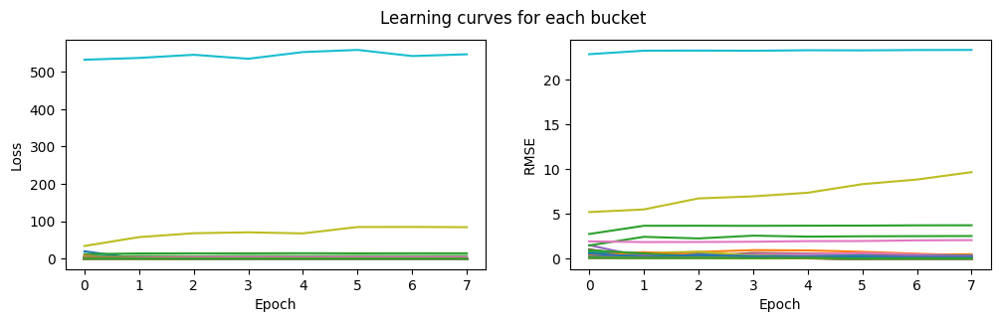

In [153]:
viz_learning_curve(results)

streamflow_y NSE: nan


/tmp/ipykernel_3407511/2629290555.py:27: RuntimeWarning: invalid value encountered in scalar divide
  nse_values[var] = np.round(1 - (pred_variance / obs_variance), 4)


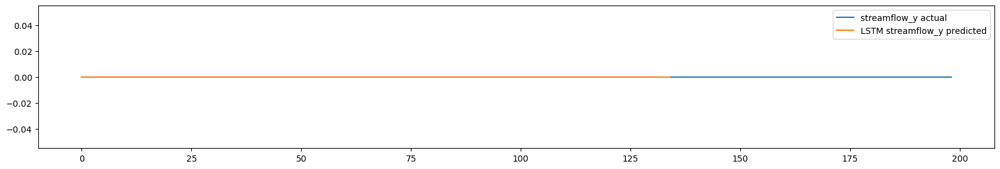

streamflow_y NSE: 0.75


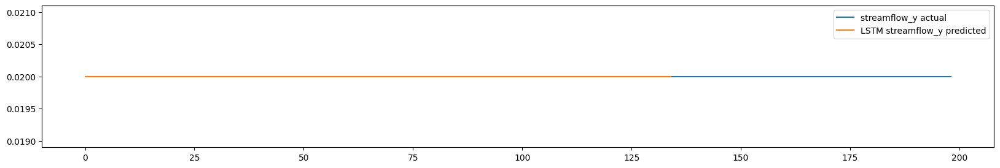

streamflow_y NSE: nan


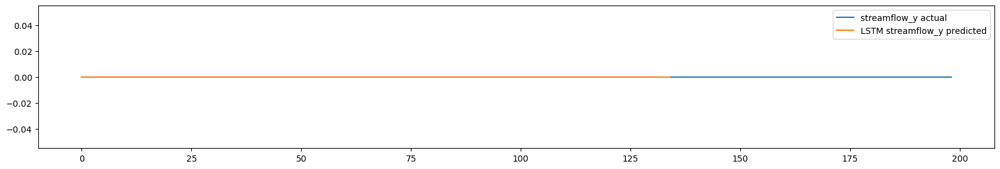

streamflow_y NSE: -0.1917


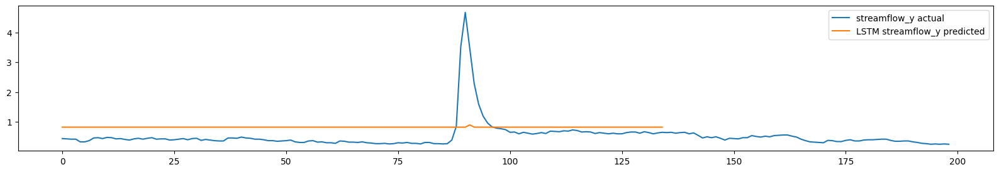

streamflow_y NSE: nan


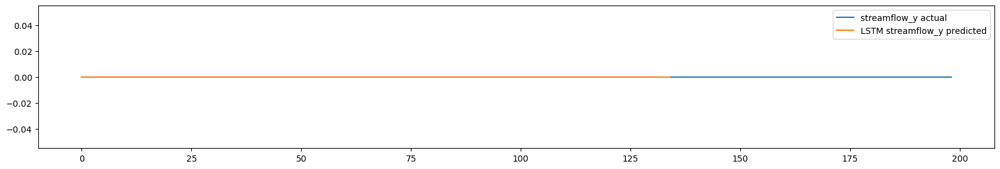

streamflow_y NSE: -14.6954


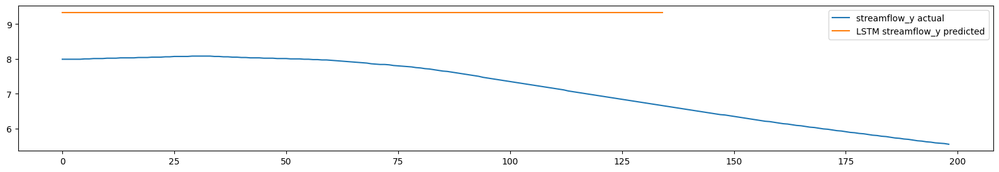

streamflow_y NSE: -2.3883


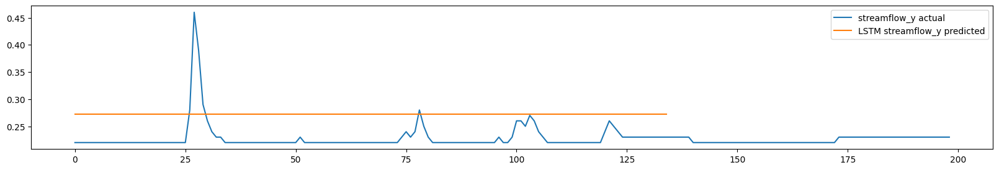

streamflow_y NSE: -13.2703


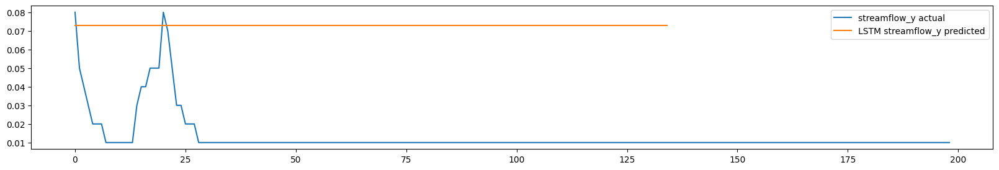

streamflow_y NSE: -25.2194


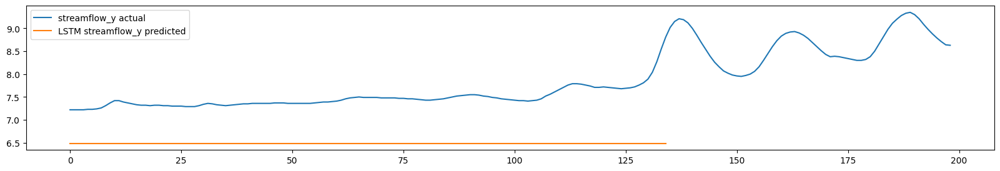

streamflow_y NSE: -inf


/tmp/ipykernel_3407511/2629290555.py:27: RuntimeWarning: divide by zero encountered in scalar divide
  nse_values[var] = np.round(1 - (pred_variance / obs_variance), 4)


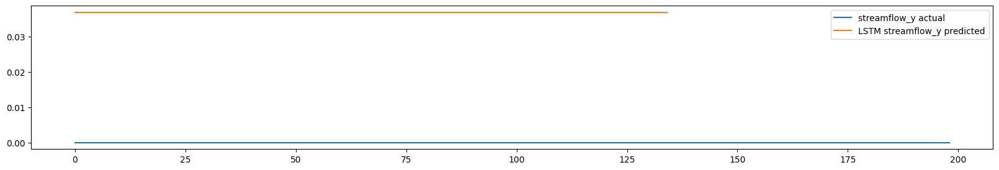

streamflow_y NSE: nan


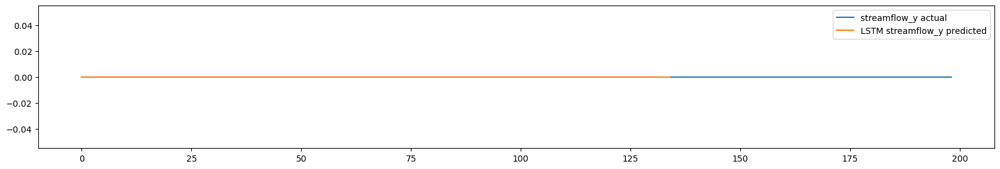

streamflow_y NSE: 0.75


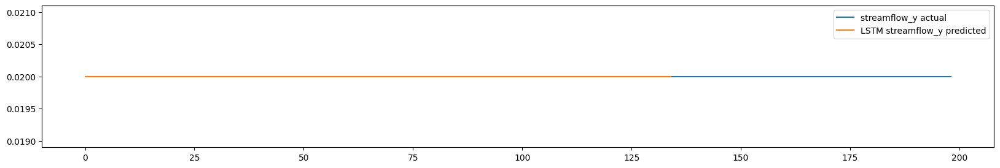

streamflow_y NSE: -0.064


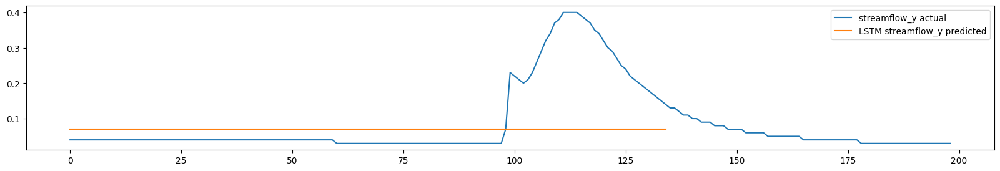

streamflow_y NSE: -21.251


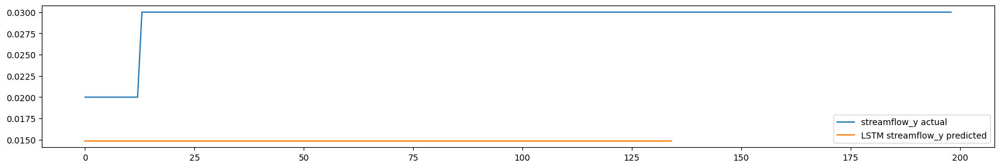

streamflow_y NSE: nan


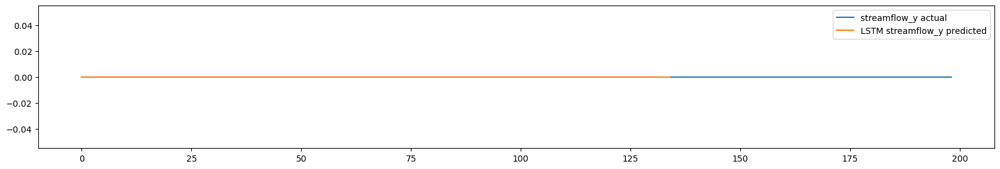

streamflow_y NSE: -inf


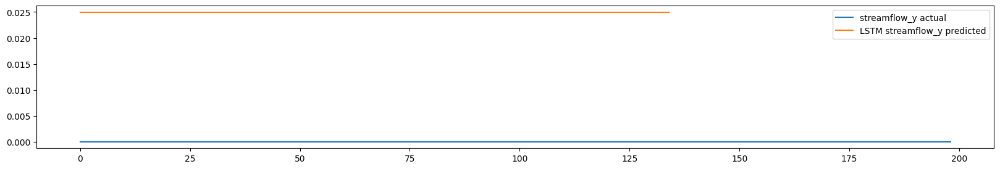

streamflow_y NSE: -4.0988


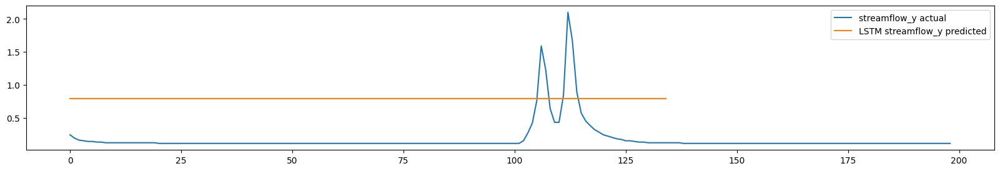

streamflow_y NSE: -0.3445


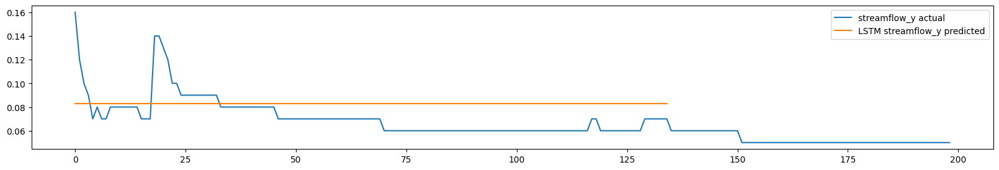

streamflow_y NSE: 1.0


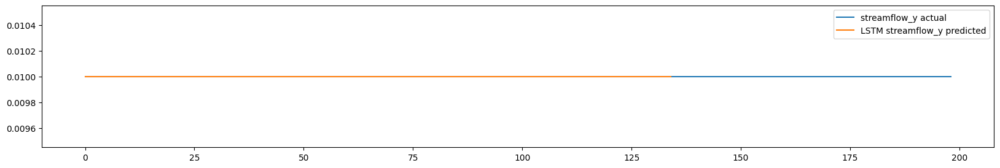

streamflow_y NSE: -12.8501


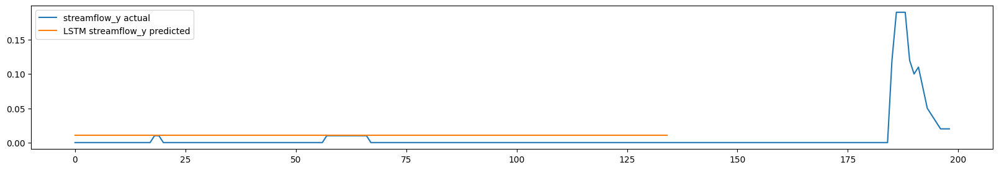

streamflow_y NSE: -2.2635


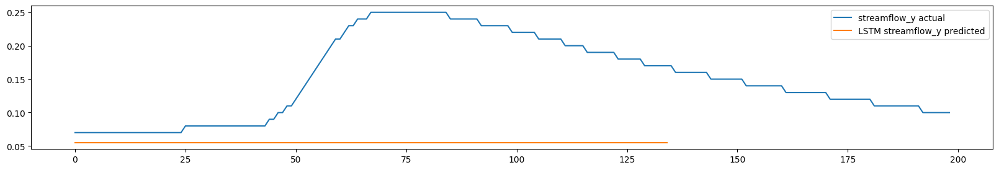

streamflow_y NSE: -0.4494


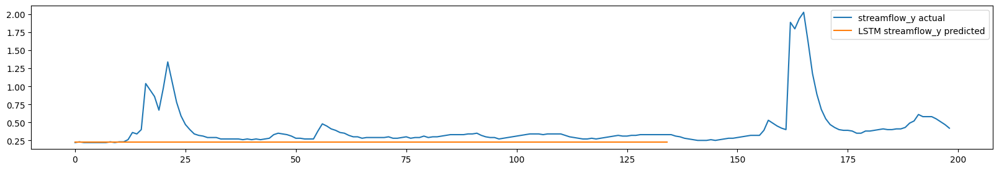

streamflow_y NSE: nan


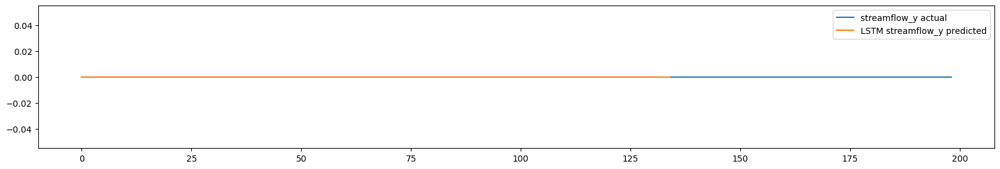

streamflow_y NSE: nan


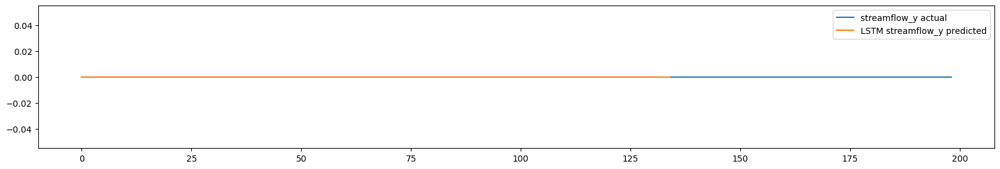

streamflow_y NSE: -0.802


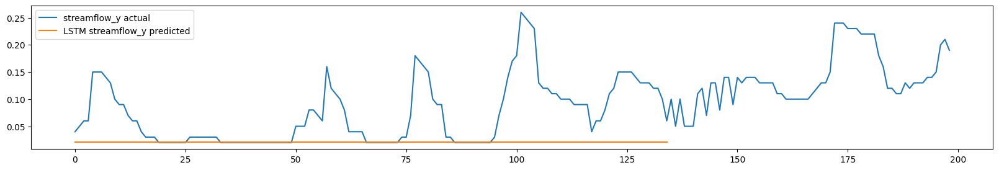

streamflow_y NSE: -0.8233


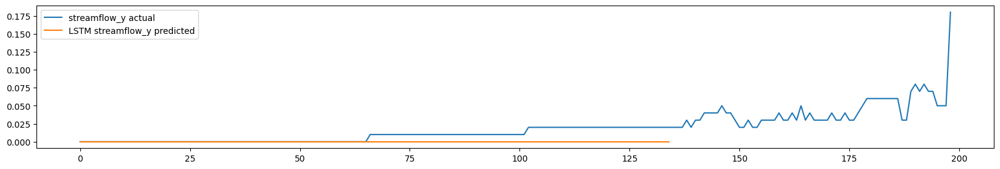

streamflow_y NSE: -0.0242


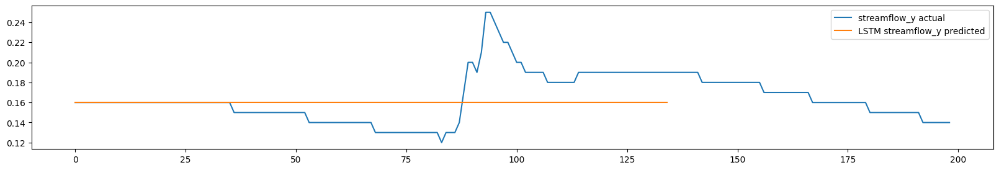

streamflow_y NSE: nan


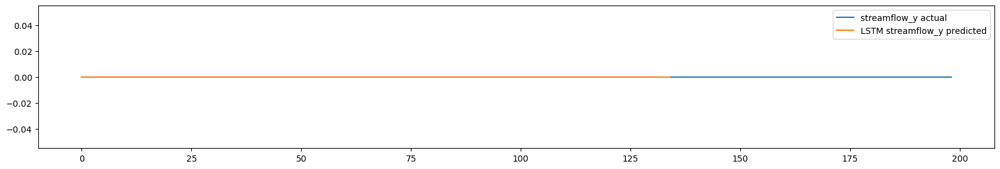

streamflow_y NSE: -0.0282


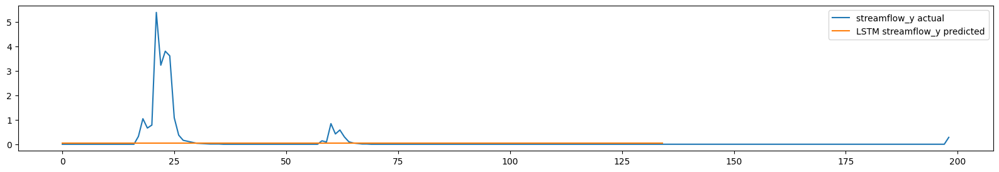

streamflow_y NSE: 1.0


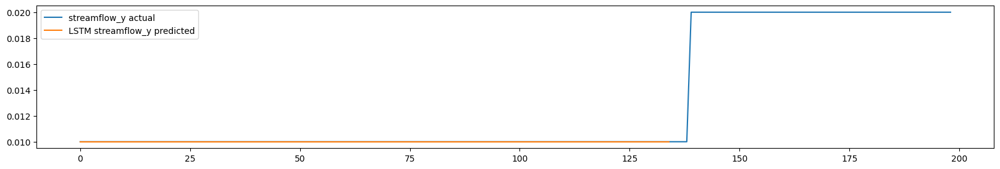

streamflow_y NSE: nan


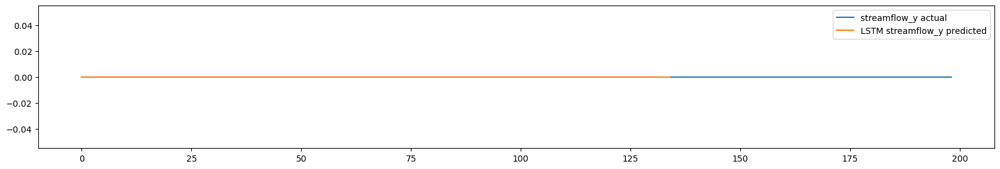

streamflow_y NSE: nan


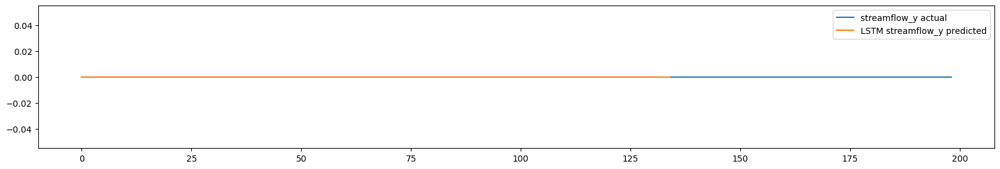

streamflow_y NSE: -0.0485


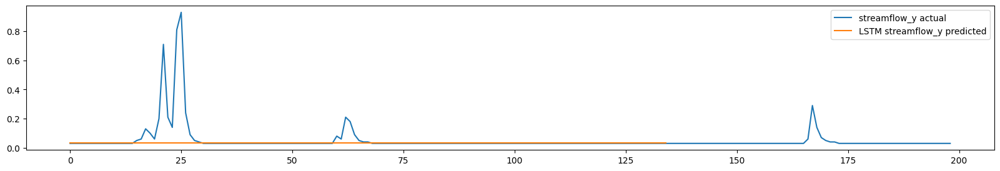

streamflow_y NSE: -2.5487


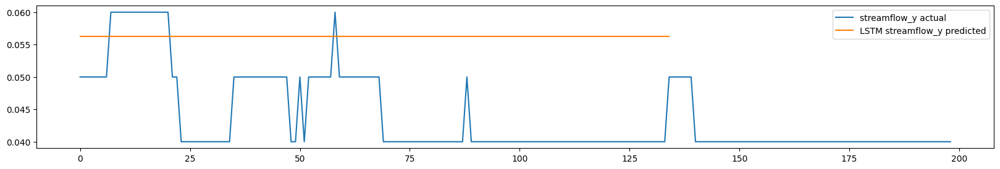

streamflow_y NSE: nan


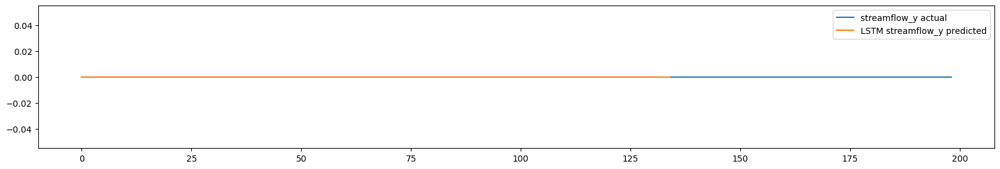

streamflow_y NSE: nan


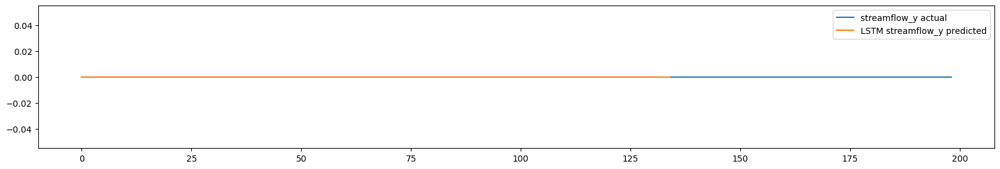

streamflow_y NSE: -inf


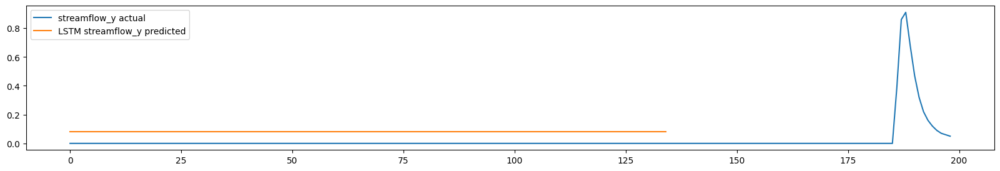

streamflow_y NSE: nan


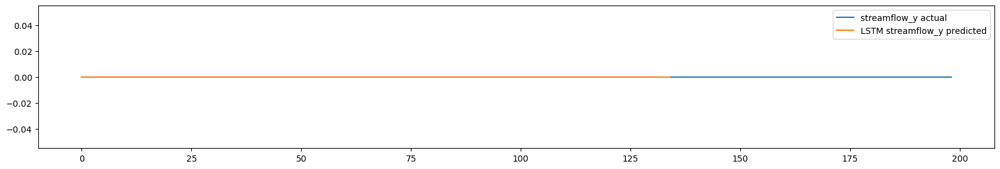

streamflow_y NSE: 1.0


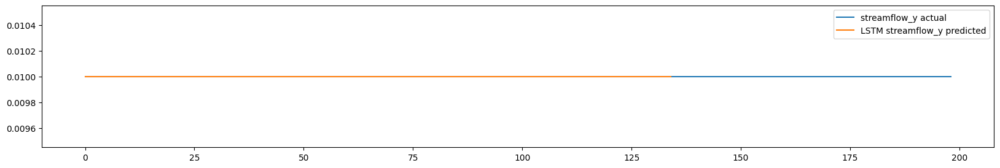

streamflow_y NSE: -0.0153


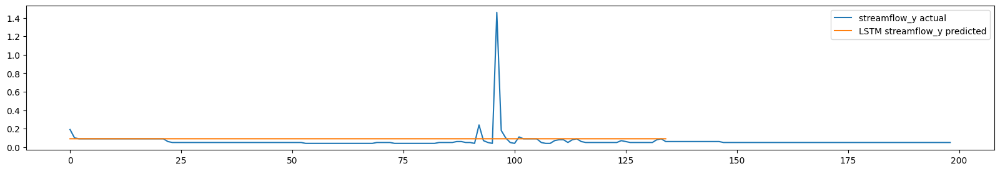

streamflow_y NSE: -inf


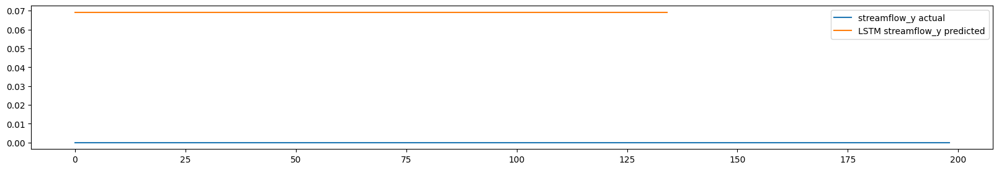

streamflow_y NSE: nan


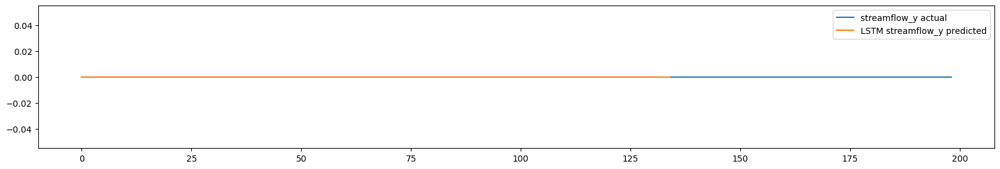

streamflow_y NSE: -3.8102


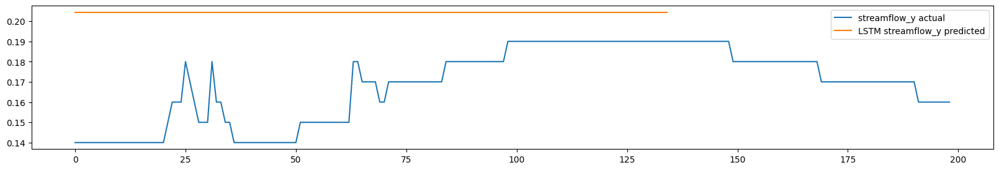

streamflow_y NSE: 0.0


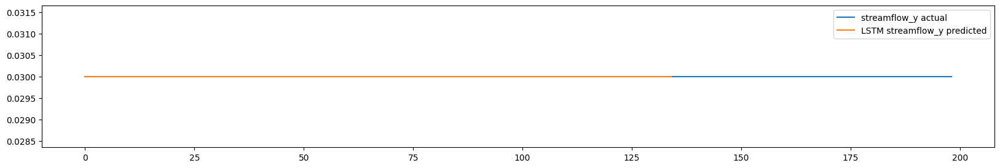

streamflow_y NSE: -0.0138


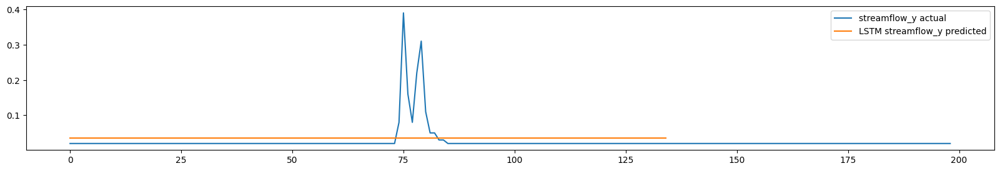

streamflow_y NSE: nan


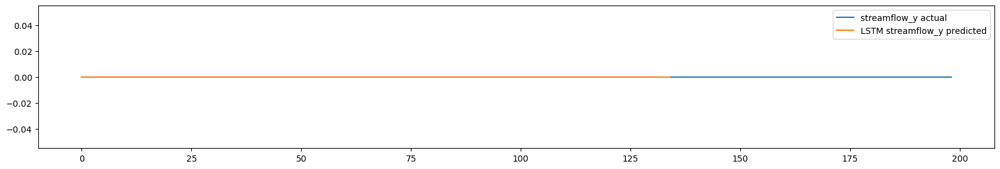

streamflow_y NSE: nan


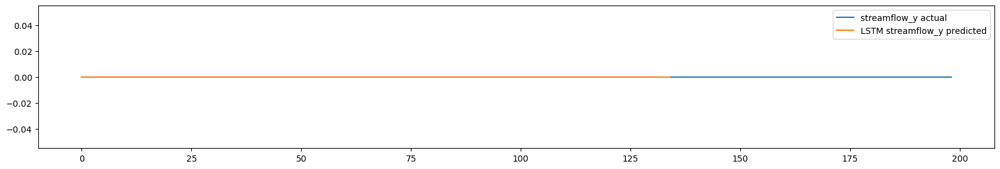

streamflow_y NSE: -0.6587


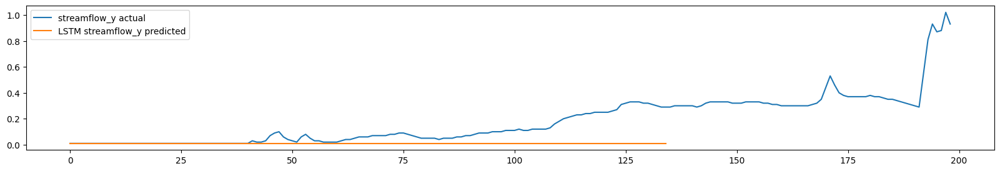

streamflow_y NSE: -4.2209


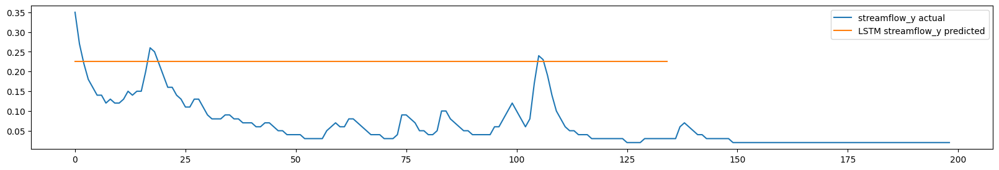

streamflow_y NSE: -2.3724


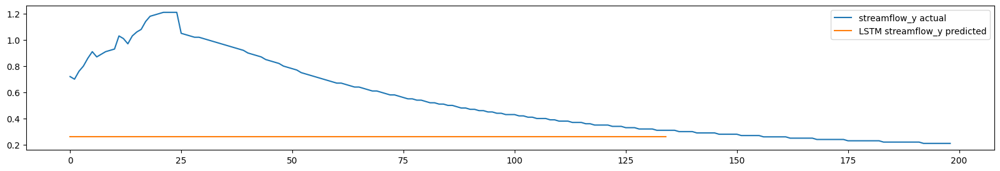

streamflow_y NSE: nan


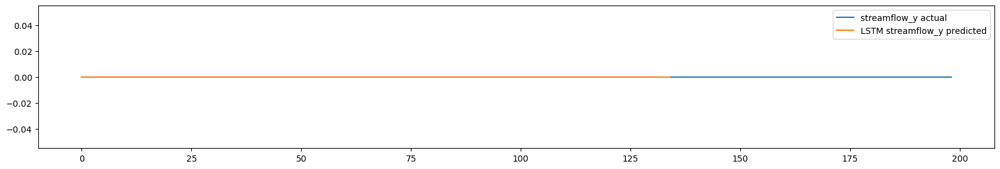

streamflow_y NSE: nan


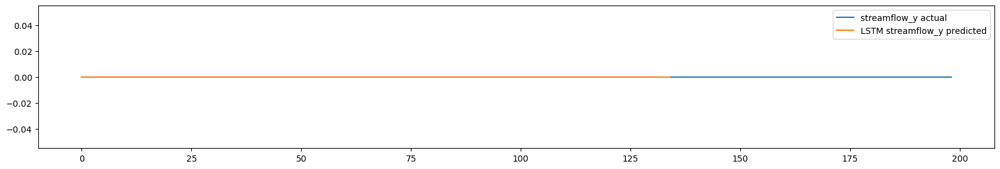

streamflow_y NSE: nan


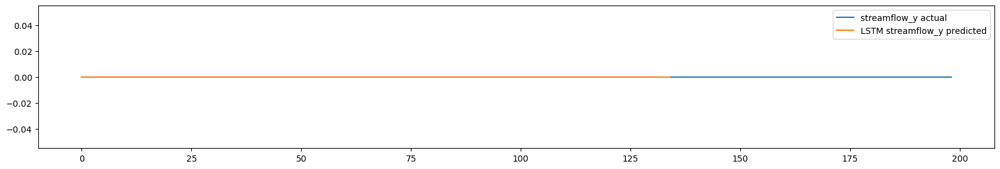

streamflow_y NSE: nan


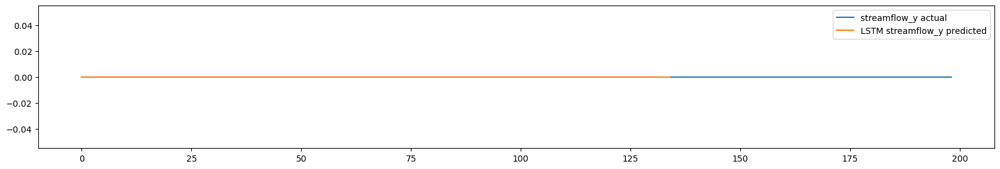

streamflow_y NSE: -42.193


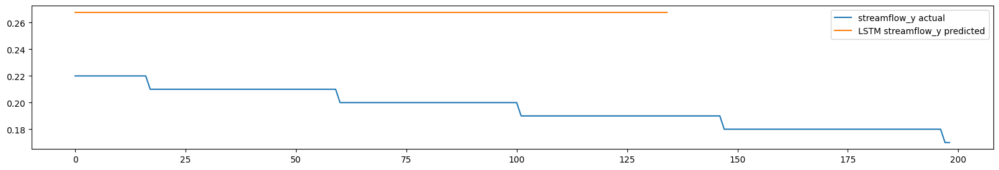

streamflow_y NSE: -3.3114549430738715e+29


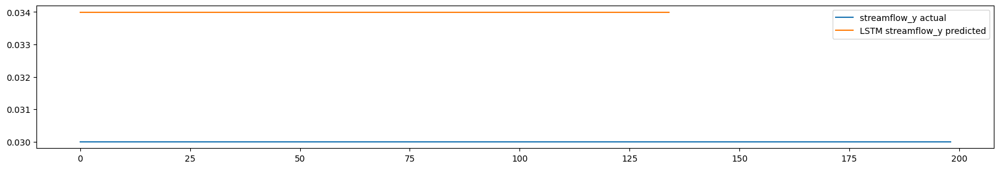

streamflow_y NSE: nan


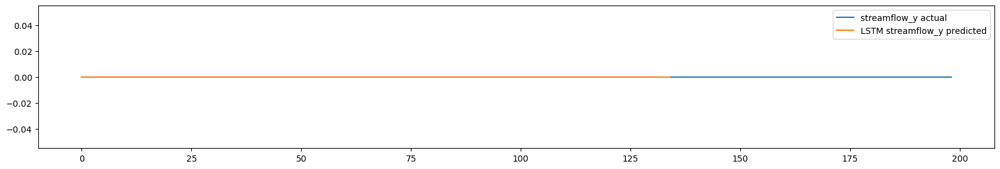

streamflow_y NSE: nan


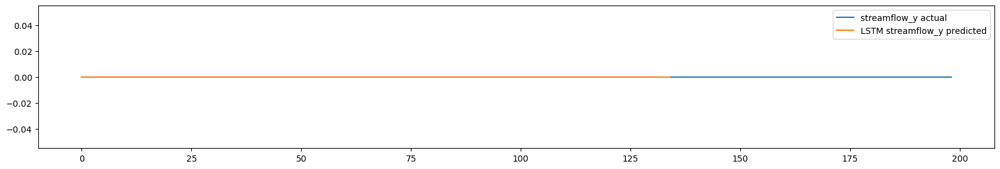

streamflow_y NSE: -232.8292


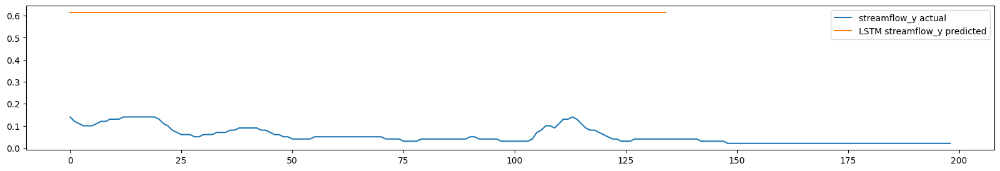

streamflow_y NSE: nan


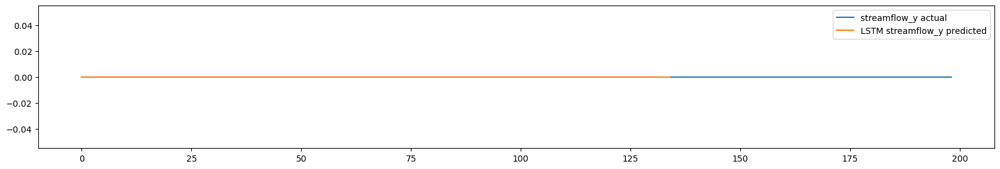

streamflow_y NSE: nan


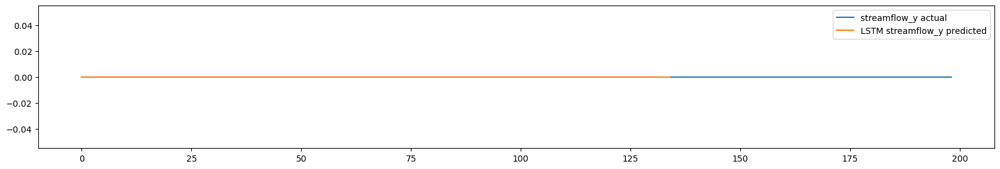

streamflow_y NSE: -71.5345


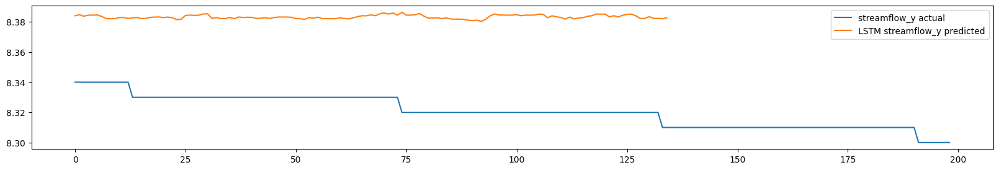

streamflow_y NSE: -1.9642


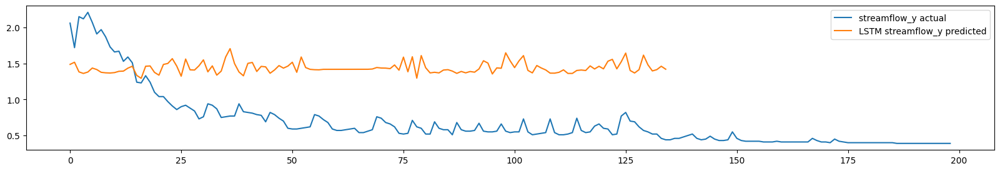

streamflow_y NSE: -378.0519


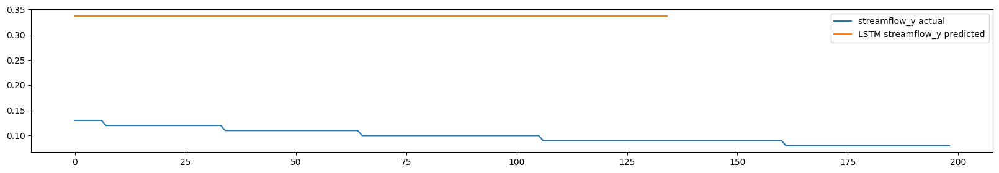

streamflow_y NSE: nan


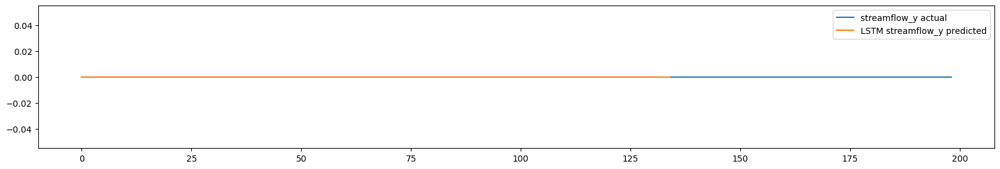

streamflow_y NSE: -2.2215


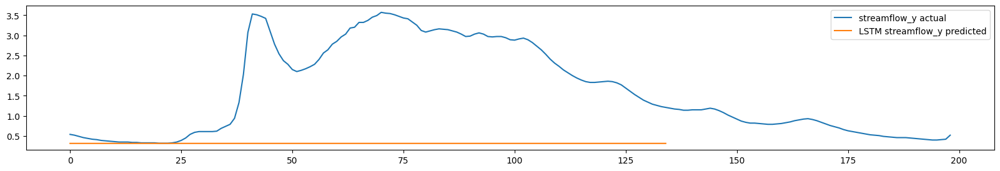

streamflow_y NSE: -0.1584


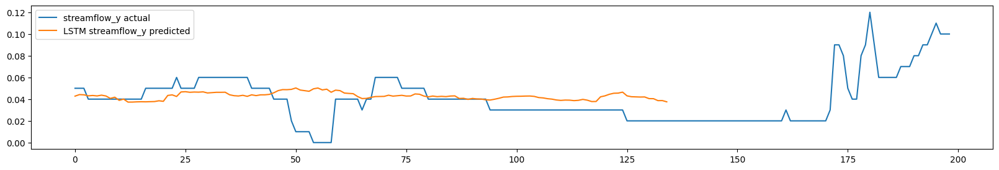

streamflow_y NSE: -2.2171414089191203e+29


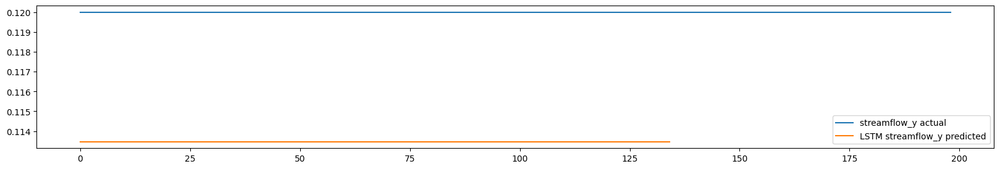

streamflow_y NSE: -0.2006


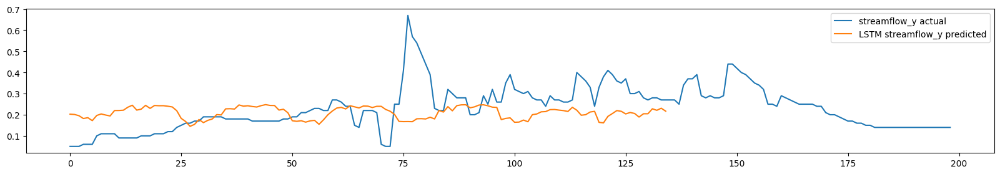

streamflow_y NSE: -0.6582


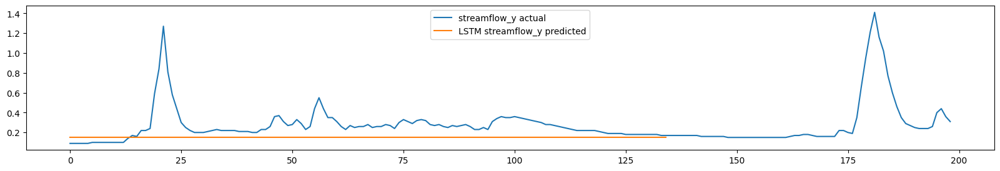

streamflow_y NSE: -0.0054


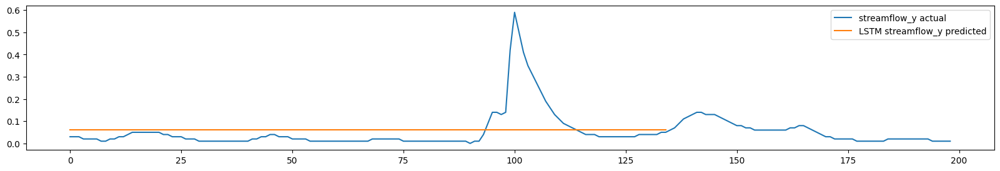

streamflow_y NSE: -5.6226


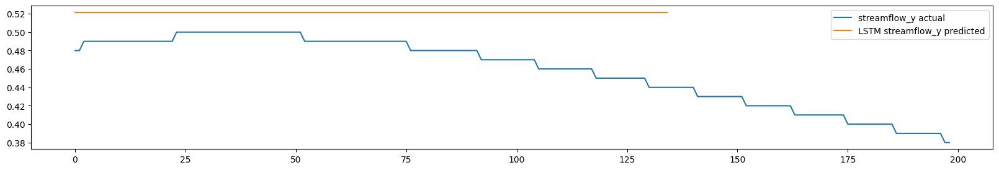

streamflow_y NSE: nan


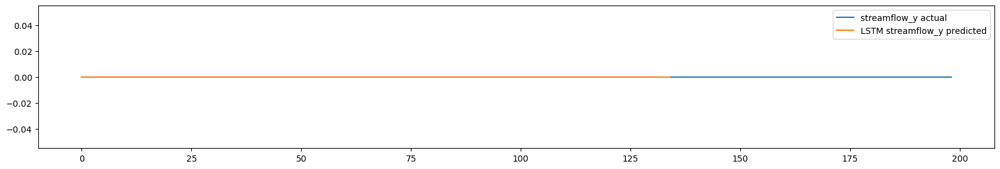

streamflow_y NSE: -0.4249


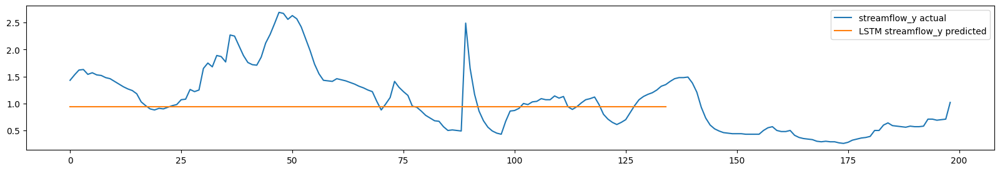

streamflow_y NSE: nan


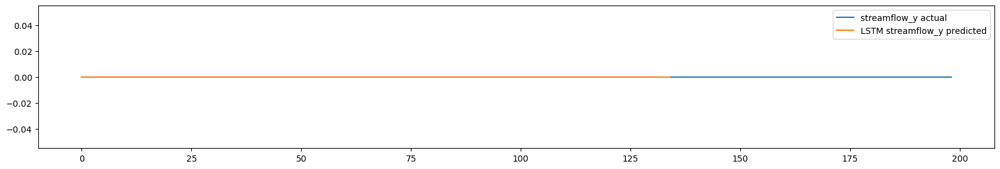

streamflow_y NSE: -inf


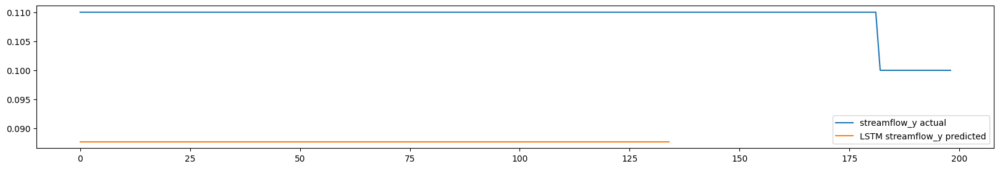

streamflow_y NSE: -490.4316


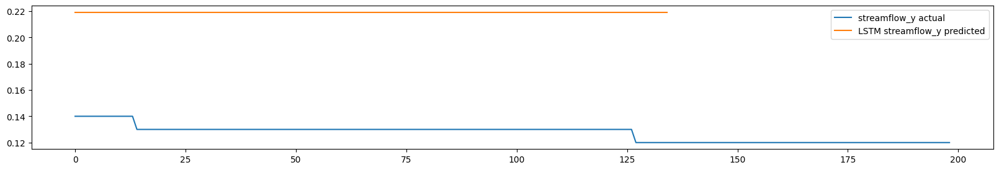

streamflow_y NSE: 1.0


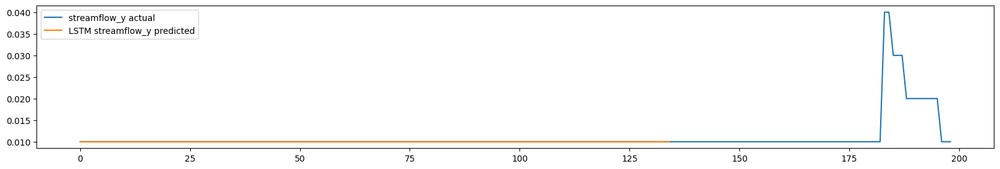

streamflow_y NSE: nan


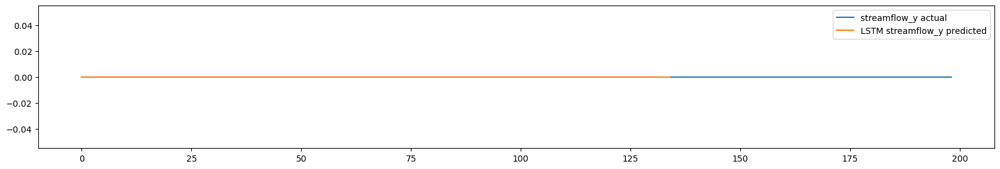

streamflow_y NSE: nan


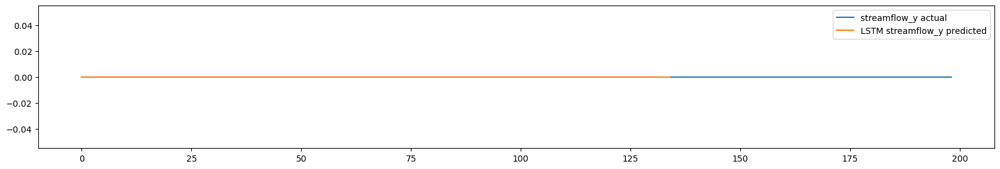

streamflow_y NSE: nan


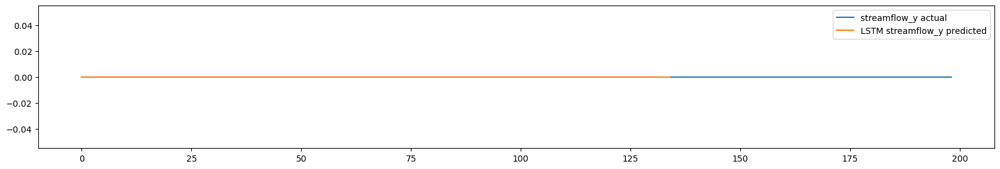

streamflow_y NSE: -0.0331


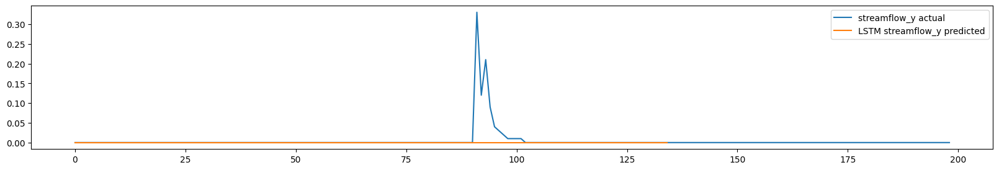

streamflow_y NSE: -inf


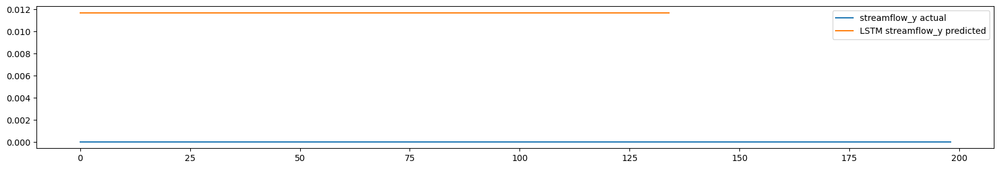

streamflow_y NSE: 0.0


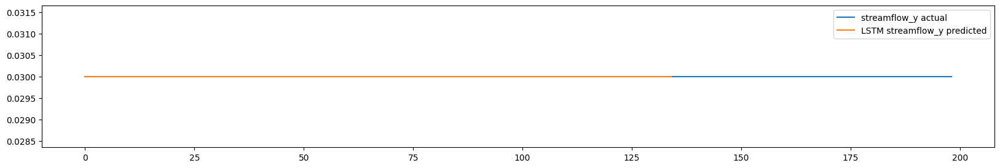

streamflow_y NSE: -0.0039


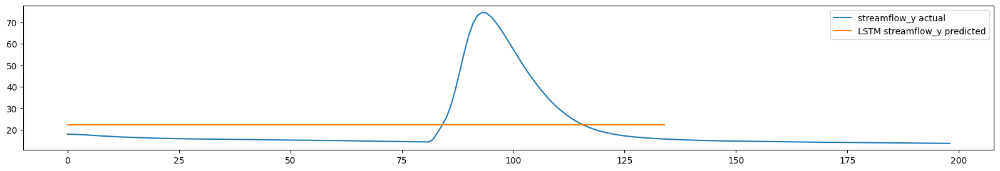

streamflow_y NSE: nan


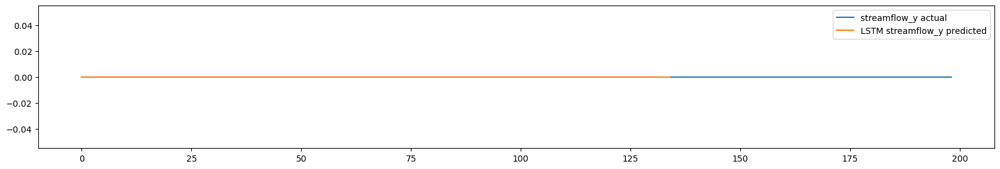

streamflow_y NSE: nan


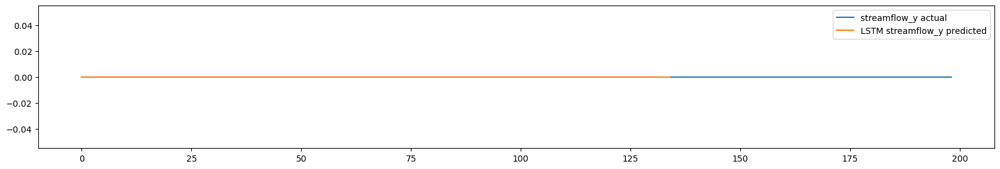

streamflow_y NSE: nan


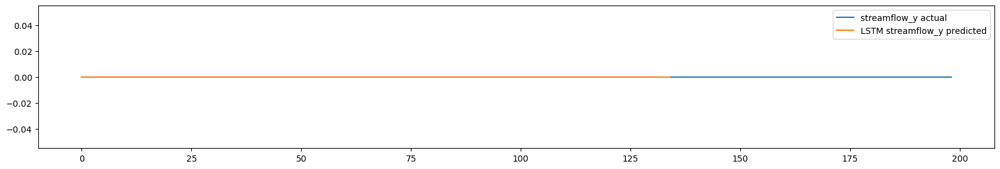

streamflow_y NSE: -0.0795


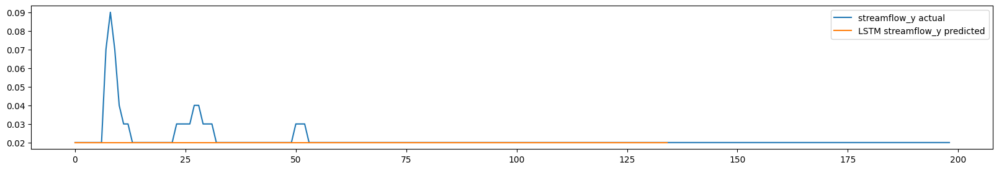

streamflow_y NSE: -0.0204


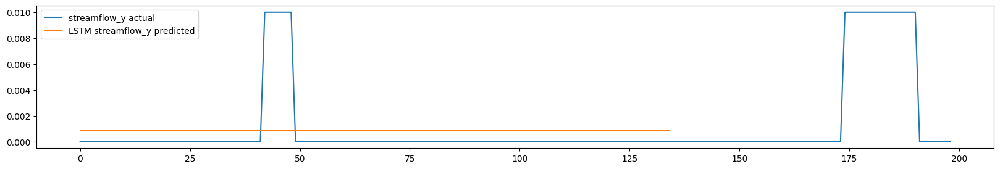

streamflow_y NSE: nan


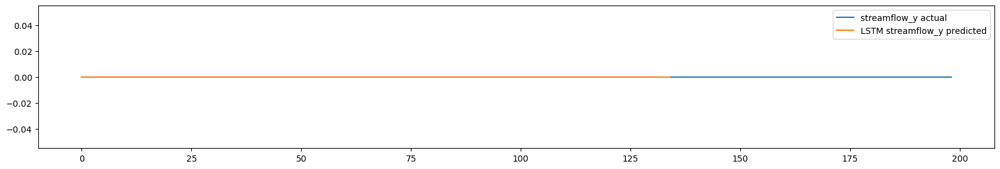

streamflow_y NSE: -587.4822


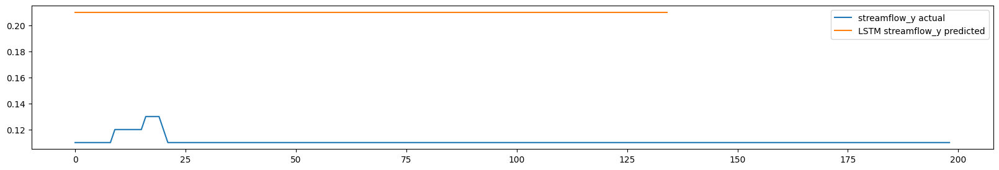

streamflow_y NSE: 0.0


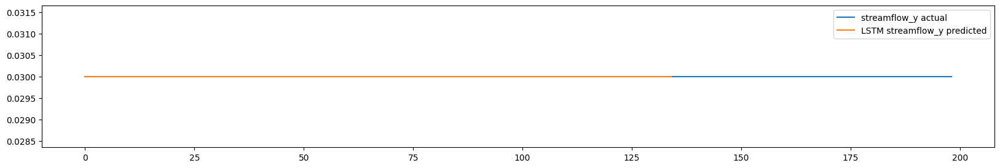

streamflow_y NSE: nan


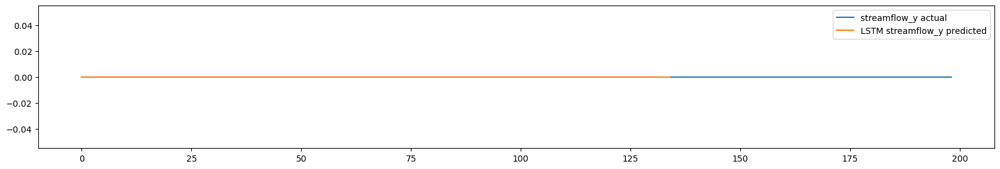

streamflow_y NSE: -1.8069


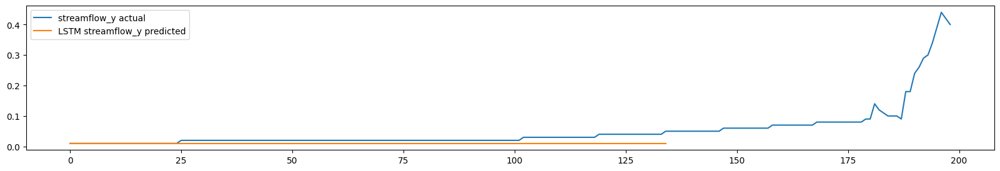

streamflow_y NSE: nan


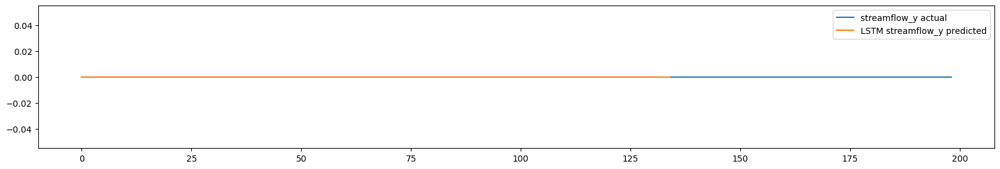

streamflow_y NSE: 0.75


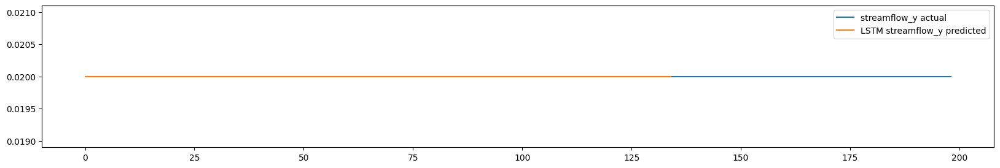

streamflow_y NSE: nan


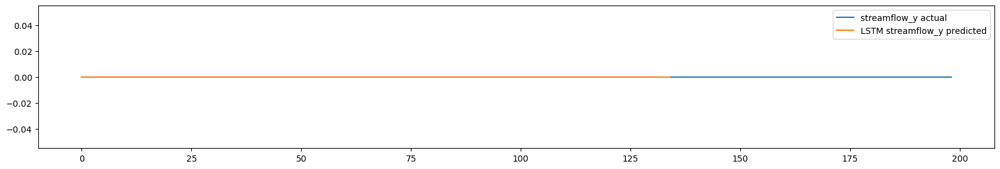

streamflow_y NSE: nan


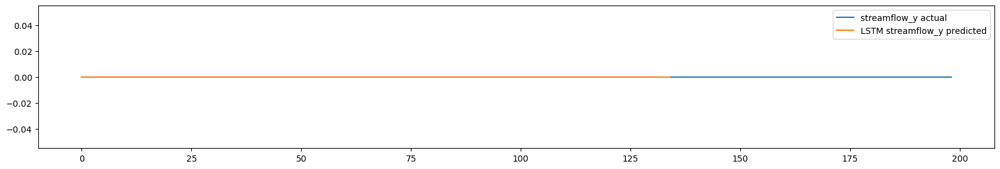

streamflow_y NSE: -4.5227


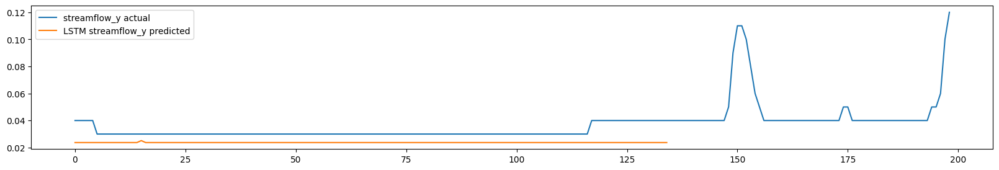

streamflow_y NSE: 0.0


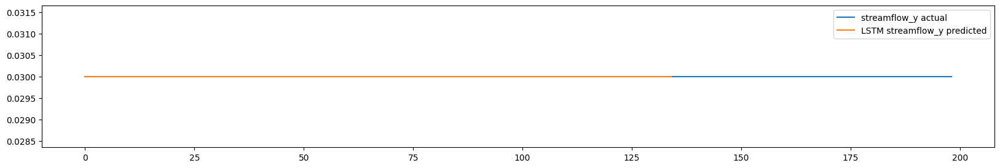

streamflow_y NSE: -0.5058


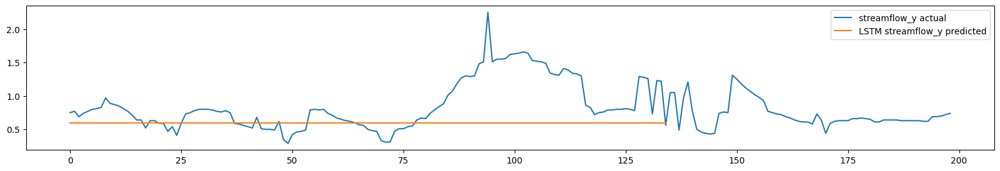

streamflow_y NSE: -318.02


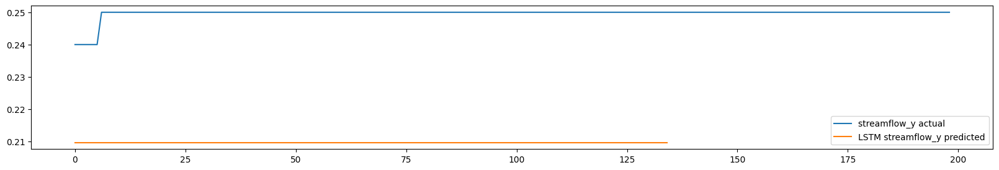

streamflow_y NSE: -inf


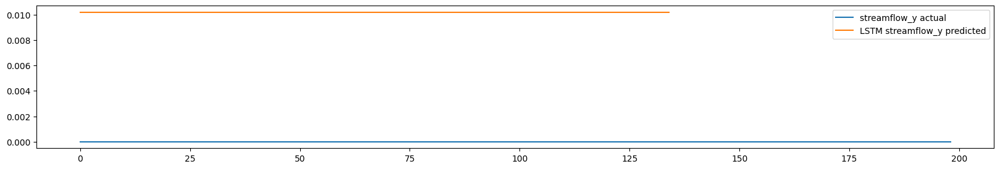

streamflow_y NSE: nan


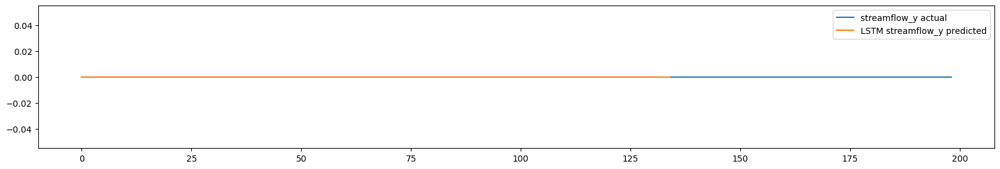

streamflow_y NSE: -0.077


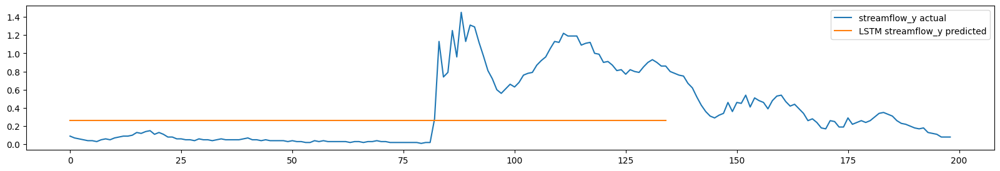

streamflow_y NSE: 1.0


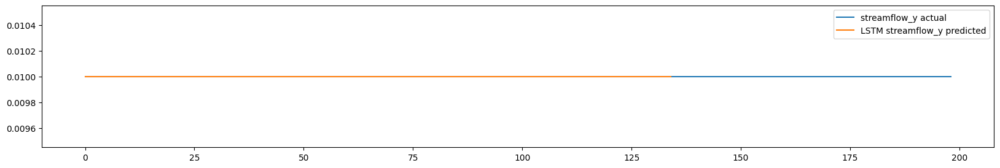

streamflow_y NSE: -36.9364


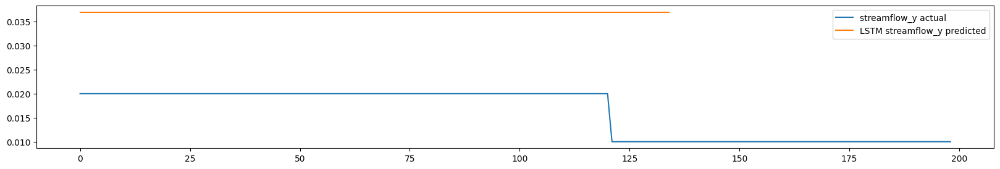

streamflow_y NSE: -0.6579


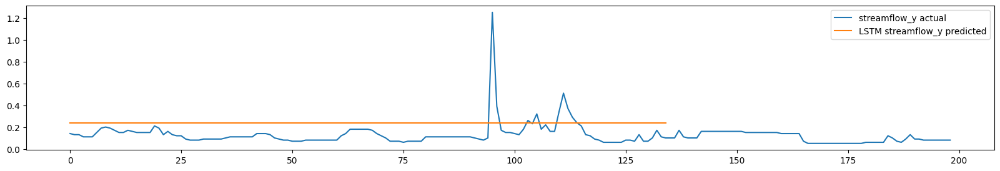

streamflow_y NSE: -88.0845


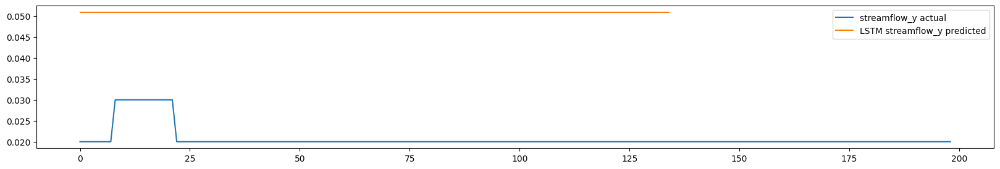

streamflow_y NSE: nan


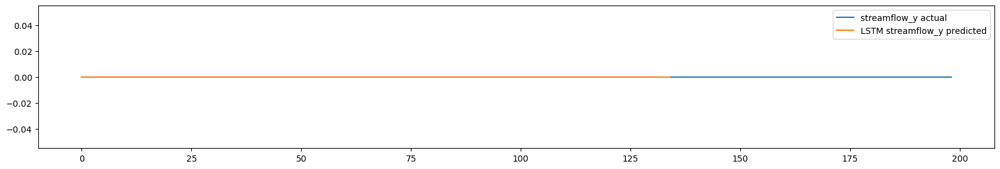

streamflow_y NSE: nan


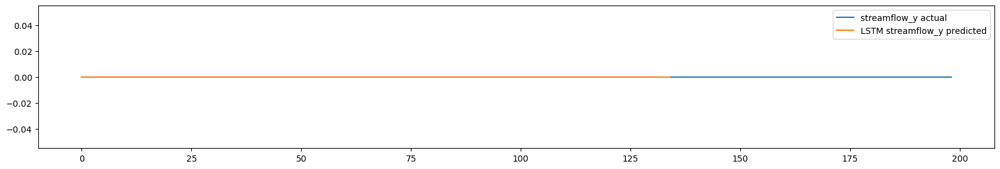

streamflow_y NSE: -0.0026


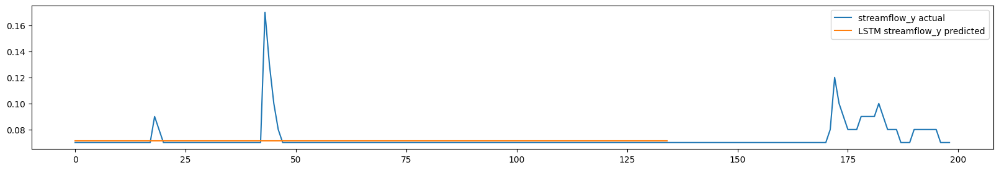

streamflow_y NSE: -1.700977000851555e+30


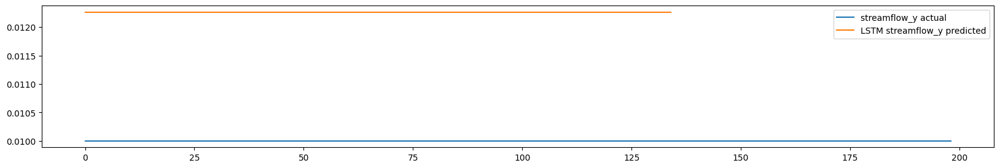

streamflow_y NSE: nan


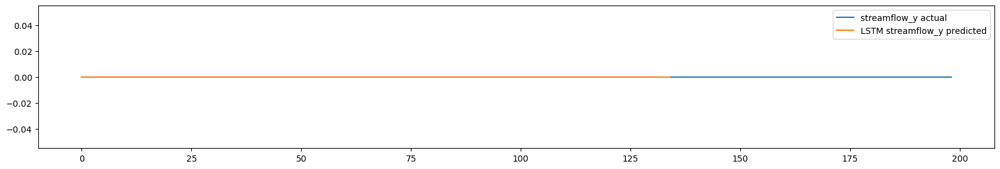

streamflow_y NSE: -2.6278723019563e+30


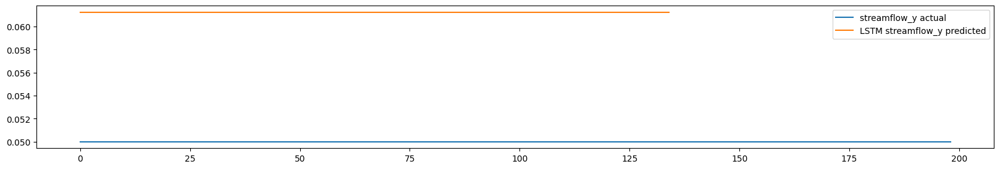

streamflow_y NSE: -0.6326


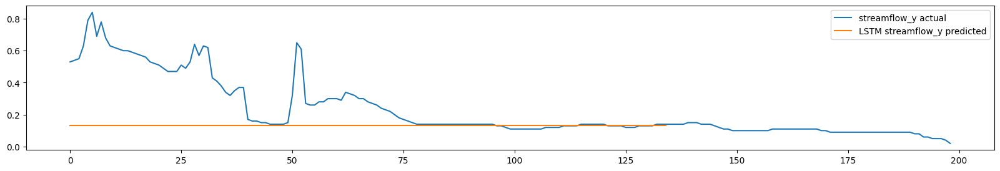

streamflow_y NSE: -1.452


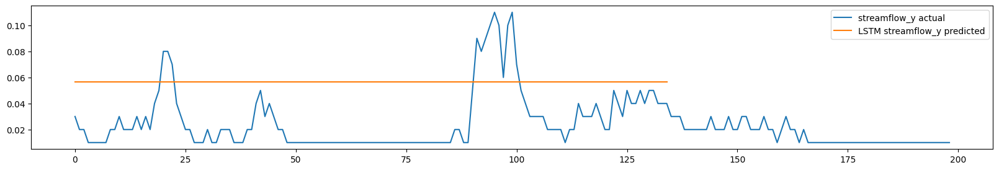

streamflow_y NSE: -0.1


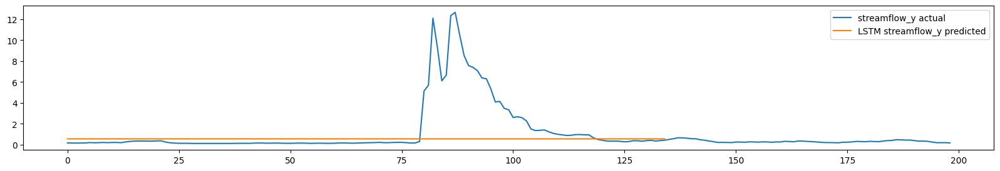

streamflow_y NSE: -inf


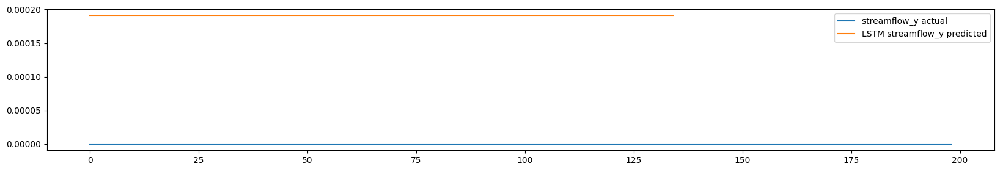

streamflow_y NSE: nan


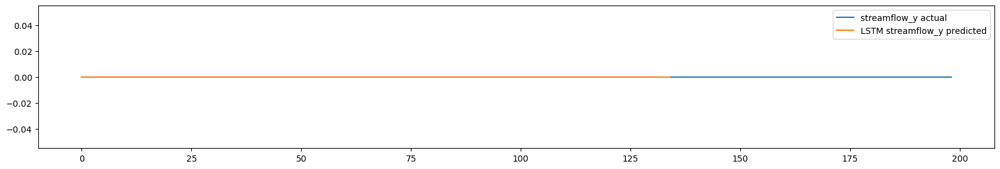

streamflow_y NSE: nan


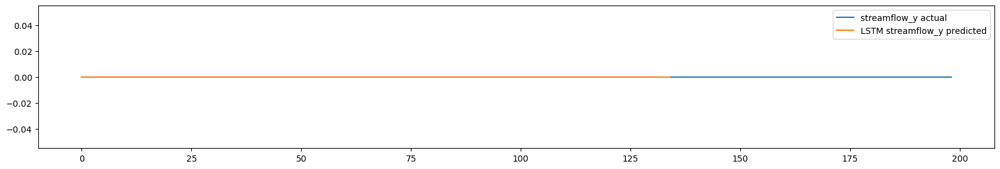

streamflow_y NSE: nan


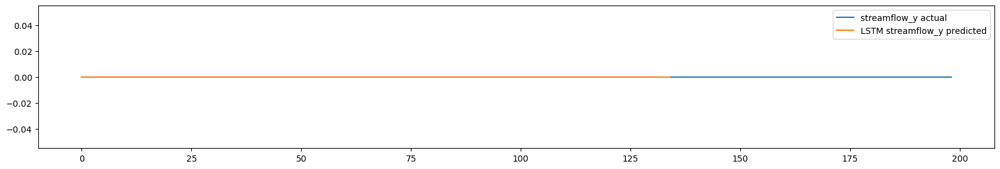

streamflow_y NSE: -4.07606065447623e+28


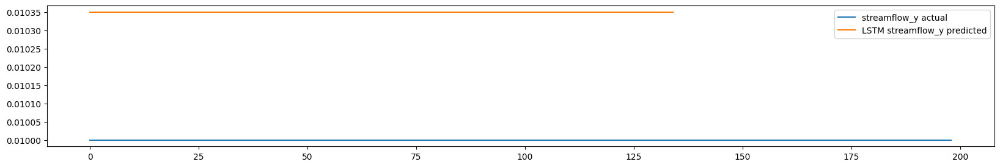

streamflow_y NSE: nan


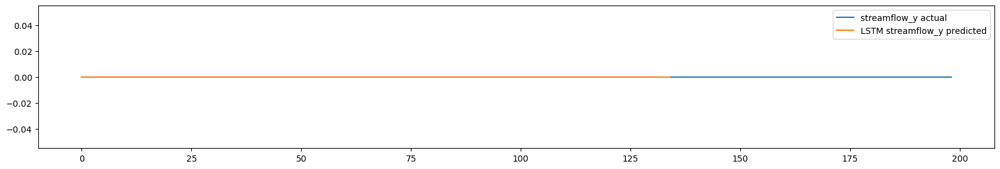

streamflow_y NSE: nan


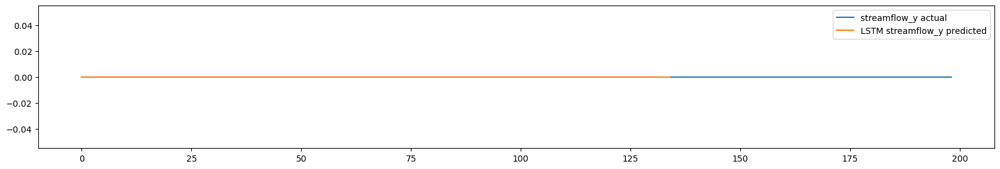

streamflow_y NSE: nan


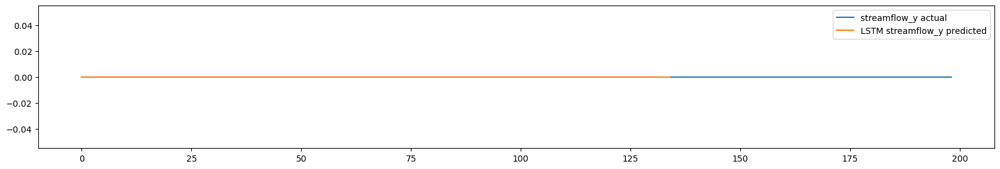

streamflow_y NSE: -0.015


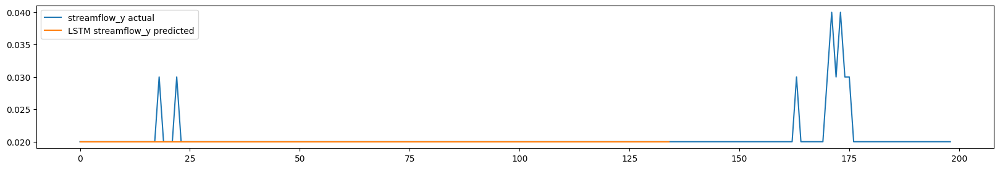

streamflow_y NSE: nan


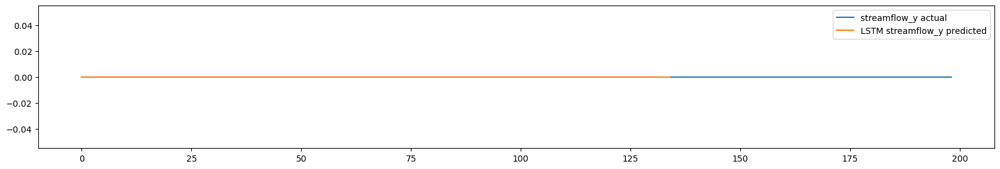

streamflow_y NSE: -0.587


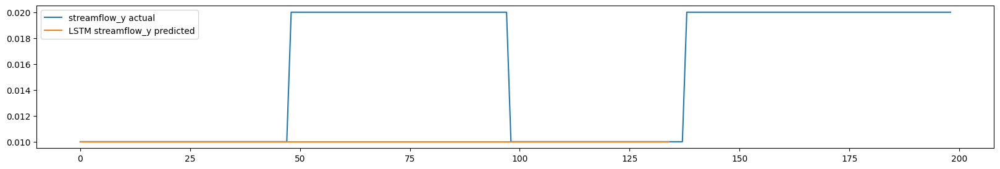

streamflow_y NSE: -2.2002289867444145e+29


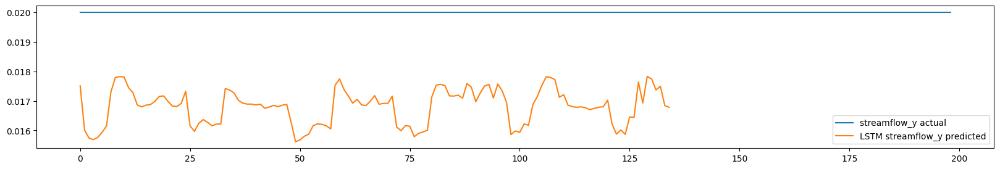

streamflow_y NSE: -0.0587


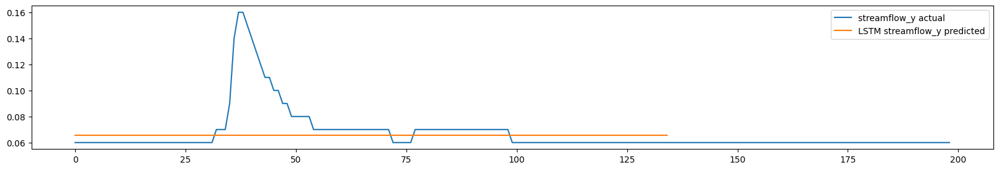

streamflow_y NSE: -0.0848


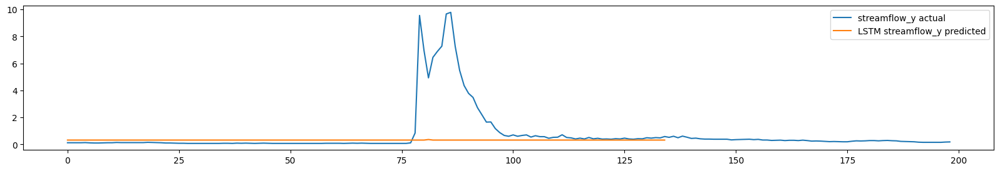

streamflow_y NSE: -0.0871


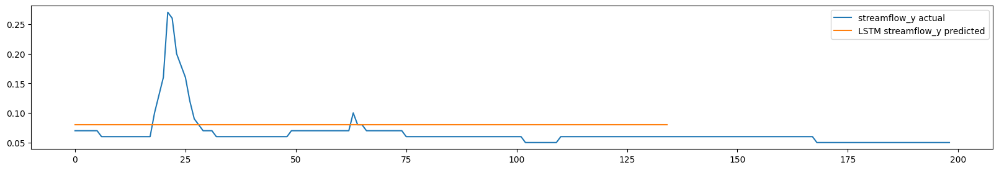

streamflow_y NSE: nan


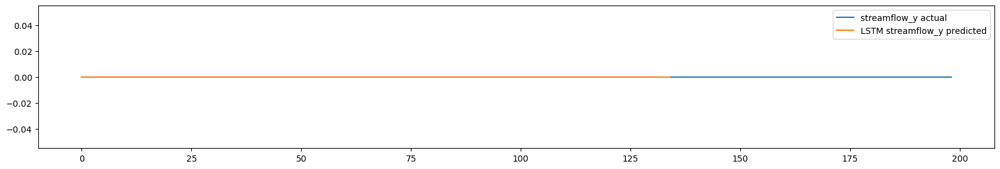

streamflow_y NSE: -0.9948


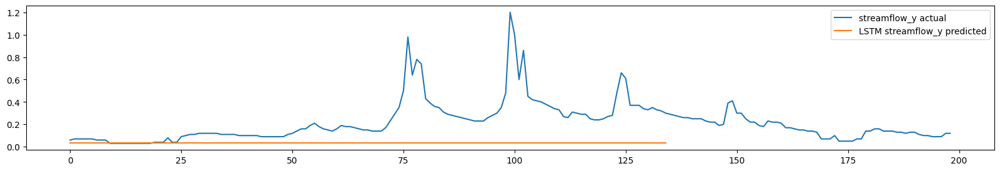

streamflow_y NSE: nan


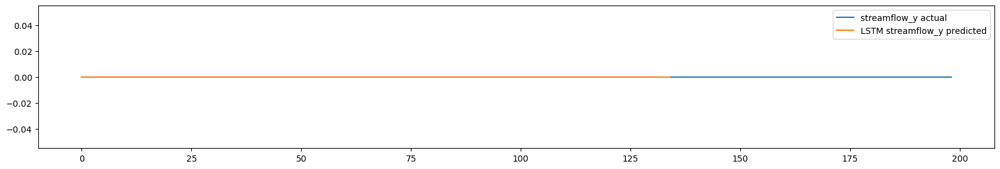

streamflow_y NSE: -46.4839


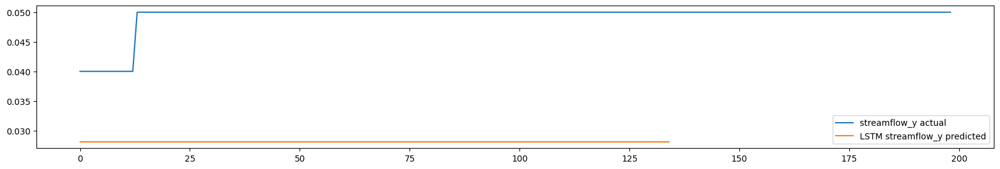

streamflow_y NSE: 0.75


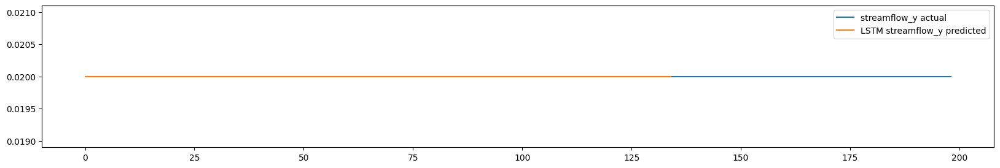

streamflow_y NSE: -1.6225620140048884e+32


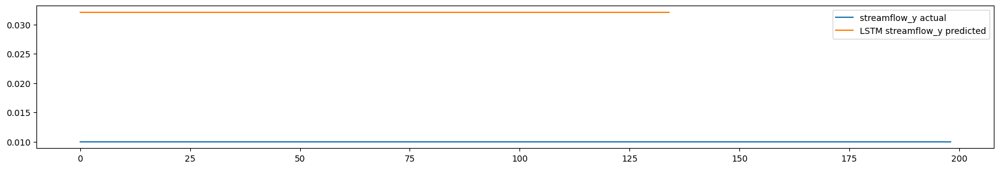

streamflow_y NSE: nan


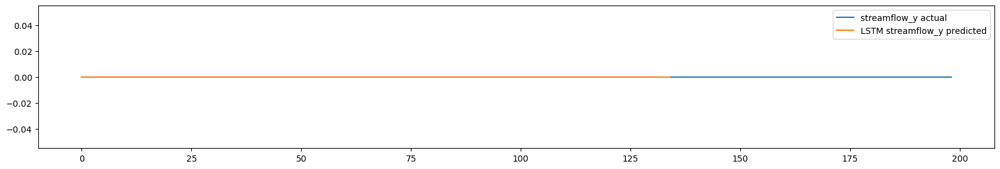

streamflow_y NSE: nan


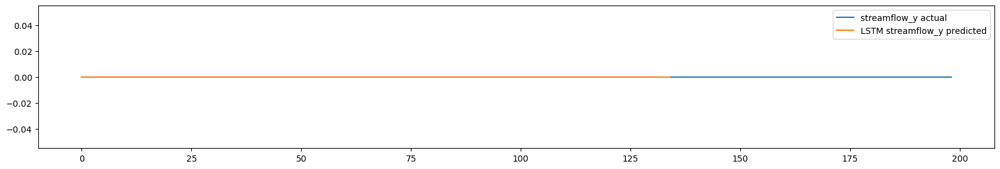

streamflow_y NSE: nan


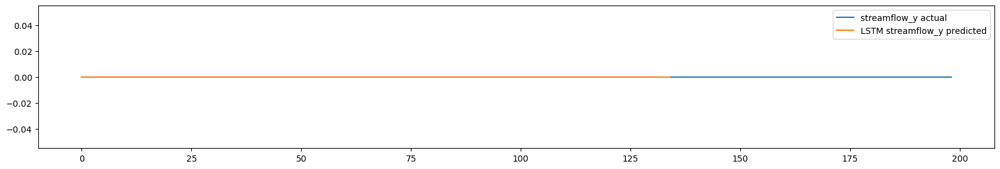

streamflow_y NSE: -3.778614683515931e+30


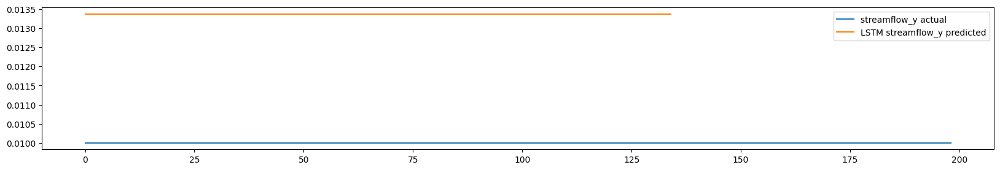

streamflow_y NSE: -1.8943


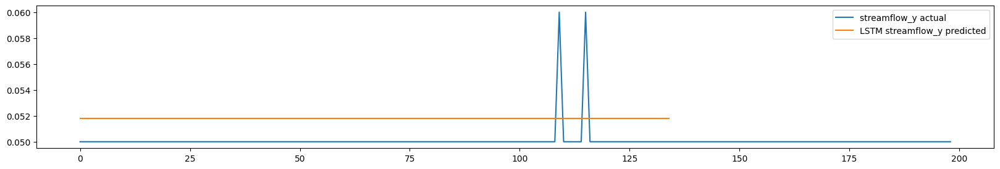

streamflow_y NSE: nan


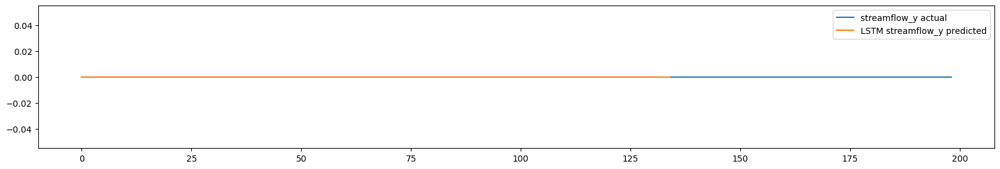

streamflow_y NSE: -1.1446657392575332e+26


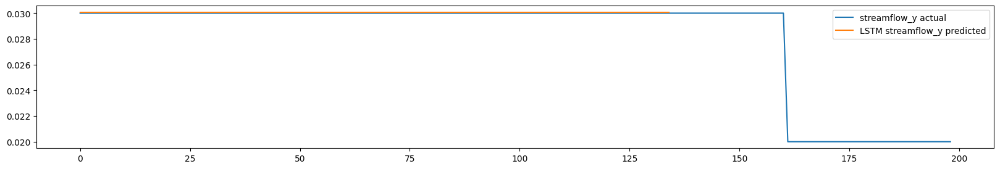

streamflow_y NSE: nan


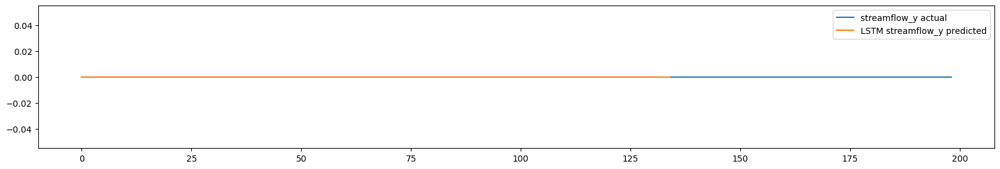

streamflow_y NSE: -1.15


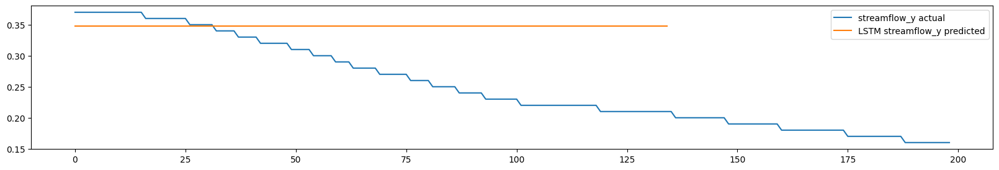

streamflow_y NSE: -1481.6923


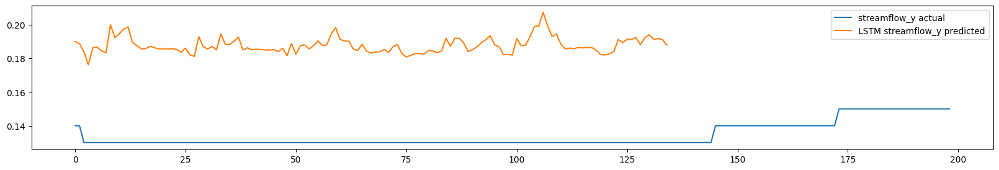

streamflow_y NSE: -8.2414


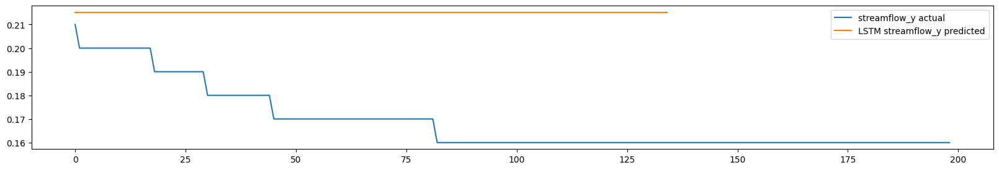

streamflow_y NSE: nan


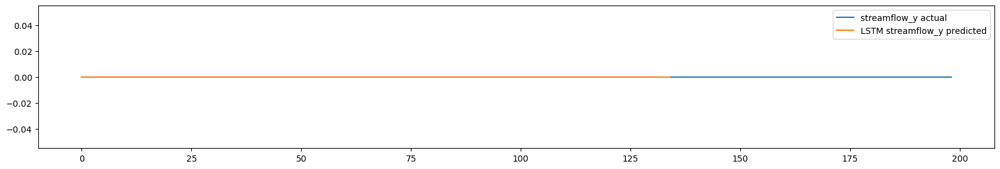

streamflow_y NSE: nan


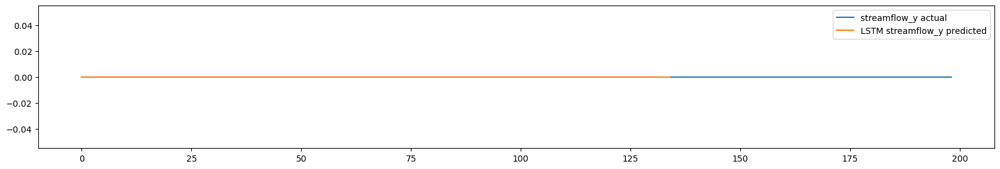

streamflow_y NSE: -1.4452415931082006e+30


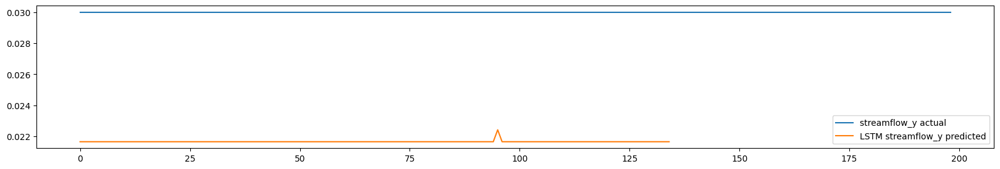

streamflow_y NSE: -7822.9249


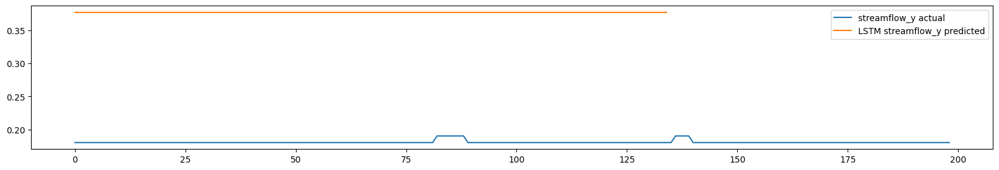

streamflow_y NSE: -518.6299


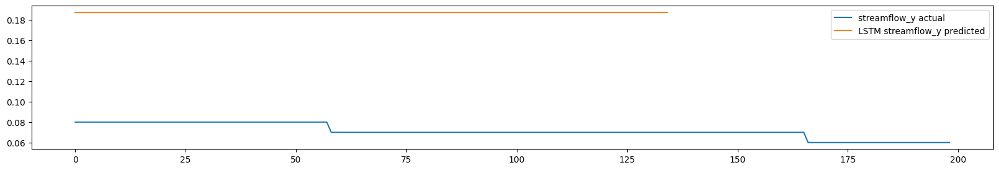

streamflow_y NSE: -0.1592


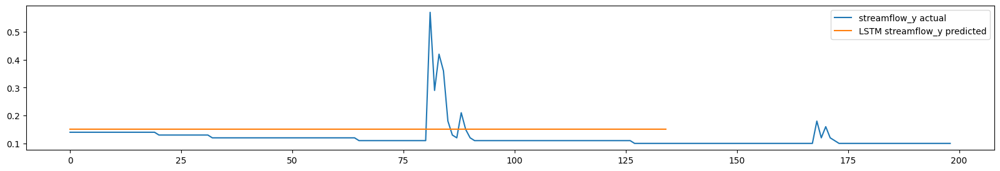

streamflow_y NSE: -5.0909


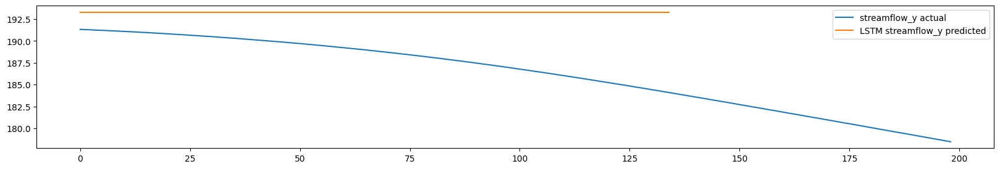

streamflow_y NSE: -11.8575


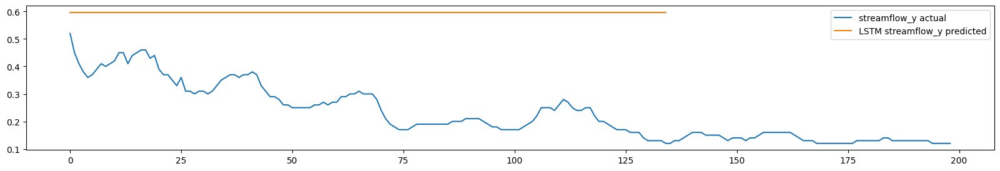

streamflow_y NSE: -inf


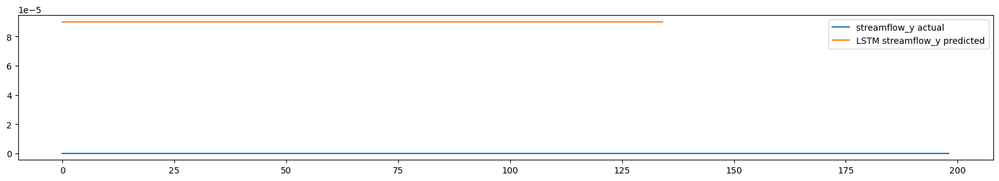

streamflow_y NSE: -inf


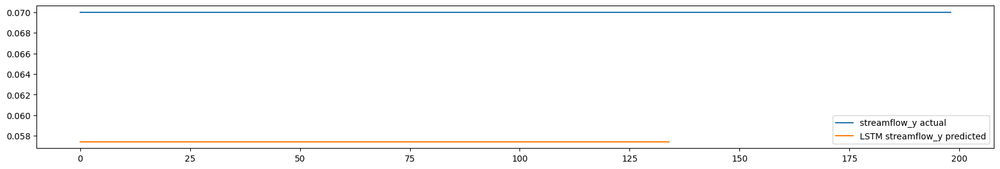

streamflow_y NSE: -0.7909


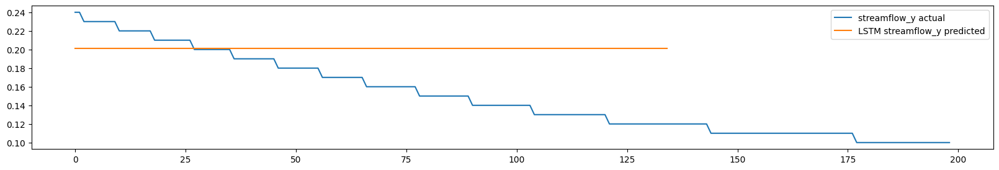

streamflow_y NSE: -0.026


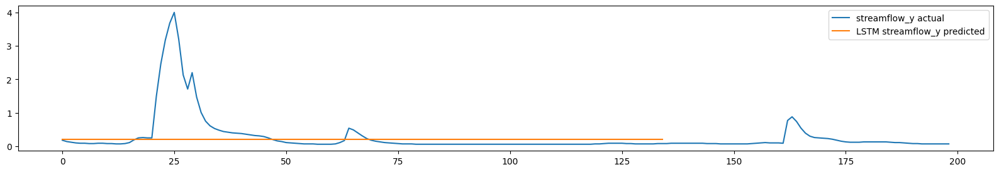

streamflow_y NSE: -55.5631


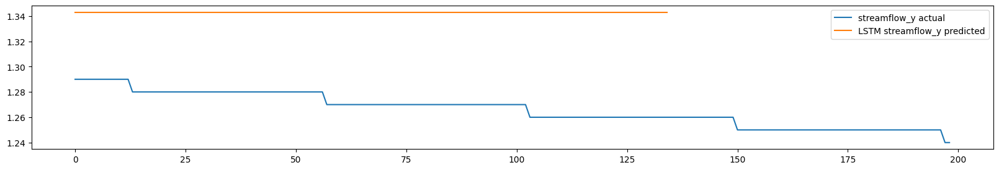

streamflow_y NSE: -inf


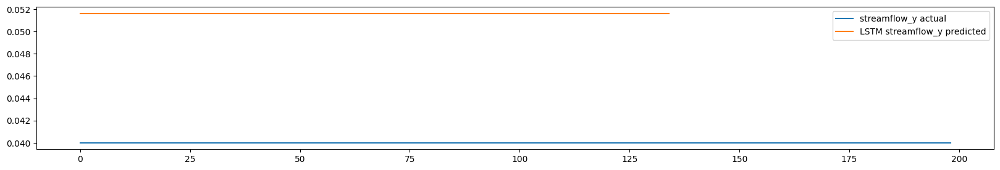

streamflow_y NSE: -0.0201


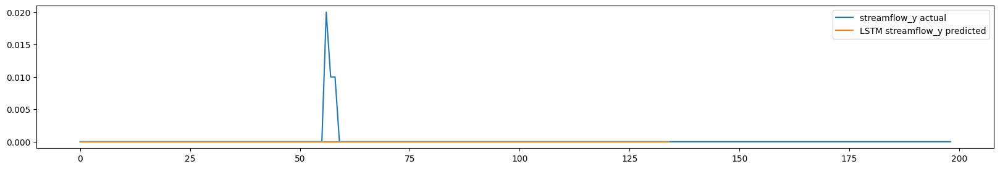

streamflow_y NSE: nan


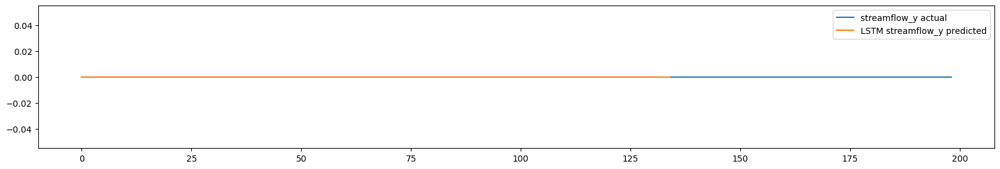

streamflow_y NSE: nan


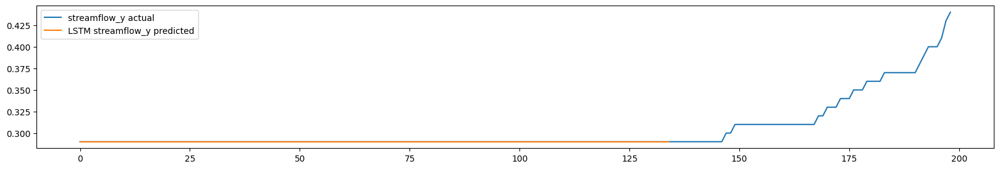

streamflow_y NSE: -0.0012


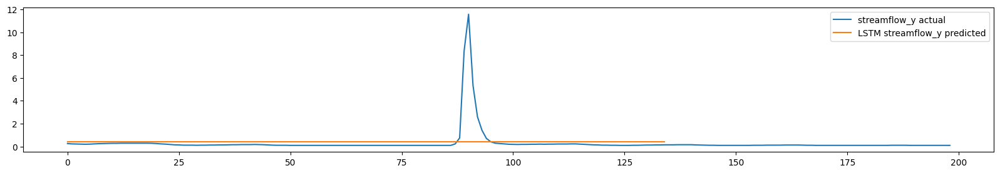

streamflow_y NSE: nan


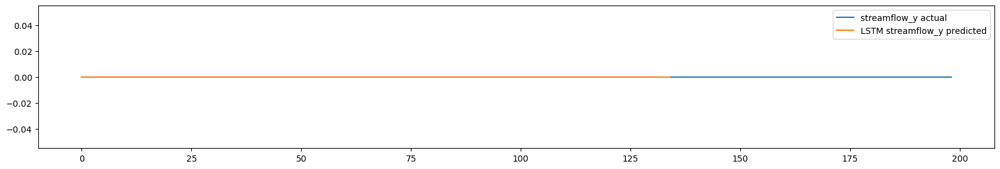

streamflow_y NSE: -1.6099


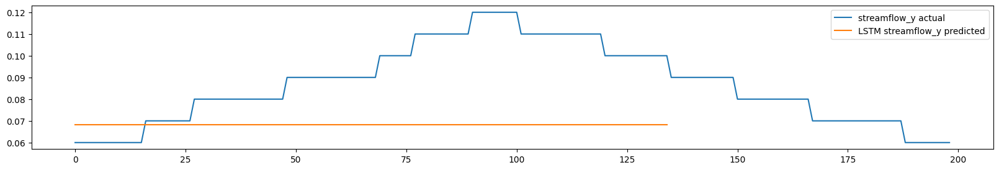

streamflow_y NSE: -5.866682943072269e+30


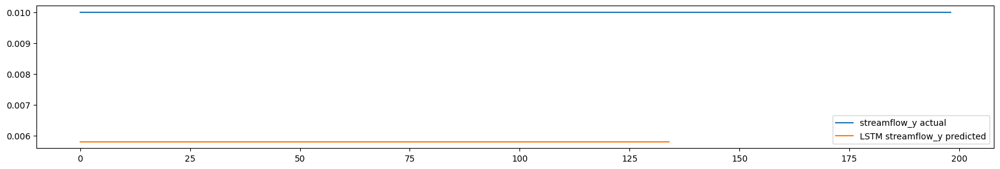

streamflow_y NSE: 0.75


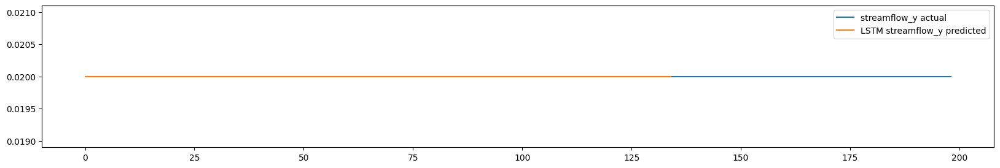

streamflow_y NSE: -1.6423


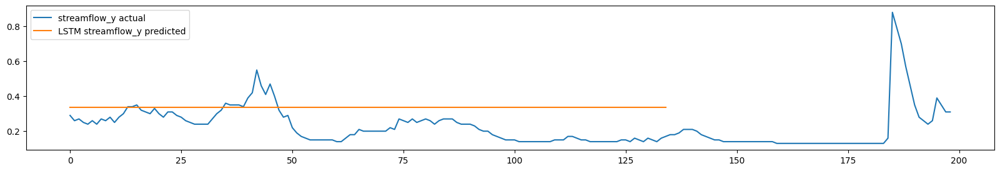

streamflow_y NSE: nan


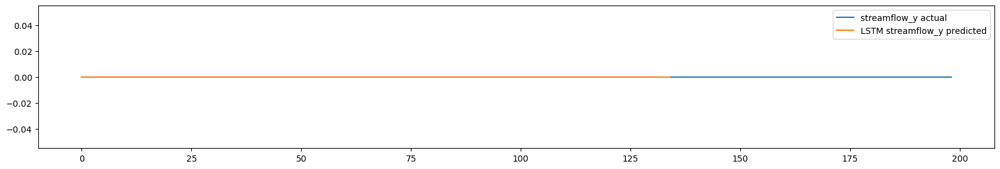

streamflow_y NSE: -76.2143


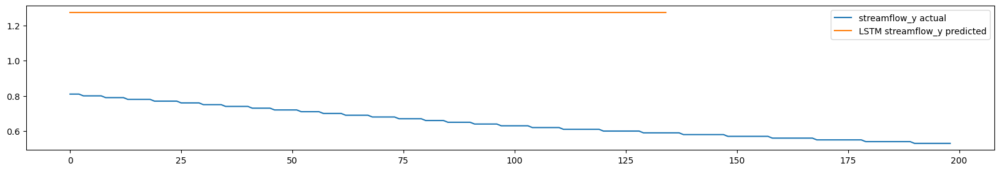

streamflow_y NSE: -5.6676991692115215e+29


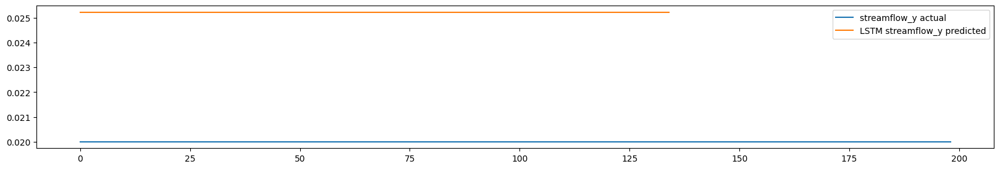

streamflow_y NSE: nan


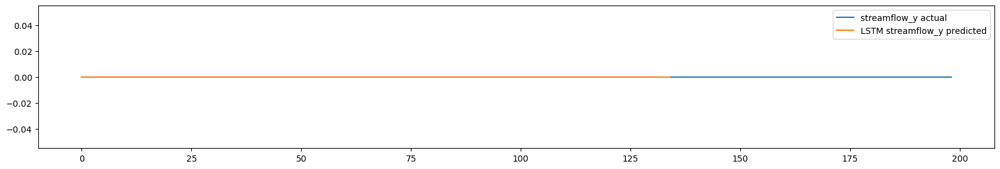

streamflow_y NSE: 0.0


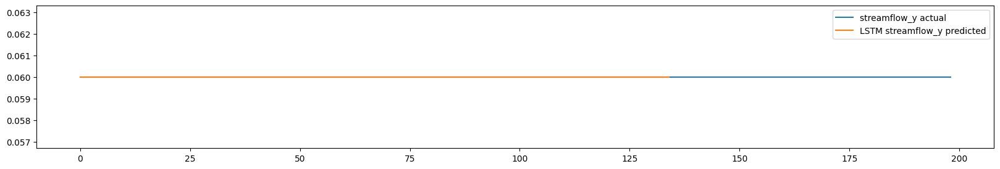

streamflow_y NSE: nan


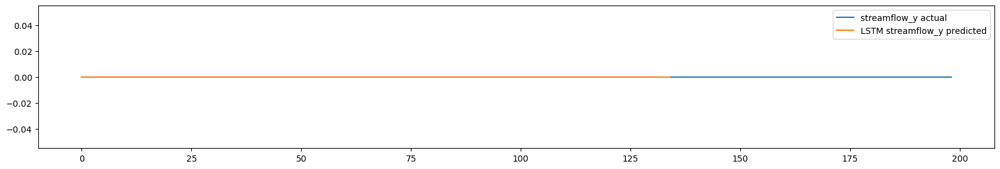

streamflow_y NSE: -1.2998457906497958e+29


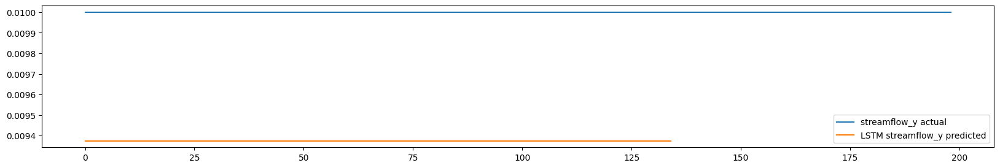

streamflow_y NSE: -0.0724


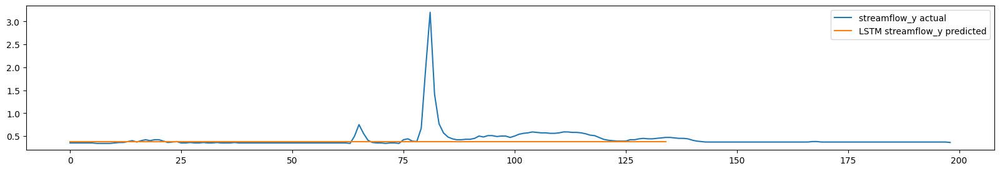

streamflow_y NSE: nan


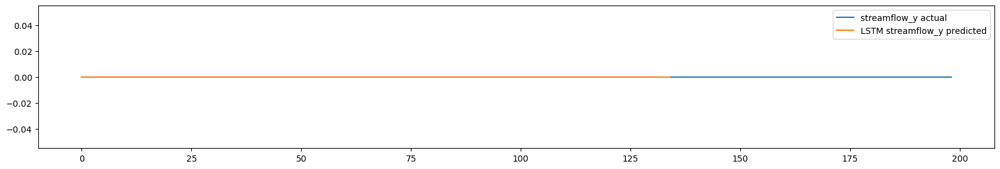

streamflow_y NSE: nan


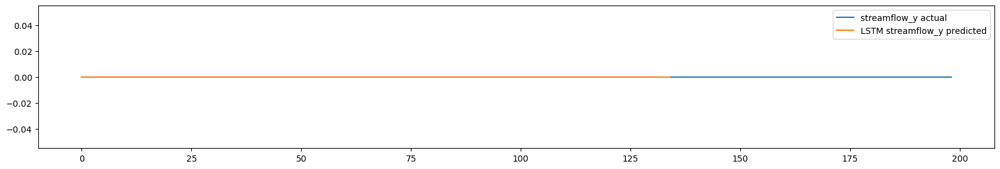

streamflow_y NSE: nan


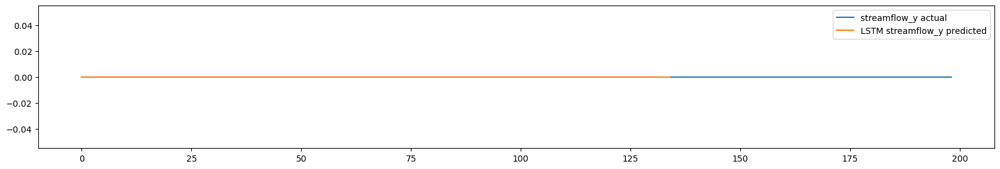

streamflow_y NSE: nan


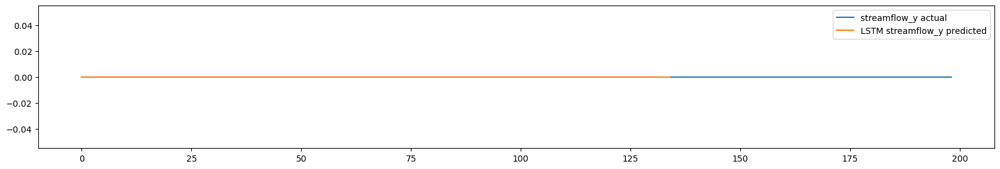

streamflow_y NSE: -2.6447


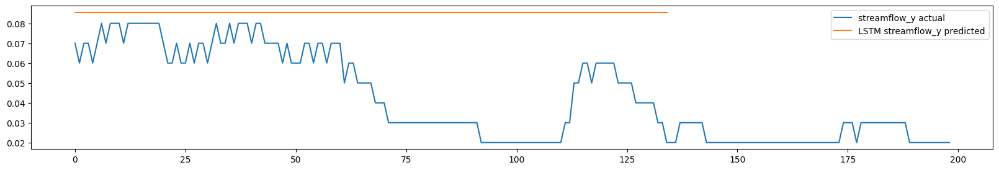

streamflow_y NSE: nan


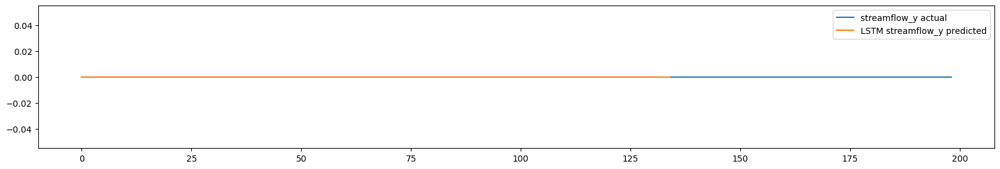

streamflow_y NSE: -2.389


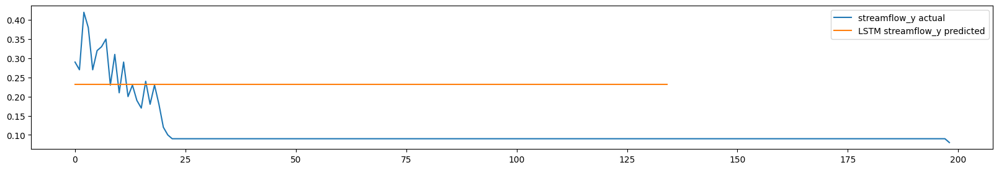

streamflow_y NSE: nan


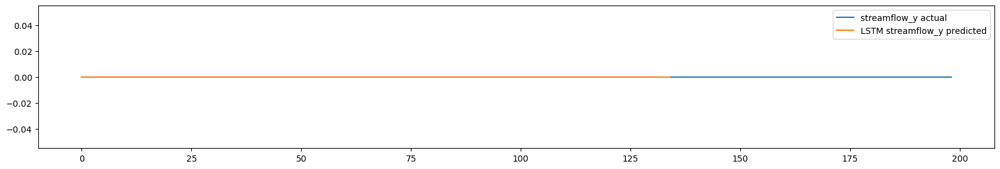

streamflow_y NSE: nan


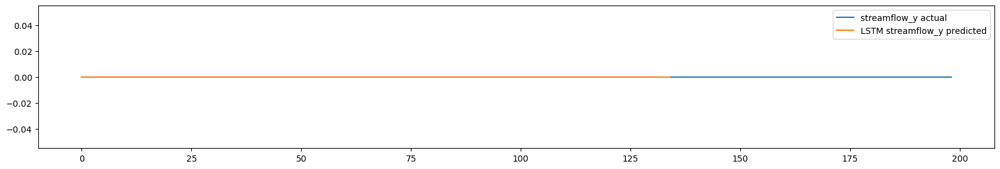

streamflow_y NSE: -1.7702


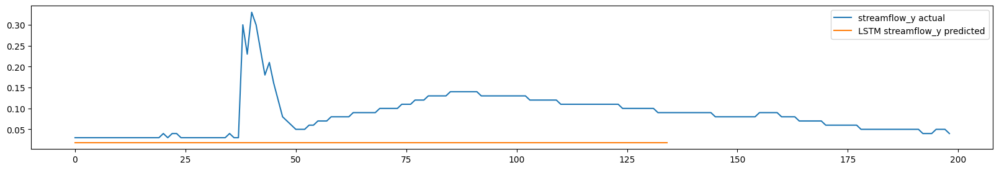

In [154]:
for ibuc in networks_for_val:
    check_validation_period(lstm, np_val_seq_X, ibuc)